## Imports

In [69]:
import os
import pathlib

import pandas as pd
import numpy as np

import src.SplitData
from src.GetCoherenceGraphsDataDictionary import GetCoherenceGraphsDataDictionary
from src.GetDatesToRemoveBasedOnWeather import GetDatesToRemoveBasedOnWeather, WeatherAspect
from src.Outputs import CoherenceGroundLineGraphs
from src.GetDFGroundData import GetDFGroundData
from src.MovingWindow import MovingWindow, Variable, GetRollingMean
from src.MovingWindowGraphs import MovingWindowScatterGraphs, MovingWindowLineGraphs, WindowTimeframe
from src.CorrelationRelationships import DataRelationships
from src.GetRollingPrecipitationDataframe import RollingPrecipitationDataframe
from src.CoherencePrecipitationGraphs import CoherencePrecipitationGraphs
from src.Spline import Spline
from src.GeoDataFrameLocationCoherence import GeoDataframeLocationCoherence

import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

import plotly.express as px
import plotly.graph_objects as go

## Define variables

In [70]:
current_directory = os.getcwd()
parent_directory = os.path.abspath(os.path.join(current_directory, "../../.."))
path_to_base_data_directory = f'{parent_directory}/OneDrive_rzw_phd_OneDrive/PhD'

### Set weather aspect to remove
Choices are:
* NONE : no data removal
* PRECIPITATION_TIME : remove data when precipitation has occurred within 6 hours of Sentinel-1 data collection
* PRECIPITATION_AMOUNT : remove data when the precipitation amount is more than 20 mm
* TEMPERATURE : remove data when the temperature is less than 2 degrees C
* SNOW_ONLY : remove data when there is snow present
* Combinations: TEMPERATURE_AND_PRECIPITATION_AMOUNT, TEMPERATURE_AND_PRECIPITATION_TIME, PRECIPITATION_TIME_AMOUNT

When focusing on the ground data only (in the first half of the code, data can only be reduced on temperature as there are no local precipitation measurements)

In [72]:
WEATHER_ASPECT_TO_REMOVE = WeatherAspect.TEMPERATURE

In [71]:
# Directories:
insar_unzipped = 'InSAR_unzipped_reference_date_spring'

root_directory = f'{path_to_base_data_directory}/Coding/{insar_unzipped}'
shape_files = f'{path_to_base_data_directory}/Data/water_table_Scotland/long_term_mun/shape_files'
ground_data_path = f'{path_to_base_data_directory}/Data/water_table_Scotland/long_term_mun/data/full_datasets'

#variables:
temp_water = 'Temp_Water'
water_level = 'Water_Level_meters'

locations = ['Munsary 1', 'Munsary 2', 'Munsary 3', 'Munsary 4']
reference_date_time = '20180402T175024'
reference_date = '2018-04-02'
site = 'MUN'
subsites = ['SITE1', 'SITE2', 'SITE3', 'SITE4']

WEATHER_TEMPERATURE_COLUMN_HEADING = 'Temp_Water'
WEATHER_TEMP_COLUMN_HEADING_WICK = 'tavg'

# regional weather
file_path_wick_weather = f'{path_to_base_data_directory}/Data/water_table_Scotland/Wick_T_ppt_snow.csv'

wick_weather_dataframe = pd.read_csv(file_path_wick_weather)

wick_weather_dataframe['Date'] = pd.to_datetime(wick_weather_dataframe['Date'])

/tmp/ipykernel_308732/2888928024.py:29: UserWarning:

Parsing dates in %d/%m/%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.



### Set save directory
Best to name based on how the data is being reduced e.g. temperature_precipitation

In [73]:
path_to_save_directory = '/home/rachel/local_python/long_munsary_check'

if not os.path.exists(path_to_save_directory):
    os.makedirs(path_to_save_directory)

# Local Conditions included (Ground data)

In [76]:
munsary_1_ground = pd.read_csv(f'{ground_data_path}/MUN_ENV_SITE1_WT.csv')
munsary_1_ground = munsary_1_ground.dropna(subset=[WEATHER_TEMPERATURE_COLUMN_HEADING])
munsary_2_ground = pd.read_csv(f'{ground_data_path}/MUN_ENV_SITE2_WT.csv')
munsary_2_ground = munsary_2_ground.dropna(subset=[WEATHER_TEMPERATURE_COLUMN_HEADING])
munsary_3_ground = pd.read_csv(f'{ground_data_path}/MUN_ENV_SITE3_WT.csv')
munsary_3_ground = munsary_3_ground.dropna(subset=[WEATHER_TEMPERATURE_COLUMN_HEADING])
munsary_4_ground = pd.read_csv(f'{ground_data_path}/MUN_ENV_SITE4_WT.csv')
munsary_4_ground = munsary_4_ground.dropna(subset=[WEATHER_TEMPERATURE_COLUMN_HEADING])

ground_data = [munsary_1_ground, munsary_2_ground, munsary_3_ground, munsary_4_ground]


,Munsary_site_1,Date_time,Date,Time,Water_level_meters,Temp_Water
24,24,12/04/2013 00:00,12/04/2013,00:00:00,-0.046,5.2
25,25,12/04/2013 00:30,12/04/2013,00:30:00,-0.047,5.2
26,26,12/04/2013 01:00,12/04/2013,01:00:00,-0.047,5.2
27,27,12/04/2013 01:30,12/04/2013,01:30:00,-0.047,5.2
28,28,12/04/2013 02:00,12/04/2013,02:00:00,-0.047,5.2
...,...,...,...,...,...,...
157912,157914,14/04/2022 09:00,14/04/2022,09:00:00,0.097,6.0
157913,157915,14/04/2022 09:30,14/04/2022,09:30:00,0.096,6.0
157914,157916,14/04/2022 10:00,14/04/2022,10:00:00,0.096,6.0
157915,157917,14/04/2022 10:30,14/04/2022,10:30:00,0.096,6.0


In [75]:
dates_to_remove_list = []

for data in ground_data:
    dates_to_remove_list.append(GetDatesToRemoveBasedOnWeather(data, WEATHER_ASPECT_TO_REMOVE,
                                                           WEATHER_TEMPERATURE_COLUMN_HEADING,
                                                           date_column_name='Date').get_dates_to_remove_from_coherence_data())



KeyError: 'prcp'

Maximum date is 2024-02-24 00:00:00
 The Soil file does not exist for the MUN SITE1 site
 The Soil file does not exist for the MUN SITE1 site
Maximum date is 2024-02-24 00:00:00
 The Soil file does not exist for the MUN SITE2 site
 The Soil file does not exist for the MUN SITE2 site
Maximum date is 2024-02-24 00:00:00
 The Soil file does not exist for the MUN SITE3 site
 The Soil file does not exist for the MUN SITE3 site
Maximum date is 2024-02-24 00:00:00
 The Soil file does not exist for the MUN SITE4 site
 The Soil file does not exist for the MUN SITE4 site


dict_keys(['Munsary 1', 'Munsary 2', 'Munsary 3', 'Munsary 4'])

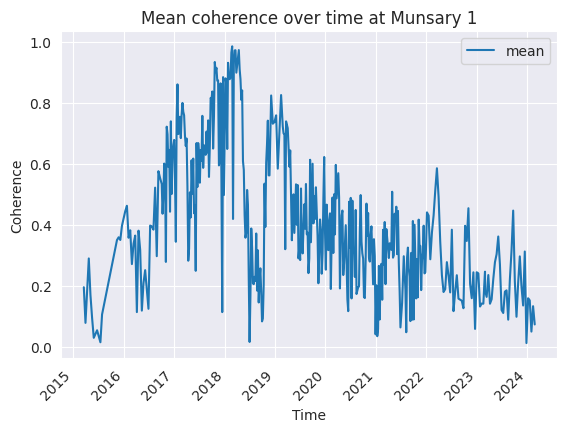

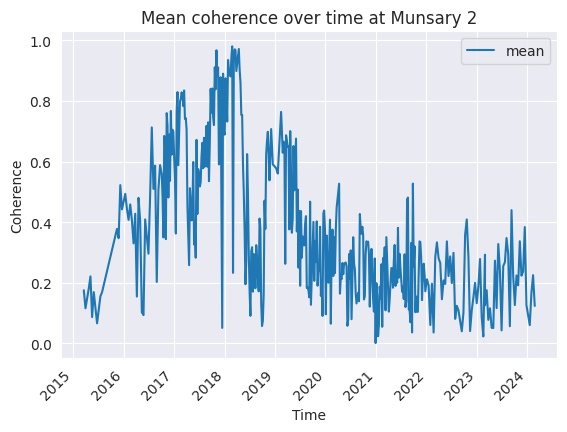

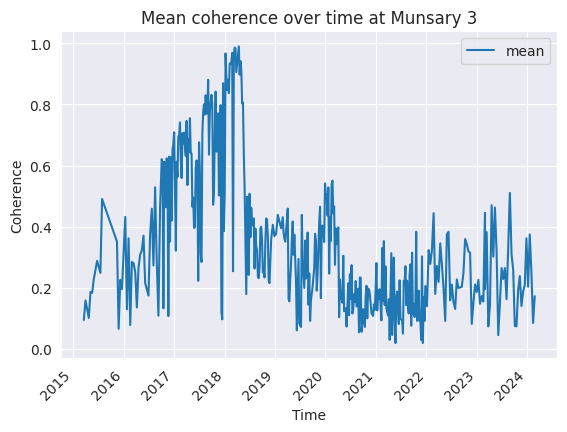

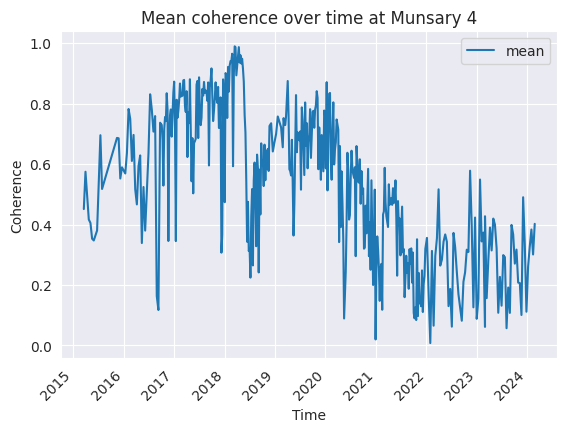

In [8]:
dictionary_of_data_dictionaries_munsary = {}


for location, subsite, dates_to_remove in zip(locations, subsites, dates_to_remove_list):
    data_dictionary = GetCoherenceGraphsDataDictionary(path=root_directory, ground_data_path=ground_data_path,
                                                       path_to_save_directory=path_to_save_directory, location=location,
                                                       reference_date_time=reference_date_time,
                                                       reference_date=reference_date, site=site, subsite=subsite,
                                                       path_to_points=shape_files,
                                                       input_data='point',
                                                       series_data_to_remove=dates_to_remove).run_method()
    dictionary_of_data_dictionaries_munsary[f'{location}'] = data_dictionary


dictionary_of_data_dictionaries_munsary.keys()

In [9]:
# for name in dictionary_of_data_dictionaries_munsary.keys():


munsary_1_dataframe = dictionary_of_data_dictionaries_munsary['Munsary 1']['coherence_ground_dataframe']
munsary_2_dataframe = dictionary_of_data_dictionaries_munsary['Munsary 2']['coherence_ground_dataframe']
munsary_3_dataframe = dictionary_of_data_dictionaries_munsary['Munsary 3']['coherence_ground_dataframe']
munsary_4_dataframe = dictionary_of_data_dictionaries_munsary['Munsary 4']['coherence_ground_dataframe']


munsary_1_dataframe.to_csv('/home/rachel/local_python/mapping_data/ground_data/Munsary 1.csv', index=True)
munsary_2_dataframe.to_csv('/home/rachel/local_python/mapping_data/ground_data/Munsary 2.csv', index=True)
munsary_3_dataframe.to_csv('/home/rachel/local_python/mapping_data/ground_data/Munsary 3.csv', index=True)
munsary_4_dataframe.to_csv('/home/rachel/local_python/mapping_data/ground_data/Munsary 4.csv', index=True)

munsary_1_dataframe

,mean,Temp_Water,Difference_Temp_Water,Logger ID,field_2,Ref,Lat,Long,Observatio,Dominant p,Water_level_meters,Difference_Water_level_meters,Date
Date,,,,,,,,,,,,,
2015-03-19,0.195460,5.810417,0.085636,DL 1,Hollow,ND,58.398267,-3.340247,Close to existing walrag,Sphagnum cuspidatum and Eriophorum angustifolium,-0.025667,-1.186328,2015-03-19
2015-03-31,0.078758,6.000000,0.121059,DL 1,Hollow,ND,58.398267,-3.340247,Close to existing walrag,Sphagnum cuspidatum and Eriophorum angustifolium,0.072146,-0.476255,2015-03-31
2015-04-24,0.289717,6.600000,0.233165,DL 1,Hollow,ND,58.398267,-3.340247,Close to existing walrag,Sphagnum cuspidatum and Eriophorum angustifolium,-0.045437,-1.329855,2015-04-24
2015-05-06,0.170020,6.900000,0.289218,DL 1,Hollow,ND,58.398267,-3.340247,Close to existing walrag,Sphagnum cuspidatum and Eriophorum angustifolium,0.127792,-0.072293,2015-05-06
2015-05-18,0.094118,7.100000,0.326586,DL 1,Hollow,ND,58.398267,-3.340247,Close to existing walrag,Sphagnum cuspidatum and Eriophorum angustifolium,-0.019917,-1.144586,2015-05-18
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-02-22,0.430887,5.754167,0.075127,DL 1,Hollow,ND,58.398267,-3.340247,Close to existing walrag,Sphagnum cuspidatum and Eriophorum angustifolium,0.131354,-0.046431,2022-02-22
2022-03-06,0.512951,5.700000,0.065006,DL 1,Hollow,ND,58.398267,-3.340247,Close to existing walrag,Sphagnum cuspidatum and Eriophorum angustifolium,-0.016021,-1.116304,2022-03-06
2022-03-18,0.585064,5.700000,0.065006,DL 1,Hollow,ND,58.398267,-3.340247,Close to existing walrag,Sphagnum cuspidatum and Eriophorum angustifolium,-0.021333,-1.154870,2022-03-18


In [10]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
plt.plot(munsary_1_dataframe.index, munsary_1_dataframe['mean'], label='Coherence Munsary 1', color='lightblue')
plt.plot(munsary_2_dataframe.index, munsary_2_dataframe['mean'], label='Coherence Munsary 2', color='blue')
plt.plot(munsary_3_dataframe.index, munsary_3_dataframe['mean'], label='Coherence Munsary 3', color='lightgreen')
plt.plot(munsary_4_dataframe.index, munsary_4_dataframe['mean'], label='Coherence Munsary 4', color='green')

plt.xlabel('Date')
plt.ylabel('InSAR Coherence')
plt.title('Temporal Line Graph InSAR Coherence')
plt.legend()
plt.grid()

plt.savefig(f'{path_to_save_directory}/Munsary_coherence_sites_1_4.png')

plt.close()

In [11]:
dictionary_of_data_dictionaries_munsary['Munsary 1'].keys()

dict_keys(['coherence_dataframe', 'coherence_ground_dataframe'])

In [12]:
for site, dataframes in dictionary_of_data_dictionaries_munsary.items():
    CoherenceGroundLineGraphs(merged_dataframe=dataframes['coherence_ground_dataframe'],
                              ground_data_variable=['Water_level_meters'], location=site,
                              path_to_directory=path_to_save_directory,
                              variable_name=['water level (m)']).graph_coherence_ground_data()

In [13]:
munsary_1_moving_windows_water_level = MovingWindow(munsary_1_dataframe,
                                                      'munsary_1',
                                                      precipitation_dataframe=None,
                                                      variable=Variable.WATER_LEVEL,
                                                      save_filepath=path_to_save_directory).get_moving_window()

munsary_2_moving_windows_water_level = MovingWindow(munsary_2_dataframe,
                                                      'munsary_2',
                                                      precipitation_dataframe=None,
                                                      variable=Variable.WATER_LEVEL,
                                                      save_filepath=path_to_save_directory).get_moving_window()

munsary_3_moving_windows_water_level = MovingWindow(munsary_3_dataframe,
                                                      'munsary_3',
                                                      precipitation_dataframe=None,
                                                      variable=Variable.WATER_LEVEL,
                                                      save_filepath=path_to_save_directory).get_moving_window()

munsary_4_moving_windows_water_level = MovingWindow(munsary_4_dataframe,
                                                      'munsary_4',
                                                      precipitation_dataframe=None,
                                                      variable = Variable.WATER_LEVEL,
                                                      save_filepath=path_to_save_directory).get_moving_window()



/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/numpy/lib/_function_base_impl.py:3057: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/numpy/lib/_function_base_impl.py:2914: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/numpy/lib/_function_base_impl.py:2914: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindow.py:164: RankWarning: Polyfit may be poorly conditioned
  slope, intercept = np.polyfit(subset['Coherence'], subset[self.variable], 1)
/home/rachel/local_python/insar_coherence_water_content_level_preci

In [14]:
munsary_1_dataframe.dropna(how='any', inplace=True)
munsary_2_dataframe.dropna(how='any', inplace=True)
munsary_3_dataframe.dropna(how='any', inplace=True)
munsary_4_dataframe.dropna(how='any', inplace=True)

In [15]:
moving_windows_list_water_level = [
    munsary_1_moving_windows_water_level,
    munsary_2_moving_windows_water_level,
    munsary_3_moving_windows_water_level,
    munsary_4_moving_windows_water_level]

subsite_names_water_level = ['munsary_1', 'munsary_2', 'munsary_3', 'munsary_4']


start_date = '2017-05-17'
end_date = '2018-10-19'

sub_dataset_dictionary = {}

for dictionary, site_name in zip(moving_windows_list_water_level, subsite_names_water_level):
    for key in dictionary.keys():
        dataframe = dictionary[key]
        # seasons
        seasons_dictionary = src.SplitData.split_seasons(dataframe)
        winter_dataframe = seasons_dictionary['winter']
        summer_dataframe = seasons_dictionary['summer']
        spring_dataframe = seasons_dictionary['spring']
        autumn_dataframe = seasons_dictionary['autumn']

        # warmer and cooler (same as above)
        warm_cooler_dictionary = src.SplitData.split_warm_cooler(dataframe)
        warmer_dataframe = warm_cooler_dictionary['warmer_months']
        cooler_dataframe = warm_cooler_dictionary['cooler_months']

        #focused by time
        focused_dataframe = src.SplitData.focus_data(dataframe, start_date, end_date)
        sub_dataset_dictionary[f'{site_name}_{key}'] = {
                        'overall': dataframe,
                        'winter': winter_dataframe,
                        'spring': spring_dataframe,
                        'summer': summer_dataframe,
                        'autumn': autumn_dataframe,
                        'warmer': warmer_dataframe,
                        'cooler': cooler_dataframe,
                        'focused': focused_dataframe
        }


In [16]:
sub_dataset_dictionary['munsary_4_one_month_window']['autumn'].head()

,Date,Coherence,Water_level_meters,days_difference,point_along_graph,EndSubset,Rolling Mean Coherence,Rolling Mean Water_level_meters,r2,gradient_changes,normalised_r2,normalised_gradient
9,2015-11-14,0.686474,-0.051542,108 days,240,2015-12-14,0.641305,-0.049847,0.354521,6.889733,0.354290,0.203984
10,2015-11-26,0.685221,-0.045542,12 days,252,2015-12-26,0.608878,-0.050674,0.813407,14.852434,0.813340,0.210489
11,2015-12-08,0.552219,-0.052458,12 days,264,2016-01-08,0.570707,-0.053240,1.000000,-11.185247,1.000000,0.189218
12,2015-12-20,0.589194,-0.054021,12 days,276,2016-01-20,0.578994,-0.049906,1.000000,-111.148951,1.000000,0.107558
34,2016-10-03,0.729235,-0.062375,12 days,564,2016-11-03,0.691755,-0.056049,0.026353,-15.362592,0.026005,0.185806


In [17]:
output_destinations = ['overall', 'winter', 'spring', 'summer', 'autumn', 'warmer', 'cooler', 'focused']

weather_aspect = 'temperature'

for site_name_time_period in sub_dataset_dictionary:
    for output_destination in output_destinations:
        dataframe = sub_dataset_dictionary[site_name_time_period][output_destination]
        save_path = f'{path_to_save_directory}/{output_destination}'
        if not os.path.exists(save_path):
            os.makedirs(save_path)
        name = "_".join(site_name_time_period.split("_")[:2])

        if 'month' in f'{site_name_time_period}':
            if 'one' in site_name_time_period:
                n = 1
            else:
                n = 2
            MovingWindowLineGraphs(dataframe, Variable.WATER_LEVEL, name,
                                   WindowTimeframe.MONTH, path_to_directory=save_path,
                                   n=n).graphs_line()
            MovingWindowScatterGraphs(dataframe, Variable.WATER_LEVEL, name,
                                      WindowTimeframe.MONTH, path_to_directory=save_path,
                                      n=n).graph_scatter()
            lag_df = DataRelationships(dataframe, dataframe,
                          second_variable='Rolling Mean Water_level_meters', second_variable_name='water level',
                          max_lag=-50, save_file_path=save_path, site_name=name,
                          time_scale=f'{n}_month').get_relationships()


        elif 'week' in site_name_time_period:
            MovingWindowLineGraphs(dataframe, Variable.WATER_LEVEL, name,
                                   WindowTimeframe.WEEK, path_to_directory=save_path,
                                   n=6).graphs_line()
            MovingWindowScatterGraphs(dataframe, Variable.WATER_LEVEL, name,
                                      WindowTimeframe.WEEK, path_to_directory=save_path,
                                      n=6).graph_scatter()
            lag_df = DataRelationships(dataframe, dataframe,
                          second_variable='Rolling Mean Water_level_meters', second_variable_name='water level',
                          max_lag=-50, save_file_path=save_path, site_name=name,
                          time_scale='6_week').get_relationships()



        Date  Coherence  Water_level_meters days_difference  \
0 2015-03-19   0.195460           -0.025667          0 days   
1 2015-03-31   0.078758            0.072146         12 days   
2 2015-04-24   0.289717           -0.045437         24 days   
3 2015-05-06   0.170020            0.127792         12 days   
4 2015-05-18   0.094118           -0.019917         12 days   

   point_along_graph  EndSubset  Rolling Mean Coherence  \
0                  0 2015-04-19                0.137109   
1                 12 2015-04-30                0.184238   
2                 36 2015-05-24                0.184618   
3                 48 2015-06-06                0.097982   
4                 60 2015-06-18                0.061963   

   Rolling Mean Water_level_meters        r2  gradient_changes  normalised_r2  \
0                         0.023240  1.000000          0.138156       1.000000   
1                         0.013354  1.000000         -6.572439       1.000000   
2                      

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:219: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Season'] = self.dataframe['Date'].dt.month.map(lambda m:
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipit

         Date  Coherence  Water_level_meters days_difference  \
0  2015-03-19   0.195460           -0.025667          0 days   
1  2015-03-31   0.078758            0.072146         12 days   
13 2016-01-13   0.444832            0.110167         24 days   
14 2016-01-25   0.462180            0.084896         12 days   
15 2016-02-06   0.357547            0.108187         12 days   

    point_along_graph  EndSubset  Rolling Mean Coherence  \
0                   0 2015-04-19                0.137109   
1                  12 2015-04-30                0.184238   
13                300 2016-02-13                0.421520   
14                312 2016-02-25                0.400528   
15                324 2016-03-06                0.336885   

    Rolling Mean Water_level_meters        r2  gradient_changes  \
0                          0.023240  1.000000          0.138156   
1                          0.013354  1.000000         -6.572439   
13                         0.101083  0.326711        

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:219: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Season'] = self.dataframe['Date'].dt.month.map(lambda m:
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipit

        Date  Coherence  Water_level_meters days_difference  \
2 2015-04-24   0.289717           -0.045437         24 days   
3 2015-05-06   0.170020            0.127792         12 days   
4 2015-05-18   0.094118           -0.019917         12 days   
5 2015-05-30   0.029809           -0.018146         12 days   
6 2015-06-23   0.054554           -0.018708         24 days   

   point_along_graph  EndSubset  Rolling Mean Coherence  \
2                 36 2015-05-24                0.184618   
3                 48 2015-06-06                0.097982   
4                 60 2015-06-18                0.061963   
5                 72 2015-06-30                0.042181   
6                 96 2015-07-23                0.034933   

   Rolling Mean Water_level_meters        r2  gradient_changes  normalised_r2  \
2                         0.020813  0.068812         -8.889149       0.068812   
3                         0.029910  0.781543         51.179134       0.781543   
4                      

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:219: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Season'] = self.dataframe['Date'].dt.month.map(lambda m:
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipit

         Date  Coherence  Water_level_meters days_difference  \
7  2015-07-17   0.015311            0.042437         24 days   
8  2015-07-29   0.106289           -0.029167         12 days   
27 2016-07-11   0.397434            0.083062         12 days   
28 2016-07-23   0.394480            0.061438         12 days   
29 2016-08-04   0.384024           -0.035729         12 days   

    point_along_graph  EndSubset  Rolling Mean Coherence  \
7                 120 2015-08-17                0.060800   
8                 132 2015-08-29                0.106289   
27                480 2016-08-11                0.391979   
28                492 2016-08-23                0.433360   
29                504 2016-09-04                0.400904   

    Rolling Mean Water_level_meters        r2  gradient_changes  \
7                          0.006635  1.000000        -94.391530   
8                         -0.029167       NaN        -18.125623   
27                         0.036257  0.998444       4

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:219: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Season'] = self.dataframe['Date'].dt.month.map(lambda m:
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipit

         Date  Coherence  Water_level_meters days_difference  \
9  2015-11-14   0.349984            0.057521        108 days   
10 2015-11-26   0.358997            0.101292         12 days   
11 2015-12-08   0.350236            0.082271         12 days   
12 2015-12-20   0.396609            0.076646         12 days   
34 2016-10-03   0.533416           -0.028729         12 days   

    point_along_graph  EndSubset  Rolling Mean Coherence  \
9                 240 2015-12-14                0.353072   
10                252 2015-12-26                0.368614   
11                264 2016-01-08                0.373422   
12                276 2016-01-20                0.420720   
34                564 2016-11-03                0.485890   

    Rolling Mean Water_level_meters        r2  gradient_changes  \
9                          0.080361  0.704733        860.359533   
10                         0.086736  0.286096        -70.470586   
11                         0.079458  1.000000        

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:80: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Month'] = self.dataframe['Date'].dt.month
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/Moving

        Date  Coherence  Water_level_meters days_difference  \
2 2015-04-24   0.289717           -0.045437         24 days   
3 2015-05-06   0.170020            0.127792         12 days   
4 2015-05-18   0.094118           -0.019917         12 days   
5 2015-05-30   0.029809           -0.018146         12 days   
6 2015-06-23   0.054554           -0.018708         24 days   

   point_along_graph  EndSubset  Rolling Mean Coherence  \
2                 36 2015-05-24                0.184618   
3                 48 2015-06-06                0.097982   
4                 60 2015-06-18                0.061963   
5                 72 2015-06-30                0.042181   
6                 96 2015-07-23                0.034933   

   Rolling Mean Water_level_meters        r2  gradient_changes  normalised_r2  \
2                         0.020813  0.068812         -8.889149       0.068812   
3                         0.029910  0.781543         51.179134       0.781543   
4                      

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:219: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Season'] = self.dataframe['Date'].dt.month.map(lambda m:
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipit

         Date  Coherence  Water_level_meters days_difference  \
0  2015-03-19   0.195460           -0.025667          0 days   
1  2015-03-31   0.078758            0.072146         12 days   
9  2015-11-14   0.349984            0.057521        108 days   
10 2015-11-26   0.358997            0.101292         12 days   
11 2015-12-08   0.350236            0.082271         12 days   

    point_along_graph  EndSubset  Rolling Mean Coherence  \
0                   0 2015-04-19                0.137109   
1                  12 2015-04-30                0.184238   
9                 240 2015-12-14                0.353072   
10                252 2015-12-26                0.368614   
11                264 2016-01-08                0.373422   

    Rolling Mean Water_level_meters        r2  gradient_changes  \
0                          0.023240  1.000000          0.138156   
1                          0.013354  1.000000         -6.572439   
9                          0.080361  0.704733        

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:219: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Season'] = self.dataframe['Date'].dt.month.map(lambda m:
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipit

         Date  Coherence  Water_level_meters days_difference  \
72 2017-05-19   0.616773           -0.100042          6 days   
73 2017-05-25   0.437721           -0.056333          6 days   
74 2017-05-31   0.463179           -0.055125          6 days   
75 2017-06-06   0.249177            0.018562          6 days   
76 2017-06-12   0.667540            0.108500          6 days   

    point_along_graph  EndSubset  Rolling Mean Coherence  \
72                792 2017-06-19                0.492984   
73                798 2017-06-25                0.501436   
74                804 2017-06-30                0.514179   
75                810 2017-07-06                0.548016   
76                816 2017-07-12                0.605737   

    Rolling Mean Water_level_meters        r2  gradient_changes  \
72                        -0.009799  0.018307         54.397651   
73                         0.001604  0.082649         91.715184   
74                         0.013192  0.051497        

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:219: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Season'] = self.dataframe['Date'].dt.month.map(lambda m:
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipit

         Date  Coherence  Water_level_meters days_difference  \
0  2015-03-19   0.195460           -0.025667          0 days   
1  2015-03-31   0.078758            0.072146         12 days   
13 2016-01-13   0.444832            0.110167         24 days   
14 2016-01-25   0.462180            0.084896         12 days   
15 2016-02-06   0.357547            0.108187         12 days   

    point_along_graph  EndSubset  Rolling Mean Coherence  \
0                   0 2015-04-30                0.187978   
1                  12 2015-05-12                0.179498   
13                300 2016-02-24                0.411604   
14                312 2016-03-07                0.368209   
15                324 2016-03-19                0.337155   

    Rolling Mean Water_level_meters        r2  gradient_changes  \
0                          0.000347  0.910061          0.107185   
1                          0.051500  0.519429         -7.069995   
13                         0.097875  0.069590        

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:219: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Season'] = self.dataframe['Date'].dt.month.map(lambda m:
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipit

        Date  Coherence  Water_level_meters days_difference  \
2 2015-04-24   0.289717           -0.045437         24 days   
3 2015-05-06   0.170020            0.127792         12 days   
4 2015-05-18   0.094118           -0.019917         12 days   
5 2015-05-30   0.029809           -0.018146         12 days   
6 2015-06-23   0.054554           -0.018708         24 days   

   point_along_graph  EndSubset  Rolling Mean Coherence  \
2                 36 2015-06-05                0.145916   
3                 48 2015-06-17                0.097982   
4                 60 2015-06-29                0.059494   
5                 72 2015-07-11                0.042181   
6                 96 2015-08-04                0.058718   

   Rolling Mean Water_level_meters        r2  gradient_changes  normalised_r2  \
2                         0.011073  0.000142         -0.290854       0.000142   
3                         0.029910  0.781543         51.179134       0.781543   
4                      

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:219: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Season'] = self.dataframe['Date'].dt.month.map(lambda m:
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipit

         Date  Coherence  Water_level_meters days_difference  \
7  2015-07-17   0.015311            0.042437         24 days   
8  2015-07-29   0.106289           -0.029167         12 days   
27 2016-07-11   0.397434            0.083062         12 days   
28 2016-07-23   0.394480            0.061438         12 days   
29 2016-08-04   0.384024           -0.035729         12 days   

    point_along_graph  EndSubset  Rolling Mean Coherence  \
7                 120 2015-08-28                0.060800   
8                 132 2015-09-09                0.106289   
27                480 2016-08-22                0.424379   
28                492 2016-09-03                0.399298   
29                504 2016-09-15                0.444539   

    Rolling Mean Water_level_meters        r2  gradient_changes  \
7                          0.006635  1.000000        -94.391530   
8                         -0.029167       NaN        -18.125623   
27                         0.033760  0.000062        

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:80: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Month'] = self.dataframe['Date'].dt.month
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/Moving

         Date  Coherence  Water_level_meters days_difference  \
9  2015-11-14   0.349984            0.057521        108 days   
10 2015-11-26   0.358997            0.101292         12 days   
11 2015-12-08   0.350236            0.082271         12 days   
12 2015-12-20   0.396609            0.076646         12 days   
34 2016-10-03   0.533416           -0.028729         12 days   

    point_along_graph  EndSubset  Rolling Mean Coherence  \
9                 240 2015-12-26                0.363956   
10                252 2016-01-07                0.368614   
11                264 2016-01-19                0.397225   
12                276 2016-01-31                0.434540   
34                564 2016-11-14                0.519504   

    Rolling Mean Water_level_meters        r2  gradient_changes  \
9                          0.079432  0.003204         11.103376   
10                         0.086736  0.286096        -70.470586   
11                         0.089694  0.614733        

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:80: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Month'] = self.dataframe['Date'].dt.month
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/Moving

        Date  Coherence  Water_level_meters days_difference  \
2 2015-04-24   0.289717           -0.045437         24 days   
3 2015-05-06   0.170020            0.127792         12 days   
4 2015-05-18   0.094118           -0.019917         12 days   
5 2015-05-30   0.029809           -0.018146         12 days   
6 2015-06-23   0.054554           -0.018708         24 days   

   point_along_graph  EndSubset  Rolling Mean Coherence  \
2                 36 2015-06-05                0.145916   
3                 48 2015-06-17                0.097982   
4                 60 2015-06-29                0.059494   
5                 72 2015-07-11                0.042181   
6                 96 2015-08-04                0.058718   

   Rolling Mean Water_level_meters        r2  gradient_changes  normalised_r2  \
2                         0.011073  0.000142         -0.290854       0.000142   
3                         0.029910  0.781543         51.179134       0.781543   
4                      

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:219: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Season'] = self.dataframe['Date'].dt.month.map(lambda m:
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipit

         Date  Coherence  Water_level_meters days_difference  \
0  2015-03-19   0.195460           -0.025667          0 days   
1  2015-03-31   0.078758            0.072146         12 days   
9  2015-11-14   0.349984            0.057521        108 days   
10 2015-11-26   0.358997            0.101292         12 days   
11 2015-12-08   0.350236            0.082271         12 days   

    point_along_graph  EndSubset  Rolling Mean Coherence  \
0                   0 2015-04-30                0.187978   
1                  12 2015-05-12                0.179498   
9                 240 2015-12-26                0.363956   
10                252 2016-01-07                0.368614   
11                264 2016-01-19                0.397225   

    Rolling Mean Water_level_meters        r2  gradient_changes  \
0                          0.000347  0.910061          0.107185   
1                          0.051500  0.519429         -7.069995   
9                          0.079432  0.003204        

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:219: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Season'] = self.dataframe['Date'].dt.month.map(lambda m:
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipit

         Date  Coherence  Water_level_meters days_difference  \
72 2017-05-19   0.616773           -0.100042          6 days   
73 2017-05-25   0.437721           -0.056333          6 days   
74 2017-05-31   0.463179           -0.055125          6 days   
75 2017-06-06   0.249177            0.018562          6 days   
76 2017-06-12   0.667540            0.108500          6 days   

    point_along_graph  EndSubset  Rolling Mean Coherence  \
72                792 2017-06-30                0.517913   
73                798 2017-07-06                0.520140   
74                804 2017-07-12                0.534434   
75                810 2017-07-18                0.560316   
76                816 2017-07-24                0.611766   

    Rolling Mean Water_level_meters        r2  gradient_changes  \
72                        -0.012917  0.004718         24.998287   
73                         0.003964  0.093189         92.654664   
74                         0.005161  0.041073        

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:219: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Season'] = self.dataframe['Date'].dt.month.map(lambda m:
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipit

         Date  Coherence  Water_level_meters days_difference  \
0  2015-03-19   0.195460           -0.025667          0 days   
1  2015-03-31   0.078758            0.072146         12 days   
13 2016-01-13   0.444832            0.110167         24 days   
14 2016-01-25   0.462180            0.084896         12 days   
15 2016-02-06   0.357547            0.108187         12 days   

    point_along_graph  EndSubset  Rolling Mean Coherence  \
0                   0 2015-05-19                0.165615   
1                  12 2015-05-31                0.132484   
13                300 2016-03-13                0.383533   
14                312 2016-03-25                0.362160   
15                324 2016-04-06                0.342646   

    Rolling Mean Water_level_meters        r2  gradient_changes  \
0                          0.021783  0.176850          0.082868   
1                          0.023287  0.014583         -1.016879   
13                         0.099775  0.183277        

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:219: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Season'] = self.dataframe['Date'].dt.month.map(lambda m:
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipit

        Date  Coherence  Water_level_meters days_difference  \
2 2015-04-24   0.289717           -0.045437         24 days   
3 2015-05-06   0.170020            0.127792         12 days   
4 2015-05-18   0.094118           -0.019917         12 days   
5 2015-05-30   0.029809           -0.018146         12 days   
6 2015-06-23   0.054554           -0.018708         24 days   

   point_along_graph  EndSubset  Rolling Mean Coherence  \
2                 36 2015-06-24                0.127644   
3                 48 2015-07-06                0.087125   
4                 60 2015-07-18                0.048448   
5                 72 2015-07-30                0.051491   
6                 96 2015-08-23                0.058718   

   Rolling Mean Water_level_meters        r2  gradient_changes  normalised_r2  \
2                         0.005117  0.004063          1.519310       0.004063   
3                         0.017755  0.805324         51.489710       0.805324   
4                      

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:80: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Month'] = self.dataframe['Date'].dt.month
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/Moving

         Date  Coherence  Water_level_meters days_difference  \
7  2015-07-17   0.015311            0.042437         24 days   
8  2015-07-29   0.106289           -0.029167         12 days   
27 2016-07-11   0.397434            0.083062         12 days   
28 2016-07-23   0.394480            0.061438         12 days   
29 2016-08-04   0.384024           -0.035729         12 days   

    point_along_graph  EndSubset  Rolling Mean Coherence  \
7                 120 2015-09-17                0.060800   
8                 132 2015-09-29                0.106289   
27                480 2016-09-11                0.428345   
28                492 2016-09-23                0.454306   
29                504 2016-10-04                0.477462   

    Rolling Mean Water_level_meters        r2  gradient_changes  \
7                          0.006635  1.000000        -94.391530   
8                         -0.029167       NaN        -18.125623   
27                         0.010656  0.014991        

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:80: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Month'] = self.dataframe['Date'].dt.month
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/Moving

         Date  Coherence  Water_level_meters days_difference  \
9  2015-11-14   0.349984            0.057521        108 days   
10 2015-11-26   0.358997            0.101292         12 days   
11 2015-12-08   0.350236            0.082271         12 days   
12 2015-12-20   0.396609            0.076646         12 days   
34 2016-10-03   0.533416           -0.028729         12 days   

    point_along_graph  EndSubset  Rolling Mean Coherence  \
9                 240 2016-01-14                0.380131   
10                252 2016-01-26                0.402571   
11                264 2016-02-08                0.402281   
12                276 2016-02-20                0.408605   
34                564 2016-12-03                0.546382   

    Rolling Mean Water_level_meters        r2  gradient_changes  \
9                          0.085579  0.364552         73.553017   
10                         0.091054  0.036751         13.662979   
11                         0.092433  0.004768        

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:80: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Month'] = self.dataframe['Date'].dt.month
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/Moving

        Date  Coherence  Water_level_meters days_difference  \
2 2015-04-24   0.289717           -0.045437         24 days   
3 2015-05-06   0.170020            0.127792         12 days   
4 2015-05-18   0.094118           -0.019917         12 days   
5 2015-05-30   0.029809           -0.018146         12 days   
6 2015-06-23   0.054554           -0.018708         24 days   

   point_along_graph  EndSubset  Rolling Mean Coherence  \
2                 36 2015-06-24                0.127644   
3                 48 2015-07-06                0.087125   
4                 60 2015-07-18                0.048448   
5                 72 2015-07-30                0.051491   
6                 96 2015-08-23                0.058718   

   Rolling Mean Water_level_meters        r2  gradient_changes  normalised_r2  \
2                         0.005117  0.004063          1.519310       0.004063   
3                         0.017755  0.805324         51.489710       0.805324   
4                      

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:219: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Season'] = self.dataframe['Date'].dt.month.map(lambda m:
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipit

         Date  Coherence  Water_level_meters days_difference  \
0  2015-03-19   0.195460           -0.025667          0 days   
1  2015-03-31   0.078758            0.072146         12 days   
9  2015-11-14   0.349984            0.057521        108 days   
10 2015-11-26   0.358997            0.101292         12 days   
11 2015-12-08   0.350236            0.082271         12 days   

    point_along_graph  EndSubset  Rolling Mean Coherence  \
0                   0 2015-05-19                0.165615   
1                  12 2015-05-31                0.132484   
9                 240 2016-01-14                0.380131   
10                252 2016-01-26                0.402571   
11                264 2016-02-08                0.402281   

    Rolling Mean Water_level_meters        r2  gradient_changes  \
0                          0.021783  0.176850          0.082868   
1                          0.023287  0.014583         -1.016879   
9                          0.085579  0.364552        

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:219: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Season'] = self.dataframe['Date'].dt.month.map(lambda m:
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipit

         Date  Coherence  Water_level_meters days_difference  \
72 2017-05-19   0.616773           -0.100042          6 days   
73 2017-05-25   0.437721           -0.056333          6 days   
74 2017-05-31   0.463179           -0.055125          6 days   
75 2017-06-06   0.249177            0.018562          6 days   
76 2017-06-12   0.667540            0.108500          6 days   

    point_along_graph  EndSubset  Rolling Mean Coherence  \
72                792 2017-07-19                0.549929   
73                798 2017-07-25                0.562653   
74                804 2017-07-31                0.576174   
75                810 2017-08-06                0.594107   
76                816 2017-08-12                0.631047   

    Rolling Mean Water_level_meters        r2  gradient_changes  \
72                        -0.022407  0.000080         -3.303218   
73                        -0.014727  0.004145         19.412681   
74                        -0.005409  0.000015        

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:219: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Season'] = self.dataframe['Date'].dt.month.map(lambda m:
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipit

         Date  Coherence  Water_level_meters days_difference  \
0  2015-03-19   0.175081           -0.105771          0 days   
1  2015-03-31   0.115825           -0.009333         12 days   
13 2016-01-13   0.493279            0.008646         24 days   
14 2016-01-25   0.444239           -0.018604         12 days   
15 2016-02-06   0.407610            0.004208         12 days   

    point_along_graph  EndSubset  Rolling Mean Coherence  \
0                   0 2015-04-19                0.145453   
1                  12 2015-04-30                0.148707   
13                300 2016-02-13                0.448376   
14                312 2016-02-25                0.436819   
15                324 2016-03-06                0.424210   

    Rolling Mean Water_level_meters        r2  gradient_changes  \
0                         -0.057552  1.000000          0.179168   
1                         -0.073604  1.000000        -23.238271   
13                        -0.001917  0.054571        

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:219: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Season'] = self.dataframe['Date'].dt.month.map(lambda m:
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipit

        Date  Coherence  Water_level_meters days_difference  \
2 2015-04-24   0.181588           -0.137875         24 days   
3 2015-05-06   0.221038            0.072188         12 days   
4 2015-05-18   0.086632           -0.083583         12 days   
5 2015-05-30   0.169082           -0.086250         12 days   
6 2015-06-23   0.066028           -0.077167         24 days   

   point_along_graph  EndSubset  Rolling Mean Coherence  \
2                 36 2015-05-24                0.163086   
3                 48 2015-06-06                0.158917   
4                 60 2015-06-18                0.127857   
5                 72 2015-06-30                0.117555   
6                 96 2015-07-23                0.110600   

   Rolling Mean Water_level_meters        r2  gradient_changes  normalised_r2  \
2                        -0.049757  0.283541         30.068458       0.283537   
3                        -0.032549  0.615791         50.214258       0.615789   
4                      

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:219: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Season'] = self.dataframe['Date'].dt.month.map(lambda m:
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipit

         Date  Coherence  Water_level_meters days_difference  \
7  2015-07-17   0.155172           -0.031583         24 days   
8  2015-07-29   0.168774           -0.087708         12 days   
27 2016-07-11   0.488920           -0.012750         12 days   
28 2016-07-23   0.712925           -0.043583         12 days   
29 2016-08-04   0.509893           -0.091562         12 days   

    point_along_graph  EndSubset  Rolling Mean Coherence  \
7                 120 2015-08-17                0.161973   
8                 132 2015-08-29                0.168774   
27                480 2016-08-11                0.570579   
28                492 2016-08-23                0.603152   
29                504 2016-09-04                0.433024   

    Rolling Mean Water_level_meters        r2  gradient_changes  \
7                         -0.059646  1.000000       -494.511329   
8                         -0.087708       NaN        -34.342624   
27                        -0.049299  0.001606        

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:219: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Season'] = self.dataframe['Date'].dt.month.map(lambda m:
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipit

         Date  Coherence  Water_level_meters days_difference  \
9  2015-11-14   0.377923           -0.036083        108 days   
10 2015-11-26   0.347169            0.011792         12 days   
11 2015-12-08   0.522411           -0.016958         12 days   
12 2015-12-20   0.442235           -0.025375         12 days   
34 2016-10-03   0.558182           -0.096646         12 days   

    point_along_graph  EndSubset  Rolling Mean Coherence  \
9                 240 2015-12-14                0.415834   
10                252 2015-12-26                0.437272   
11                264 2016-01-08                0.482323   
12                276 2016-01-20                0.467757   
34                564 2016-11-03                0.511820   

    Rolling Mean Water_level_meters        r2  gradient_changes  \
9                         -0.013750  0.076712        -17.103553   
10                        -0.010181  0.592620        -43.031053   
11                        -0.021167  1.000000        

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:219: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Season'] = self.dataframe['Date'].dt.month.map(lambda m:
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipit

        Date  Coherence  Water_level_meters days_difference  \
2 2015-04-24   0.181588           -0.137875         24 days   
3 2015-05-06   0.221038            0.072188         12 days   
4 2015-05-18   0.086632           -0.083583         12 days   
5 2015-05-30   0.169082           -0.086250         12 days   
6 2015-06-23   0.066028           -0.077167         24 days   

   point_along_graph  EndSubset  Rolling Mean Coherence  \
2                 36 2015-05-24                0.163086   
3                 48 2015-06-06                0.158917   
4                 60 2015-06-18                0.127857   
5                 72 2015-06-30                0.117555   
6                 96 2015-07-23                0.110600   

   Rolling Mean Water_level_meters        r2  gradient_changes  normalised_r2  \
2                        -0.049757  0.283541         30.068458       0.283537   
3                        -0.032549  0.615791         50.214258       0.615789   
4                      

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:219: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Season'] = self.dataframe['Date'].dt.month.map(lambda m:
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipit

         Date  Coherence  Water_level_meters days_difference  \
0  2015-03-19   0.175081           -0.105771          0 days   
1  2015-03-31   0.115825           -0.009333         12 days   
9  2015-11-14   0.377923           -0.036083        108 days   
10 2015-11-26   0.347169            0.011792         12 days   
11 2015-12-08   0.522411           -0.016958         12 days   

    point_along_graph  EndSubset  Rolling Mean Coherence  \
0                   0 2015-04-19                0.145453   
1                  12 2015-04-30                0.148707   
9                 240 2015-12-14                0.415834   
10                252 2015-12-26                0.437272   
11                264 2016-01-08                0.482323   

    Rolling Mean Water_level_meters        r2  gradient_changes  \
0                         -0.057552  1.000000          0.179168   
1                         -0.073604  1.000000        -23.238271   
9                         -0.013750  0.076712        

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:219: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Season'] = self.dataframe['Date'].dt.month.map(lambda m:
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipit

         Date  Coherence  Water_level_meters days_difference  \
72 2017-05-19   0.598665           -0.213562          6 days   
73 2017-05-25   0.326226           -0.156771          6 days   
74 2017-05-31   0.375838           -0.160312          6 days   
75 2017-06-06   0.282698           -0.080917          6 days   
76 2017-06-12   0.671791           -0.018771          6 days   

    point_along_graph  EndSubset  Rolling Mean Coherence  \
72                792 2017-06-19                0.447029   
73                798 2017-06-25                0.443138   
74                804 2017-06-30                0.466521   
75                810 2017-07-06                0.503183   
76                816 2017-07-12                0.550197   

    Rolling Mean Water_level_meters        r2  gradient_changes  \
72                        -0.116865  0.022994         55.470835   
73                        -0.104722  0.224504        142.360463   
74                        -0.094312  0.134927        

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:219: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Season'] = self.dataframe['Date'].dt.month.map(lambda m:
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipit

         Date  Coherence  Water_level_meters days_difference  \
0  2015-03-19   0.175081           -0.105771          0 days   
1  2015-03-31   0.115825           -0.009333         12 days   
13 2016-01-13   0.493279            0.008646         24 days   
14 2016-01-25   0.444239           -0.018604         12 days   
15 2016-02-06   0.407610            0.004208         12 days   

    point_along_graph  EndSubset  Rolling Mean Coherence  \
0                   0 2015-04-30                0.157498   
1                  12 2015-05-12                0.172817   
13                300 2016-02-24                0.450934   
14                312 2016-03-07                0.429217   
15                324 2016-03-19                0.400669   

    Rolling Mean Water_level_meters        r2  gradient_changes  \
0                         -0.084326  0.976954          0.203079   
1                         -0.025007  0.062013          5.843351   
13                        -0.005938  0.012348        

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:219: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Season'] = self.dataframe['Date'].dt.month.map(lambda m:
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipit

        Date  Coherence  Water_level_meters days_difference  \
2 2015-04-24   0.181588           -0.137875         24 days   
3 2015-05-06   0.221038            0.072188         12 days   
4 2015-05-18   0.086632           -0.083583         12 days   
5 2015-05-30   0.169082           -0.086250         12 days   
6 2015-06-23   0.066028           -0.077167         24 days   

   point_along_graph  EndSubset  Rolling Mean Coherence  \
2                 36 2015-06-05                0.164585   
3                 48 2015-06-17                0.158917   
4                 60 2015-06-29                0.107247   
5                 72 2015-07-11                0.117555   
6                 96 2015-08-04                0.129991   

   Rolling Mean Water_level_meters        r2  gradient_changes  normalised_r2  \
2                        -0.058880  0.260358         29.358914       0.260358   
3                        -0.032549  0.615791         50.214258       0.615791   
4                      

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:219: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Season'] = self.dataframe['Date'].dt.month.map(lambda m:
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipit

         Date  Coherence  Water_level_meters days_difference  \
7  2015-07-17   0.155172           -0.031583         24 days   
8  2015-07-29   0.168774           -0.087708         12 days   
27 2016-07-11   0.488920           -0.012750         12 days   
28 2016-07-23   0.712925           -0.043583         12 days   
29 2016-08-04   0.509893           -0.091562         12 days   

    point_along_graph  EndSubset  Rolling Mean Coherence  \
7                 120 2015-08-28                0.161973   
8                 132 2015-09-09                0.168774   
27                480 2016-08-22                0.574594   
28                492 2016-09-03                0.502999   
29                504 2016-09-15                0.451642   

    Rolling Mean Water_level_meters        r2  gradient_changes  \
7                         -0.059646  1.000000       -494.511329   
8                         -0.087708       NaN        -34.342624   
27                        -0.052927  0.000470        

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:219: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Season'] = self.dataframe['Date'].dt.month.map(lambda m:
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipit

         Date  Coherence  Water_level_meters days_difference  \
9  2015-11-14   0.377923           -0.036083        108 days   
10 2015-11-26   0.347169            0.011792         12 days   
11 2015-12-08   0.522411           -0.016958         12 days   
12 2015-12-20   0.442235           -0.025375         12 days   
34 2016-10-03   0.558182           -0.096646         12 days   

    point_along_graph  EndSubset  Rolling Mean Coherence  \
9                 240 2015-12-26                0.422434   
10                252 2016-01-07                0.437272   
11                264 2016-01-19                0.485975   
12                276 2016-01-31                0.459918   
34                564 2016-11-14                0.547281   

    Rolling Mean Water_level_meters        r2  gradient_changes  \
9                         -0.016656  0.096086        -19.668578   
10                        -0.010181  0.592620        -43.031053   
11                        -0.011229  0.148998        

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:80: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Month'] = self.dataframe['Date'].dt.month
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/Moving

        Date  Coherence  Water_level_meters days_difference  \
2 2015-04-24   0.181588           -0.137875         24 days   
3 2015-05-06   0.221038            0.072188         12 days   
4 2015-05-18   0.086632           -0.083583         12 days   
5 2015-05-30   0.169082           -0.086250         12 days   
6 2015-06-23   0.066028           -0.077167         24 days   

   point_along_graph  EndSubset  Rolling Mean Coherence  \
2                 36 2015-06-05                0.164585   
3                 48 2015-06-17                0.158917   
4                 60 2015-06-29                0.107247   
5                 72 2015-07-11                0.117555   
6                 96 2015-08-04                0.129991   

   Rolling Mean Water_level_meters        r2  gradient_changes  normalised_r2  \
2                        -0.058880  0.260358         29.358914       0.260358   
3                        -0.032549  0.615791         50.214258       0.615791   
4                      

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:219: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Season'] = self.dataframe['Date'].dt.month.map(lambda m:
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipit

         Date  Coherence  Water_level_meters days_difference  \
0  2015-03-19   0.175081           -0.105771          0 days   
1  2015-03-31   0.115825           -0.009333         12 days   
9  2015-11-14   0.377923           -0.036083        108 days   
10 2015-11-26   0.347169            0.011792         12 days   
11 2015-12-08   0.522411           -0.016958         12 days   

    point_along_graph  EndSubset  Rolling Mean Coherence  \
0                   0 2015-04-30                0.157498   
1                  12 2015-05-12                0.172817   
9                 240 2015-12-26                0.422434   
10                252 2016-01-07                0.437272   
11                264 2016-01-19                0.485975   

    Rolling Mean Water_level_meters        r2  gradient_changes  \
0                         -0.084326  0.976954          0.203079   
1                         -0.025007  0.062013          5.843351   
9                         -0.016656  0.096086        

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:219: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Season'] = self.dataframe['Date'].dt.month.map(lambda m:
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipit

         Date  Coherence  Water_level_meters days_difference  \
72 2017-05-19   0.598665           -0.213562          6 days   
73 2017-05-25   0.326226           -0.156771          6 days   
74 2017-05-31   0.375838           -0.160312          6 days   
75 2017-06-06   0.282698           -0.080917          6 days   
76 2017-06-12   0.671791           -0.018771          6 days   

    point_along_graph  EndSubset  Rolling Mean Coherence  \
72                792 2017-06-30                0.465356   
73                798 2017-07-06                0.459711   
74                804 2017-07-12                0.487075   
75                810 2017-07-18                0.509500   
76                816 2017-07-24                0.557316   

    Rolling Mean Water_level_meters        r2  gradient_changes  \
72                        -0.120271  0.009630         34.235528   
73                        -0.102955  0.227404        137.079266   
74                        -0.104039  0.067059        

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:219: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Season'] = self.dataframe['Date'].dt.month.map(lambda m:
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipit

         Date  Coherence  Water_level_meters days_difference  \
0  2015-03-19   0.175081           -0.105771          0 days   
1  2015-03-31   0.115825           -0.009333         12 days   
13 2016-01-13   0.493279            0.008646         24 days   
14 2016-01-25   0.444239           -0.018604         12 days   
15 2016-02-06   0.407610            0.004208         12 days   

    point_along_graph  EndSubset  Rolling Mean Coherence  \
0                   0 2015-05-19                0.156033   
1                  12 2015-05-31                0.154833   
13                300 2016-03-13                0.442029   
14                312 2016-03-25                0.409383   
15                324 2016-04-06                0.406078   

    Rolling Mean Water_level_meters        r2  gradient_changes  \
0                         -0.052875  0.085385         -0.124115   
1                         -0.048971  0.114433          6.068047   
13                        -0.004442  0.002592        

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:80: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Month'] = self.dataframe['Date'].dt.month
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/Moving

        Date  Coherence  Water_level_meters days_difference  \
2 2015-04-24   0.181588           -0.137875         24 days   
3 2015-05-06   0.221038            0.072188         12 days   
4 2015-05-18   0.086632           -0.083583         12 days   
5 2015-05-30   0.169082           -0.086250         12 days   
6 2015-06-23   0.066028           -0.077167         24 days   

   point_along_graph  EndSubset  Rolling Mean Coherence  \
2                 36 2015-06-24                0.144874   
3                 48 2015-07-06                0.135695   
4                 60 2015-07-18                0.119228   
5                 72 2015-07-30                0.139764   
6                 96 2015-08-23                0.129991   

   Rolling Mean Water_level_meters        r2  gradient_changes  normalised_r2  \
2                        -0.062537  0.199124         19.164331       0.199117   
3                        -0.043703  0.579038         38.953337       0.579035   
4                      

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:80: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Month'] = self.dataframe['Date'].dt.month
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/Moving

         Date  Coherence  Water_level_meters days_difference  \
7  2015-07-17   0.155172           -0.031583         24 days   
8  2015-07-29   0.168774           -0.087708         12 days   
27 2016-07-11   0.488920           -0.012750         12 days   
28 2016-07-23   0.712925           -0.043583         12 days   
29 2016-08-04   0.509893           -0.091562         12 days   

    point_along_graph  EndSubset  Rolling Mean Coherence  \
7                 120 2015-09-17                0.161973   
8                 132 2015-09-29                0.168774   
27                480 2016-09-11                0.501402   
28                492 2016-09-23                0.517977   
29                504 2016-10-04                0.492186   

    Rolling Mean Water_level_meters        r2  gradient_changes  \
7                         -0.059646  1.000000       -494.511329   
8                         -0.087708       NaN        -34.342624   
27                        -0.069226  0.159193        

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:80: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Month'] = self.dataframe['Date'].dt.month
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/Moving

         Date  Coherence  Water_level_meters days_difference  \
9  2015-11-14   0.377923           -0.036083        108 days   
10 2015-11-26   0.347169            0.011792         12 days   
11 2015-12-08   0.522411           -0.016958         12 days   
12 2015-12-20   0.442235           -0.025375         12 days   
34 2016-10-03   0.558182           -0.096646         12 days   

    point_along_graph  EndSubset  Rolling Mean Coherence  \
9                 240 2016-01-14                0.436603   
10                252 2016-01-26                0.449866   
11                264 2016-02-08                0.461955   
12                276 2016-02-20                0.449194   
34                564 2016-12-03                0.568718   

    Rolling Mean Water_level_meters        r2  gradient_changes  \
9                         -0.011596  0.000052         -0.502977   
10                        -0.008100  0.151005        -25.009122   
11                        -0.009617  0.003116        

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:80: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Month'] = self.dataframe['Date'].dt.month
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/Moving

        Date  Coherence  Water_level_meters days_difference  \
2 2015-04-24   0.181588           -0.137875         24 days   
3 2015-05-06   0.221038            0.072188         12 days   
4 2015-05-18   0.086632           -0.083583         12 days   
5 2015-05-30   0.169082           -0.086250         12 days   
6 2015-06-23   0.066028           -0.077167         24 days   

   point_along_graph  EndSubset  Rolling Mean Coherence  \
2                 36 2015-06-24                0.144874   
3                 48 2015-07-06                0.135695   
4                 60 2015-07-18                0.119228   
5                 72 2015-07-30                0.139764   
6                 96 2015-08-23                0.129991   

   Rolling Mean Water_level_meters        r2  gradient_changes  normalised_r2  \
2                        -0.062537  0.199124         19.164331       0.199117   
3                        -0.043703  0.579038         38.953337       0.579035   
4                      

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:219: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Season'] = self.dataframe['Date'].dt.month.map(lambda m:
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipit

         Date  Coherence  Water_level_meters days_difference  \
0  2015-03-19   0.175081           -0.105771          0 days   
1  2015-03-31   0.115825           -0.009333         12 days   
9  2015-11-14   0.377923           -0.036083        108 days   
10 2015-11-26   0.347169            0.011792         12 days   
11 2015-12-08   0.522411           -0.016958         12 days   

    point_along_graph  EndSubset  Rolling Mean Coherence  \
0                   0 2015-05-19                0.156033   
1                  12 2015-05-31                0.154833   
9                 240 2016-01-14                0.436603   
10                252 2016-01-26                0.449866   
11                264 2016-02-08                0.461955   

    Rolling Mean Water_level_meters        r2  gradient_changes  \
0                         -0.052875  0.085385         -0.124115   
1                         -0.048971  0.114433          6.068047   
9                         -0.011596  0.000052        

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:219: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Season'] = self.dataframe['Date'].dt.month.map(lambda m:
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipit

         Date  Coherence  Water_level_meters days_difference  \
72 2017-05-19   0.598665           -0.213562          6 days   
73 2017-05-25   0.326226           -0.156771          6 days   
74 2017-05-31   0.375838           -0.160312          6 days   
75 2017-06-06   0.282698           -0.080917          6 days   
76 2017-06-12   0.671791           -0.018771          6 days   

    point_along_graph  EndSubset  Rolling Mean Coherence  \
72                792 2017-07-19                0.498604   
73                798 2017-07-25                0.504365   
74                804 2017-07-31                0.527271   
75                810 2017-08-06                0.554797   
76                816 2017-08-12                0.582148   

    Rolling Mean Water_level_meters        r2  gradient_changes  \
72                        -0.132648  0.000446         -7.889274   
73                        -0.122519  0.023573         48.488038   
74                        -0.115239  0.009573        

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:219: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Season'] = self.dataframe['Date'].dt.month.map(lambda m:
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipit

         Date  Coherence  Water_level_meters days_difference  \
0  2015-03-19   0.095092           -0.067708          0 days   
1  2015-03-31   0.159199           -0.047104         12 days   
13 2016-01-13   0.432374           -0.045167         24 days   
14 2016-01-25   0.129983           -0.054813         12 days   
15 2016-02-06   0.362339           -0.046500         12 days   

    point_along_graph  EndSubset  Rolling Mean Coherence  \
0                   0 2015-04-19                0.127145   
1                  12 2015-04-30                0.130512   
13                300 2016-02-13                0.308232   
14                312 2016-02-25                0.190259   
15                324 2016-03-06                0.242016   

    Rolling Mean Water_level_meters        r2  gradient_changes  \
0                         -0.057406  1.000000         -0.098271   
1                         -0.070375  1.000000          9.558361   
13                        -0.048826  0.990969        

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:219: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Season'] = self.dataframe['Date'].dt.month.map(lambda m:
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipit

        Date  Coherence  Water_level_meters days_difference  \
2 2015-04-24   0.101826           -0.093646         24 days   
3 2015-05-06   0.187008           -0.036396         12 days   
4 2015-05-18   0.183892           -0.063646         12 days   
5 2015-05-30   0.227585           -0.056500         12 days   
6 2015-06-23   0.288551           -0.058125         24 days   

   point_along_graph  EndSubset  Rolling Mean Coherence  \
2                 36 2015-05-24                0.157575   
3                 48 2015-06-06                0.199495   
4                 60 2015-06-18                0.205739   
5                 72 2015-06-30                0.258068   
6                 96 2015-07-23                0.268858   

   Rolling Mean Water_level_meters        r2  gradient_changes  normalised_r2  \
2                        -0.064563  0.800030         18.940332       0.800026   
3                        -0.052181  0.041035         -5.664683       0.041019   
4                      

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:219: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Season'] = self.dataframe['Date'].dt.month.map(lambda m:
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipit

         Date  Coherence  Water_level_meters days_difference  \
7  2015-07-17   0.249165           -0.040375         24 days   
8  2015-07-29   0.490991           -0.054958         12 days   
27 2016-07-11   0.375819            0.009521         12 days   
28 2016-07-23   0.459120            0.005667         12 days   
29 2016-08-04   0.273538            0.007354         12 days   

    point_along_graph  EndSubset  Rolling Mean Coherence  \
7                 120 2015-08-17                0.370078   
8                 132 2015-08-29                0.490991   
27                480 2016-08-11                0.369492   
28                492 2016-08-23                0.420615   
29                504 2016-09-04                0.362619   

    Rolling Mean Water_level_meters        r2  gradient_changes  \
7                         -0.047667  1.000000         -7.261958   
8                         -0.054958       NaN         -7.415095   
27                         0.007514  0.146636        

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:219: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Season'] = self.dataframe['Date'].dt.month.map(lambda m:
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipit

         Date  Coherence  Water_level_meters days_difference  \
9  2015-11-14   0.351454           -0.048854        108 days   
10 2015-11-26   0.066150           -0.043312         12 days   
11 2015-12-08   0.226387           -0.046437         12 days   
12 2015-12-20   0.196271           -0.044583         12 days   
34 2016-10-03   0.621207            0.003646         12 days   

    point_along_graph  EndSubset  Rolling Mean Coherence  \
9                 240 2015-12-14                0.214664   
10                252 2015-12-26                0.162936   
11                264 2016-01-08                0.211329   
12                276 2016-01-20                0.314322   
34                564 2016-11-03                0.494552   

    Rolling Mean Water_level_meters        r2  gradient_changes  \
9                         -0.046201  0.999993         -4.704588   
10                        -0.044778  0.808290         -4.222984   
11                        -0.045510  1.000000        

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:219: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Season'] = self.dataframe['Date'].dt.month.map(lambda m:
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipit

        Date  Coherence  Water_level_meters days_difference  \
2 2015-04-24   0.101826           -0.093646         24 days   
3 2015-05-06   0.187008           -0.036396         12 days   
4 2015-05-18   0.183892           -0.063646         12 days   
5 2015-05-30   0.227585           -0.056500         12 days   
6 2015-06-23   0.288551           -0.058125         24 days   

   point_along_graph  EndSubset  Rolling Mean Coherence  \
2                 36 2015-05-24                0.157575   
3                 48 2015-06-06                0.199495   
4                 60 2015-06-18                0.205739   
5                 72 2015-06-30                0.258068   
6                 96 2015-07-23                0.268858   

   Rolling Mean Water_level_meters        r2  gradient_changes  normalised_r2  \
2                        -0.064563  0.800030         18.940332       0.800026   
3                        -0.052181  0.041035         -5.664683       0.041019   
4                      

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:219: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Season'] = self.dataframe['Date'].dt.month.map(lambda m:
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipit

         Date  Coherence  Water_level_meters days_difference  \
0  2015-03-19   0.095092           -0.067708          0 days   
1  2015-03-31   0.159199           -0.047104         12 days   
9  2015-11-14   0.351454           -0.048854        108 days   
10 2015-11-26   0.066150           -0.043312         12 days   
11 2015-12-08   0.226387           -0.046437         12 days   

    point_along_graph  EndSubset  Rolling Mean Coherence  \
0                   0 2015-04-19                0.127145   
1                  12 2015-04-30                0.130512   
9                 240 2015-12-14                0.214664   
10                252 2015-12-26                0.162936   
11                264 2016-01-08                0.211329   

    Rolling Mean Water_level_meters        r2  gradient_changes  \
0                         -0.057406  1.000000         -0.098271   
1                         -0.070375  1.000000          9.558361   
9                         -0.046201  0.999993        

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:219: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Season'] = self.dataframe['Date'].dt.month.map(lambda m:
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipit

         Date  Coherence  Water_level_meters days_difference  \
48 2017-10-16   0.516118           -0.021312        300 days   
49 2017-10-22   0.703817           -0.014750          6 days   
50 2017-10-28   0.842036           -0.017854          6 days   
51 2017-11-03   0.645596           -0.013292          6 days   
52 2017-11-09   0.758481           -0.011438          6 days   

    point_along_graph  EndSubset  Rolling Mean Coherence  \
48                942 2017-11-16                0.706185   
49                948 2017-11-22                0.703880   
50                954 2017-11-28                0.681265   
51                960 2017-12-03                0.649111   
52                966 2017-12-09                0.679587   

    Rolling Mean Water_level_meters        r2  gradient_changes  \
48                        -0.014080  0.238429         21.481855   
49                        -0.008670  0.630765        -66.467375   
50                        -0.005309  0.741440        

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:219: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Season'] = self.dataframe['Date'].dt.month.map(lambda m:
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipit

         Date  Coherence  Water_level_meters days_difference  \
0  2015-03-19   0.095092           -0.067708          0 days   
1  2015-03-31   0.159199           -0.047104         12 days   
13 2016-01-13   0.432374           -0.045167         24 days   
14 2016-01-25   0.129983           -0.054813         12 days   
15 2016-02-06   0.362339           -0.046500         12 days   

    point_along_graph  EndSubset  Rolling Mean Coherence  \
0                   0 2015-04-30                0.118705   
1                  12 2015-05-12                0.149344   
13                300 2016-02-24                0.250788   
14                312 2016-03-07                0.214008   
15                324 2016-03-19                0.251674   

    Rolling Mean Water_level_meters        r2  gradient_changes  \
0                         -0.069486  0.599345         -0.130323   
1                         -0.059049  0.977959          8.152645   
13                        -0.049688  0.880933        

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:219: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Season'] = self.dataframe['Date'].dt.month.map(lambda m:
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipit

        Date  Coherence  Water_level_meters days_difference  \
2 2015-04-24   0.101826           -0.093646         24 days   
3 2015-05-06   0.187008           -0.036396         12 days   
4 2015-05-18   0.183892           -0.063646         12 days   
5 2015-05-30   0.227585           -0.056500         12 days   
6 2015-06-23   0.288551           -0.058125         24 days   

   point_along_graph  EndSubset  Rolling Mean Coherence  \
2                 36 2015-06-05                0.175078   
3                 48 2015-06-17                0.199495   
4                 60 2015-06-29                0.233343   
5                 72 2015-07-11                0.258068   
6                 96 2015-08-04                0.342902   

   Rolling Mean Water_level_meters        r2  gradient_changes  normalised_r2  \
2                        -0.062547  0.596026         12.381125       0.595936   
3                        -0.052181  0.041035         -5.664683       0.040821   
4                      

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:219: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Season'] = self.dataframe['Date'].dt.month.map(lambda m:
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipit

         Date  Coherence  Water_level_meters days_difference  \
7  2015-07-17   0.249165           -0.040375         24 days   
8  2015-07-29   0.490991           -0.054958         12 days   
27 2016-07-11   0.375819            0.009521         12 days   
28 2016-07-23   0.459120            0.005667         12 days   
29 2016-08-04   0.273538            0.007354         12 days   

    point_along_graph  EndSubset  Rolling Mean Coherence  \
7                 120 2015-08-28                0.370078   
8                 132 2015-09-09                0.490991   
27                480 2016-08-22                0.409416   
28                492 2016-09-03                0.386745   
29                504 2016-09-15                0.299236   

    Rolling Mean Water_level_meters        r2  gradient_changes  \
7                         -0.047667  1.000000         -7.261958   
8                         -0.054958       NaN         -7.415095   
27                         0.008292  0.103085        

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:219: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Season'] = self.dataframe['Date'].dt.month.map(lambda m:
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipit

         Date  Coherence  Water_level_meters days_difference  \
9  2015-11-14   0.351454           -0.048854        108 days   
10 2015-11-26   0.066150           -0.043312         12 days   
11 2015-12-08   0.226387           -0.046437         12 days   
12 2015-12-20   0.196271           -0.044583         12 days   
34 2016-10-03   0.621207            0.003646         12 days   

    point_along_graph  EndSubset  Rolling Mean Coherence  \
9                 240 2015-12-26                0.210065   
10                252 2016-01-07                0.162936   
11                264 2016-01-19                0.285011   
12                276 2016-01-31                0.252876   
34                564 2016-11-14                0.513040   

    Rolling Mean Water_level_meters        r2  gradient_changes  \
9                         -0.045797  0.931914         -4.805593   
10                        -0.044778  0.808290         -4.222984   
11                        -0.045396  0.008706        

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:219: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Season'] = self.dataframe['Date'].dt.month.map(lambda m:
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipit

        Date  Coherence  Water_level_meters days_difference  \
2 2015-04-24   0.101826           -0.093646         24 days   
3 2015-05-06   0.187008           -0.036396         12 days   
4 2015-05-18   0.183892           -0.063646         12 days   
5 2015-05-30   0.227585           -0.056500         12 days   
6 2015-06-23   0.288551           -0.058125         24 days   

   point_along_graph  EndSubset  Rolling Mean Coherence  \
2                 36 2015-06-05                0.175078   
3                 48 2015-06-17                0.199495   
4                 60 2015-06-29                0.233343   
5                 72 2015-07-11                0.258068   
6                 96 2015-08-04                0.342902   

   Rolling Mean Water_level_meters        r2  gradient_changes  normalised_r2  \
2                        -0.062547  0.596026         12.381125       0.595936   
3                        -0.052181  0.041035         -5.664683       0.040821   
4                      

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:219: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Season'] = self.dataframe['Date'].dt.month.map(lambda m:
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipit

         Date  Coherence  Water_level_meters days_difference  \
0  2015-03-19   0.095092           -0.067708          0 days   
1  2015-03-31   0.159199           -0.047104         12 days   
9  2015-11-14   0.351454           -0.048854        108 days   
10 2015-11-26   0.066150           -0.043312         12 days   
11 2015-12-08   0.226387           -0.046437         12 days   

    point_along_graph  EndSubset  Rolling Mean Coherence  \
0                   0 2015-04-30                0.118705   
1                  12 2015-05-12                0.149344   
9                 240 2015-12-26                0.210065   
10                252 2016-01-07                0.162936   
11                264 2016-01-19                0.285011   

    Rolling Mean Water_level_meters        r2  gradient_changes  \
0                         -0.069486  0.599345         -0.130323   
1                         -0.059049  0.977959          8.152645   
9                         -0.045797  0.931914        

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:219: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Season'] = self.dataframe['Date'].dt.month.map(lambda m:
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipit

         Date  Coherence  Water_level_meters days_difference  \
48 2017-10-16   0.516118           -0.021312        300 days   
49 2017-10-22   0.703817           -0.014750          6 days   
50 2017-10-28   0.842036           -0.017854          6 days   
51 2017-11-03   0.645596           -0.013292          6 days   
52 2017-11-09   0.758481           -0.011438          6 days   

    point_along_graph  EndSubset  Rolling Mean Coherence  \
48                942 2017-11-27                0.677057   
49                948 2017-12-03                0.684487   
50                954 2017-12-09                0.697938   
51                960 2017-12-15                0.595155   
52                966 2017-12-21                0.516800   

    Rolling Mean Water_level_meters        r2  gradient_changes  \
48                        -0.010476  0.122871        -27.266404   
49                        -0.006658  0.697631        -72.286984   
50                        -0.005652  0.697249        

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:219: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Season'] = self.dataframe['Date'].dt.month.map(lambda m:
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipit

         Date  Coherence  Water_level_meters days_difference  \
0  2015-03-19   0.095092           -0.067708          0 days   
1  2015-03-31   0.159199           -0.047104         12 days   
13 2016-01-13   0.432374           -0.045167         24 days   
14 2016-01-25   0.129983           -0.054813         12 days   
15 2016-02-06   0.362339           -0.046500         12 days   

    point_along_graph  EndSubset  Rolling Mean Coherence  \
0                   0 2015-05-19                0.145403   
1                  12 2015-05-31                0.171902   
13                300 2016-03-13                0.257681   
14                312 2016-03-25                0.227336   
15                324 2016-04-06                0.251877   

    Rolling Mean Water_level_meters        r2  gradient_changes  \
0                         -0.061700  0.550877         -0.115044   
1                         -0.059458  0.454487          3.680440   
13                        -0.048642  0.734574        

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:219: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Season'] = self.dataframe['Date'].dt.month.map(lambda m:
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipit

        Date  Coherence  Water_level_meters days_difference  \
2 2015-04-24   0.101826           -0.093646         24 days   
3 2015-05-06   0.187008           -0.036396         12 days   
4 2015-05-18   0.183892           -0.063646         12 days   
5 2015-05-30   0.227585           -0.056500         12 days   
6 2015-06-23   0.288551           -0.058125         24 days   

   point_along_graph  EndSubset  Rolling Mean Coherence  \
2                 36 2015-06-24                0.197772   
3                 48 2015-07-06                0.221759   
4                 60 2015-07-18                0.237298   
5                 72 2015-07-30                0.314073   
6                 96 2015-08-23                0.342902   

   Rolling Mean Water_level_meters        r2  gradient_changes  normalised_r2  \
2                        -0.061662  0.342551          6.274065       0.342546   
3                        -0.053667  0.094755         -3.645968       0.094748   
4                      

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:80: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Month'] = self.dataframe['Date'].dt.month
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/Moving

         Date  Coherence  Water_level_meters days_difference  \
7  2015-07-17   0.249165           -0.040375         24 days   
8  2015-07-29   0.490991           -0.054958         12 days   
27 2016-07-11   0.375819            0.009521         12 days   
28 2016-07-23   0.459120            0.005667         12 days   
29 2016-08-04   0.273538            0.007354         12 days   

    point_along_graph  EndSubset  Rolling Mean Coherence  \
7                 120 2015-09-17                0.370078   
8                 132 2015-09-29                0.490991   
27                480 2016-09-11                0.338648   
28                492 2016-09-23                0.353405   
29                504 2016-10-04                0.380419   

    Rolling Mean Water_level_meters        r2  gradient_changes  \
7                         -0.047667  1.000000         -7.261958   
8                         -0.054958       NaN         -7.415095   
27                         0.005049  0.682804        

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:80: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Month'] = self.dataframe['Date'].dt.month
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/Moving

         Date  Coherence  Water_level_meters days_difference  \
9  2015-11-14   0.351454           -0.048854        108 days   
10 2015-11-26   0.066150           -0.043312         12 days   
11 2015-12-08   0.226387           -0.046437         12 days   
12 2015-12-20   0.196271           -0.044583         12 days   
34 2016-10-03   0.621207            0.003646         12 days   

    point_along_graph  EndSubset  Rolling Mean Coherence  \
9                 240 2016-01-14                0.254527   
10                252 2016-01-26                0.210233   
11                264 2016-02-08                0.269471   
12                276 2016-02-20                0.239884   
34                564 2016-12-03                0.475258   

    Rolling Mean Water_level_meters        r2  gradient_changes  \
9                         -0.045671  0.347510         -2.139975   
10                        -0.046863  0.035338          1.516970   
11                        -0.047500  0.353904        

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:80: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Month'] = self.dataframe['Date'].dt.month
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/Moving

        Date  Coherence  Water_level_meters days_difference  \
2 2015-04-24   0.101826           -0.093646         24 days   
3 2015-05-06   0.187008           -0.036396         12 days   
4 2015-05-18   0.183892           -0.063646         12 days   
5 2015-05-30   0.227585           -0.056500         12 days   
6 2015-06-23   0.288551           -0.058125         24 days   

   point_along_graph  EndSubset  Rolling Mean Coherence  \
2                 36 2015-06-24                0.197772   
3                 48 2015-07-06                0.221759   
4                 60 2015-07-18                0.237298   
5                 72 2015-07-30                0.314073   
6                 96 2015-08-23                0.342902   

   Rolling Mean Water_level_meters        r2  gradient_changes  normalised_r2  \
2                        -0.061662  0.342551          6.274065       0.342546   
3                        -0.053667  0.094755         -3.645968       0.094748   
4                      

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:219: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Season'] = self.dataframe['Date'].dt.month.map(lambda m:
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipit

         Date  Coherence  Water_level_meters days_difference  \
0  2015-03-19   0.095092           -0.067708          0 days   
1  2015-03-31   0.159199           -0.047104         12 days   
9  2015-11-14   0.351454           -0.048854        108 days   
10 2015-11-26   0.066150           -0.043312         12 days   
11 2015-12-08   0.226387           -0.046437         12 days   

    point_along_graph  EndSubset  Rolling Mean Coherence  \
0                   0 2015-05-19                0.145403   
1                  12 2015-05-31                0.171902   
9                 240 2016-01-14                0.254527   
10                252 2016-01-26                0.210233   
11                264 2016-02-08                0.269471   

    Rolling Mean Water_level_meters        r2  gradient_changes  \
0                         -0.061700  0.550877         -0.115044   
1                         -0.059458  0.454487          3.680440   
9                         -0.045671  0.347510        

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:219: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Season'] = self.dataframe['Date'].dt.month.map(lambda m:
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipit

         Date  Coherence  Water_level_meters days_difference  \
48 2017-10-16   0.516118           -0.021312        300 days   
49 2017-10-22   0.703817           -0.014750          6 days   
50 2017-10-28   0.842036           -0.017854          6 days   
51 2017-11-03   0.645596           -0.013292          6 days   
52 2017-11-09   0.758481           -0.011438          6 days   

    point_along_graph  EndSubset  Rolling Mean Coherence  \
48                942 2017-12-16                0.575015   
49                948 2017-12-22                0.607134   
50                954 2017-12-28                0.578199   
51                960 2018-01-03                0.547486   
52                966 2018-01-09                0.576699   

    Rolling Mean Water_level_meters        r2  gradient_changes  \
48                        -0.008812  0.007902         -3.152186   
49                        -0.008045  0.034000         -5.724722   
50                        -0.008032  0.008877        

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:219: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Season'] = self.dataframe['Date'].dt.month.map(lambda m:
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipit

         Date  Coherence  Water_level_meters days_difference  \
0  2015-03-19   0.451139           -0.084042          0 days   
1  2015-03-31   0.574598           -0.047646         12 days   
13 2016-01-13   0.568794           -0.045792         24 days   
14 2016-01-25   0.637067           -0.054375         12 days   
15 2016-02-06   0.782164           -0.049792         12 days   

    point_along_graph  EndSubset  Rolling Mean Coherence  \
0                   0 2015-04-19                0.512869   
1                  12 2015-04-30                0.495562   
13                300 2016-02-13                0.662675   
14                312 2016-02-25                0.722782   
15                324 2016-03-06                0.713848   

    Rolling Mean Water_level_meters        r2  gradient_changes  \
0                         -0.065844  1.000000         -0.217038   
1                         -0.068760  1.000000          3.004674   
13                        -0.049986  0.076066        

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:219: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Season'] = self.dataframe['Date'].dt.month.map(lambda m:
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipit

        Date  Coherence  Water_level_meters days_difference  \
2 2015-04-24   0.416526           -0.089875         24 days   
3 2015-05-06   0.405102           -0.037521         12 days   
4 2015-05-18   0.353042           -0.058688         12 days   
5 2015-05-30   0.347178           -0.058750         12 days   
6 2015-06-23   0.380118           -0.061000         24 days   

   point_along_graph  EndSubset  Rolling Mean Coherence  \
2                 36 2015-05-24                0.391557   
3                 48 2015-06-06                0.368440   
4                 60 2015-06-18                0.350110   
5                 72 2015-06-30                0.363648   
6                 96 2015-07-23                0.537758   

   Rolling Mean Water_level_meters        r2  gradient_changes  normalised_r2  \
2                        -0.062028  0.076202         -7.711980       0.075871   
3                        -0.051653  0.992004         18.158135       0.992001   
4                      

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:80: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Month'] = self.dataframe['Date'].dt.month
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/Moving

         Date  Coherence  Water_level_meters days_difference  \
7  2015-07-17   0.695397           -0.045125         24 days   
8  2015-07-29   0.517622           -0.062437         12 days   
27 2016-07-11   0.830809           -0.047833         12 days   
28 2016-07-23   0.780971           -0.056979         12 days   
29 2016-08-04   0.707380           -0.062208         12 days   

    point_along_graph  EndSubset  Rolling Mean Coherence  \
7                 120 2015-08-17                0.606510   
8                 132 2015-08-29                0.517622   
27                480 2016-08-11                0.773053   
28                492 2016-08-23                0.749013   
29                504 2016-09-04                0.543101   

    Rolling Mean Water_level_meters        r2  gradient_changes  \
7                         -0.053781  1.000000         11.573277   
8                         -0.062437       NaN         -7.992380   
27                        -0.055674  0.930549        

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:80: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Month'] = self.dataframe['Date'].dt.month
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/Moving

         Date  Coherence  Water_level_meters days_difference  \
9  2015-11-14   0.686474           -0.051542        108 days   
10 2015-11-26   0.685221           -0.045542         12 days   
11 2015-12-08   0.552219           -0.052458         12 days   
12 2015-12-20   0.589194           -0.054021         12 days   
34 2016-10-03   0.729235           -0.062375         12 days   

    point_along_graph  EndSubset  Rolling Mean Coherence  \
9                 240 2015-12-14                0.641305   
10                252 2015-12-26                0.608878   
11                264 2016-01-08                0.570707   
12                276 2016-01-20                0.578994   
34                564 2016-11-03                0.691755   

    Rolling Mean Water_level_meters        r2  gradient_changes  \
9                         -0.049847  0.354521          6.889733   
10                        -0.050674  0.813407         14.852434   
11                        -0.053240  1.000000        

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:80: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Month'] = self.dataframe['Date'].dt.month
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/Moving

        Date  Coherence  Water_level_meters days_difference  \
2 2015-04-24   0.416526           -0.089875         24 days   
3 2015-05-06   0.405102           -0.037521         12 days   
4 2015-05-18   0.353042           -0.058688         12 days   
5 2015-05-30   0.347178           -0.058750         12 days   
6 2015-06-23   0.380118           -0.061000         24 days   

   point_along_graph  EndSubset  Rolling Mean Coherence  \
2                 36 2015-05-24                0.391557   
3                 48 2015-06-06                0.368440   
4                 60 2015-06-18                0.350110   
5                 72 2015-06-30                0.363648   
6                 96 2015-07-23                0.537758   

   Rolling Mean Water_level_meters        r2  gradient_changes  normalised_r2  \
2                        -0.062028  0.076202         -7.711980       0.075871   
3                        -0.051653  0.992004         18.158135       0.992001   
4                      

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:219: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Season'] = self.dataframe['Date'].dt.month.map(lambda m:
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipit

         Date  Coherence  Water_level_meters days_difference  \
0  2015-03-19   0.451139           -0.084042          0 days   
1  2015-03-31   0.574598           -0.047646         12 days   
9  2015-11-14   0.686474           -0.051542        108 days   
10 2015-11-26   0.685221           -0.045542         12 days   
11 2015-12-08   0.552219           -0.052458         12 days   

    point_along_graph  EndSubset  Rolling Mean Coherence  \
0                   0 2015-04-19                0.512869   
1                  12 2015-04-30                0.495562   
9                 240 2015-12-14                0.641305   
10                252 2015-12-26                0.608878   
11                264 2016-01-08                0.570707   

    Rolling Mean Water_level_meters        r2  gradient_changes  \
0                         -0.065844  1.000000         -0.217038   
1                         -0.068760  1.000000          3.004674   
9                         -0.049847  0.354521        

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:219: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Season'] = self.dataframe['Date'].dt.month.map(lambda m:
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipit

         Date  Coherence  Water_level_meters days_difference  \
72 2017-05-19   0.503128           -0.161083          6 days   
73 2017-05-25   0.669605           -0.127312          6 days   
74 2017-05-31   0.675568           -0.124042          6 days   
75 2017-06-06   0.683545           -0.080083          6 days   
76 2017-06-12   0.862866           -0.071229          6 days   

    point_along_graph  EndSubset  Rolling Mean Coherence  \
72                792 2017-06-19                0.711601   
73                798 2017-06-25                0.742091   
74                804 2017-06-30                0.756588   
75                810 2017-07-06                0.798849   
76                816 2017-07-12                0.819226   

    Rolling Mean Water_level_meters        r2  gradient_changes  \
72                        -0.107587  0.762836        175.685401   
73                        -0.099385  0.550279        147.514140   
74                        -0.093800  0.487587        

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:219: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Season'] = self.dataframe['Date'].dt.month.map(lambda m:
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipit

         Date  Coherence  Water_level_meters days_difference  \
0  2015-03-19   0.451139           -0.084042          0 days   
1  2015-03-31   0.574598           -0.047646         12 days   
13 2016-01-13   0.568794           -0.045792         24 days   
14 2016-01-25   0.637067           -0.054375         12 days   
15 2016-02-06   0.782164           -0.049792         12 days   

    point_along_graph  EndSubset  Rolling Mean Coherence  \
0                   0 2015-04-30                0.480755   
1                  12 2015-05-12                0.465409   
13                300 2016-02-24                0.684285   
14                312 2016-03-07                0.694653   
15                324 2016-03-19                0.709467   

    Rolling Mean Water_level_meters        r2  gradient_changes  \
0                         -0.073854  0.993289         -0.205808   
1                         -0.058347  0.076336          0.875827   
13                        -0.051417  0.219441        

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:219: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Season'] = self.dataframe['Date'].dt.month.map(lambda m:
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipit

        Date  Coherence  Water_level_meters days_difference  \
2 2015-04-24   0.416526           -0.089875         24 days   
3 2015-05-06   0.405102           -0.037521         12 days   
4 2015-05-18   0.353042           -0.058688         12 days   
5 2015-05-30   0.347178           -0.058750         12 days   
6 2015-06-23   0.380118           -0.061000         24 days   

   point_along_graph  EndSubset  Rolling Mean Coherence  \
2                 36 2015-06-05                0.380462   
3                 48 2015-06-17                0.368440   
4                 60 2015-06-29                0.360113   
5                 72 2015-07-11                0.363648   
6                 96 2015-08-04                0.531046   

   Rolling Mean Water_level_meters        r2  gradient_changes  normalised_r2  \
2                        -0.061208  0.068746         -5.744730       0.068745   
3                        -0.051653  0.992004         18.158135       0.992004   
4                      

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:80: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Month'] = self.dataframe['Date'].dt.month
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/Moving

         Date  Coherence  Water_level_meters days_difference  \
7  2015-07-17   0.695397           -0.045125         24 days   
8  2015-07-29   0.517622           -0.062437         12 days   
27 2016-07-11   0.830809           -0.047833         12 days   
28 2016-07-23   0.780971           -0.056979         12 days   
29 2016-08-04   0.707380           -0.062208         12 days   

    point_along_graph  EndSubset  Rolling Mean Coherence  \
7                 120 2015-08-28                0.606510   
8                 132 2015-09-09                0.517622   
27                480 2016-08-22                0.769462   
28                492 2016-09-03                0.602569   
29                504 2016-09-15                0.436631   

    Rolling Mean Water_level_meters        r2  gradient_changes  \
7                         -0.053781  1.000000         11.573277   
8                         -0.062437       NaN         -7.992380   
27                        -0.056115  0.931913        

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:80: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Month'] = self.dataframe['Date'].dt.month
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/Moving

         Date  Coherence  Water_level_meters days_difference  \
9  2015-11-14   0.686474           -0.051542        108 days   
10 2015-11-26   0.685221           -0.045542         12 days   
11 2015-12-08   0.552219           -0.052458         12 days   
12 2015-12-20   0.589194           -0.054021         12 days   
34 2016-10-03   0.729235           -0.062375         12 days   

    point_along_graph  EndSubset  Rolling Mean Coherence  \
9                 240 2015-12-26                0.628277   
10                252 2016-01-07                0.608878   
11                264 2016-01-19                0.570069   
12                276 2016-01-31                0.598352   
34                564 2016-11-14                0.712109   

    Rolling Mean Water_level_meters        r2  gradient_changes  \
9                         -0.050891  0.448771          8.675880   
10                        -0.050674  0.813407         14.852434   
11                        -0.050757  0.056223        

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:80: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Month'] = self.dataframe['Date'].dt.month
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/Moving

        Date  Coherence  Water_level_meters days_difference  \
2 2015-04-24   0.416526           -0.089875         24 days   
3 2015-05-06   0.405102           -0.037521         12 days   
4 2015-05-18   0.353042           -0.058688         12 days   
5 2015-05-30   0.347178           -0.058750         12 days   
6 2015-06-23   0.380118           -0.061000         24 days   

   point_along_graph  EndSubset  Rolling Mean Coherence  \
2                 36 2015-06-05                0.380462   
3                 48 2015-06-17                0.368440   
4                 60 2015-06-29                0.360113   
5                 72 2015-07-11                0.363648   
6                 96 2015-08-04                0.531046   

   Rolling Mean Water_level_meters        r2  gradient_changes  normalised_r2  \
2                        -0.061208  0.068746         -5.744730       0.068745   
3                        -0.051653  0.992004         18.158135       0.992004   
4                      

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:219: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Season'] = self.dataframe['Date'].dt.month.map(lambda m:
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipit

         Date  Coherence  Water_level_meters days_difference  \
0  2015-03-19   0.451139           -0.084042          0 days   
1  2015-03-31   0.574598           -0.047646         12 days   
9  2015-11-14   0.686474           -0.051542        108 days   
10 2015-11-26   0.685221           -0.045542         12 days   
11 2015-12-08   0.552219           -0.052458         12 days   

    point_along_graph  EndSubset  Rolling Mean Coherence  \
0                   0 2015-04-30                0.480755   
1                  12 2015-05-12                0.465409   
9                 240 2015-12-26                0.628277   
10                252 2016-01-07                0.608878   
11                264 2016-01-19                0.570069   

    Rolling Mean Water_level_meters        r2  gradient_changes  \
0                         -0.073854  0.993289         -0.205808   
1                         -0.058347  0.076336          0.875827   
9                         -0.050891  0.448771        

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:219: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Season'] = self.dataframe['Date'].dt.month.map(lambda m:
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipit

         Date  Coherence  Water_level_meters days_difference  \
72 2017-05-19   0.503128           -0.161083          6 days   
73 2017-05-25   0.669605           -0.127312          6 days   
74 2017-05-31   0.675568           -0.124042          6 days   
75 2017-06-06   0.683545           -0.080083          6 days   
76 2017-06-12   0.862866           -0.071229          6 days   

    point_along_graph  EndSubset  Rolling Mean Coherence  \
72                792 2017-06-30                0.707953   
73                798 2017-07-06                0.762774   
74                804 2017-07-12                0.779320   
75                810 2017-07-18                0.786915   
76                816 2017-07-24                0.796863   

    Rolling Mean Water_level_meters        r2  gradient_changes  \
72                        -0.108199  0.763171        175.439668   
73                        -0.102729  0.158918         72.730260   
74                        -0.105679  0.034929        

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:219: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Season'] = self.dataframe['Date'].dt.month.map(lambda m:
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipit

         Date  Coherence  Water_level_meters days_difference  \
0  2015-03-19   0.451139           -0.084042          0 days   
1  2015-03-31   0.574598           -0.047646         12 days   
13 2016-01-13   0.568794           -0.045792         24 days   
14 2016-01-25   0.637067           -0.054375         12 days   
15 2016-02-06   0.782164           -0.049792         12 days   

    point_along_graph  EndSubset  Rolling Mean Coherence  \
0                   0 2015-05-19                0.440081   
1                  12 2015-05-31                0.419289   
13                300 2016-03-13                0.669481   
14                312 2016-03-25                0.694987   
15                324 2016-04-06                0.670942   

    Rolling Mean Water_level_meters        r2  gradient_changes  \
0                         -0.063554  0.025231         -0.082694   
1                         -0.058496  0.043308          0.455433   
13                        -0.050617  0.299397        

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:219: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Season'] = self.dataframe['Date'].dt.month.map(lambda m:
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipit

        Date  Coherence  Water_level_meters days_difference  \
2 2015-04-24   0.416526           -0.089875         24 days   
3 2015-05-06   0.405102           -0.037521         12 days   
4 2015-05-18   0.353042           -0.058688         12 days   
5 2015-05-30   0.347178           -0.058750         12 days   
6 2015-06-23   0.380118           -0.061000         24 days   

   point_along_graph  EndSubset  Rolling Mean Coherence  \
2                 36 2015-06-24                0.380393   
3                 48 2015-07-06                0.371360   
4                 60 2015-07-18                0.443934   
5                 72 2015-07-30                0.485079   
6                 96 2015-08-23                0.531046   

   Rolling Mean Water_level_meters        r2  gradient_changes  normalised_r2  \
2                        -0.061167  0.068755         -5.745099       0.068752   
3                        -0.053990  0.620340         15.456861       0.620339   
4                      

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:219: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Season'] = self.dataframe['Date'].dt.month.map(lambda m:
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipit

         Date  Coherence  Water_level_meters days_difference  \
7  2015-07-17   0.695397           -0.045125         24 days   
8  2015-07-29   0.517622           -0.062437         12 days   
27 2016-07-11   0.830809           -0.047833         12 days   
28 2016-07-23   0.780971           -0.056979         12 days   
29 2016-08-04   0.707380           -0.062208         12 days   

    point_along_graph  EndSubset  Rolling Mean Coherence  \
7                 120 2015-09-17                0.606510   
8                 132 2015-09-29                0.517622   
27                480 2016-09-11                0.559718   
28                492 2016-09-23                0.544039   
29                504 2016-10-04                0.535416   

    Rolling Mean Water_level_meters        r2  gradient_changes  \
7                         -0.053781  1.000000         11.573277   
8                         -0.062437       NaN         -7.992380   
27                        -0.059816  0.636852        

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:219: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Season'] = self.dataframe['Date'].dt.month.map(lambda m:
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipit

         Date  Coherence  Water_level_meters days_difference  \
9  2015-11-14   0.686474           -0.051542        108 days   
10 2015-11-26   0.685221           -0.045542         12 days   
11 2015-12-08   0.552219           -0.052458         12 days   
12 2015-12-20   0.589194           -0.054021         12 days   
34 2016-10-03   0.729235           -0.062375         12 days   

    point_along_graph  EndSubset  Rolling Mean Coherence  \
9                 240 2016-01-14                0.616381   
10                252 2016-01-26                0.606499   
11                264 2016-02-08                0.625888   
12                276 2016-02-20                0.665267   
34                564 2016-12-03                0.687567   

    Rolling Mean Water_level_meters        r2  gradient_changes  \
9                         -0.049871  0.067755          3.741368   
10                        -0.050438  0.074365          5.522843   
11                        -0.051287  0.002952        

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:219: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Season'] = self.dataframe['Date'].dt.month.map(lambda m:
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipit

        Date  Coherence  Water_level_meters days_difference  \
2 2015-04-24   0.416526           -0.089875         24 days   
3 2015-05-06   0.405102           -0.037521         12 days   
4 2015-05-18   0.353042           -0.058688         12 days   
5 2015-05-30   0.347178           -0.058750         12 days   
6 2015-06-23   0.380118           -0.061000         24 days   

   point_along_graph  EndSubset  Rolling Mean Coherence  \
2                 36 2015-06-24                0.380393   
3                 48 2015-07-06                0.371360   
4                 60 2015-07-18                0.443934   
5                 72 2015-07-30                0.485079   
6                 96 2015-08-23                0.531046   

   Rolling Mean Water_level_meters        r2  gradient_changes  normalised_r2  \
2                        -0.061167  0.068755         -5.745099       0.068752   
3                        -0.053990  0.620340         15.456861       0.620339   
4                      

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:219: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Season'] = self.dataframe['Date'].dt.month.map(lambda m:
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipit

         Date  Coherence  Water_level_meters days_difference  \
0  2015-03-19   0.451139           -0.084042          0 days   
1  2015-03-31   0.574598           -0.047646         12 days   
9  2015-11-14   0.686474           -0.051542        108 days   
10 2015-11-26   0.685221           -0.045542         12 days   
11 2015-12-08   0.552219           -0.052458         12 days   

    point_along_graph  EndSubset  Rolling Mean Coherence  \
0                   0 2015-05-19                0.440081   
1                  12 2015-05-31                0.419289   
9                 240 2016-01-14                0.616381   
10                252 2016-01-26                0.606499   
11                264 2016-02-08                0.625888   

    Rolling Mean Water_level_meters        r2  gradient_changes  \
0                         -0.063554  0.025231         -0.082694   
1                         -0.058496  0.043308          0.455433   
9                         -0.049871  0.067755        

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:219: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Season'] = self.dataframe['Date'].dt.month.map(lambda m:
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindowGraphs.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.dataframe['Date'] = pd.to_datetime(self.dataframe['Date'])
/home/rachel/local_python/insar_coherence_water_content_level_precipit

         Date  Coherence  Water_level_meters days_difference  \
72 2017-05-19   0.503128           -0.161083          6 days   
73 2017-05-25   0.669605           -0.127312          6 days   
74 2017-05-31   0.675568           -0.124042          6 days   
75 2017-06-06   0.683545           -0.080083          6 days   
76 2017-06-12   0.862866           -0.071229          6 days   

    point_along_graph  EndSubset  Rolling Mean Coherence  \
72                792 2017-07-19                0.737263   
73                798 2017-07-25                0.768659   
74                804 2017-07-31                0.782939   
75                810 2017-08-06                0.800769   
76                816 2017-08-12                0.814586   

    Rolling Mean Water_level_meters        r2  gradient_changes  \
72                        -0.125875  0.152650        103.764767   
73                        -0.123443  0.046918         72.443351   
74                        -0.124648  0.035532        

In [18]:
path_focused_weather_data_from_short_term = '/home/rachel/OneDrive_rzw_phd_OneDrive/PhD/Data/water_table_Scotland/1be4eef2-0591-4073-bae2-e00b6ff4462f/data'

munsary_ef_ppt = GetDFGroundData(data_path=path_focused_weather_data_from_short_term, data_type='ab', site='MUN', subsite='EF',
                                 variable='prcp').get_variable_and_date_specific_csv()

munsary_ef_ppt = munsary_ef_ppt.rename(columns={'prcp': 'Precipitation_mm'})

In [19]:
munsary_1_focused = src.SplitData.focus_data(munsary_1_dataframe, '2017-08-25', '2018-10-10')
munsary_1_focused

,mean,Temp_Water,Difference_Temp_Water,Logger ID,field_2,Ref,Lat,Long,Observatio,Dominant p,Water_level_meters,Difference_Water_level_meters,Date
Date,,,,,,,,,,,,,
2017-08-29,0.636686,11.100000,1.073959,DL 1,Hollow,ND,58.398267,-3.340247,Close to existing walrag,Sphagnum cuspidatum and Eriophorum angustifolium,0.011417,-0.917120,2017-08-29
2017-09-04,0.741895,11.177083,1.088361,DL 1,Hollow,ND,58.398267,-3.340247,Close to existing walrag,Sphagnum cuspidatum and Eriophorum angustifolium,-0.011896,-1.086358,2017-09-04
2017-09-10,0.556784,11.200000,1.092643,DL 1,Hollow,ND,58.398267,-3.340247,Close to existing walrag,Sphagnum cuspidatum and Eriophorum angustifolium,0.109104,-0.207955,2017-09-10
2017-09-16,0.657305,11.100000,1.073959,DL 1,Hollow,ND,58.398267,-3.340247,Close to existing walrag,Sphagnum cuspidatum and Eriophorum angustifolium,0.154354,0.120538,2017-09-16
2017-09-22,0.815353,11.064583,1.067341,DL 1,Hollow,ND,58.398267,-3.340247,Close to existing walrag,Sphagnum cuspidatum and Eriophorum angustifolium,0.148021,0.074561,2017-09-22
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-09-11,0.222486,10.900000,1.036590,DL 1,Hollow,ND,58.398267,-3.340247,Close to existing walrag,Sphagnum cuspidatum and Eriophorum angustifolium,-0.062625,-1.454628,2018-09-11
2018-09-17,0.257345,10.833333,1.024134,DL 1,Hollow,ND,58.398267,-3.340247,Close to existing walrag,Sphagnum cuspidatum and Eriophorum angustifolium,-0.050146,-1.364035,2018-09-17
2018-09-23,0.181010,10.633333,0.986765,DL 1,Hollow,ND,58.398267,-3.340247,Close to existing walrag,Sphagnum cuspidatum and Eriophorum angustifolium,-0.031313,-1.227314,2018-09-23


In [20]:
munsary_1_moving_windows_water_level_ppt = MovingWindow(munsary_1_focused,
                                                      'munsary_1',
                                                      precipitation_dataframe=munsary_ef_ppt,
                                                      variable=Variable.WATER_LEVEL,
                                                      save_filepath=path_to_save_directory).get_moving_window()

munsary_2_moving_windows_water_level_ppt = MovingWindow(munsary_2_dataframe,
                                                      'munsary_2',
                                                      precipitation_dataframe=munsary_ef_ppt,
                                                      variable=Variable.WATER_LEVEL,
                                                      save_filepath=path_to_save_directory).get_moving_window()

munsary_3_moving_windows_water_level_ppt = MovingWindow(munsary_3_dataframe,
                                                      'munsary_3',
                                                      precipitation_dataframe=munsary_ef_ppt,
                                                      variable=Variable.WATER_LEVEL,
                                                      save_filepath=path_to_save_directory).get_moving_window()

munsary_4_moving_windows_water_level_ppt = MovingWindow(munsary_4_dataframe,
                                                      'munsary_4',
                                                      precipitation_dataframe=munsary_ef_ppt,
                                                      variable = Variable.WATER_LEVEL,
                                                      save_filepath=path_to_save_directory).get_moving_window()

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindow.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['Date'] = dataframe.index
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/numpy/lib/_function_base_impl.py:3057: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/numpy/lib/_function_base_impl.py:2914: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-pa

In [21]:
# run the below once prepared data fully
moving_window_water_level_ppt_dictionaries = [munsary_1_moving_windows_water_level_ppt, munsary_2_moving_windows_water_level_ppt, munsary_3_moving_windows_water_level_ppt, munsary_4_moving_windows_water_level_ppt]

output_destination = 'focused'

for site_name, dictionary in zip(subsite_names_water_level, moving_window_water_level_ppt_dictionaries):
    lag_df_1 = DataRelationships(dictionary['one_month_window'], dictionary['one_month_window'],
                      second_variable='Rolling Mean Precipitation_mm', second_variable_name='precipitation',
                      max_lag=-50, save_file_path=f'{path_to_save_directory}', site_name=site_name,
                      time_scale='1_month').get_relationships()

    lag_df_6 = DataRelationships(dictionary['six_week_window'], dictionary['six_week_window'],
                      second_variable='Rolling Mean Precipitation_mm', second_variable_name='precipitation',
                      max_lag=-50, save_file_path=f'{path_to_save_directory}', site_name=site_name,
                      time_scale='6_week').get_relationships()


    lag_df_2 = DataRelationships(dictionary['two_month_window'], dictionary['two_month_window'],
                      second_variable='Rolling Mean Precipitation_mm', second_variable_name='precipitation',
                      max_lag=-50, save_file_path=f'{path_to_save_directory}', site_name=site_name,
                      time_scale='2_month').get_relationships()



        Date  Coherence  Water_level_meters  Precipitation_mm days_difference  \
0 2017-08-29   0.636686            0.011417          0.000000          0 days   
1 2017-09-04   0.741895           -0.011896          0.112500          6 days   
2 2017-09-10   0.556784            0.109104          0.087500          6 days   
3 2017-09-16   0.657305            0.154354          0.137500          6 days   
4 2017-09-22   0.815353            0.148021          0.004167          6 days   

   point_along_graph  EndSubset  Rolling Mean Coherence  \
0                  0 2017-09-29                0.703010   
1                  6 2017-10-04                0.716275   
2                 12 2017-10-10                0.735177   
3                 18 2017-10-16                0.753723   
4                 24 2017-10-22                0.773299   

   Rolling Mean Water_level_meters  Rolling Mean Precipitation_mm        r2  \
0                         0.090639                       0.073611  0.031191   


In [22]:
moving_window_water_level_ppt_dictionaries[0]['one_month_window'].head()


,Date,Coherence,Water_level_meters,Precipitation_mm,days_difference,point_along_graph,EndSubset,Rolling Mean Coherence,Rolling Mean Water_level_meters,Rolling Mean Precipitation_mm,r2,gradient_changes,normalised_r2,normalised_gradient,normalised_precipitation
0,2017-08-29,0.636686,0.011417,0.000000,0 days,0,2017-09-29,0.703010,0.090639,0.073611,0.031191,0.003614,0.031975,0.576993,0.410853
1,2017-09-04,0.741895,-0.011896,0.112500,6 days,6,2017-10-04,0.716275,0.106483,0.088333,0.000108,0.140726,0.000110,0.577514,0.493023
2,2017-09-10,0.556784,0.109104,0.087500,6 days,12,2017-10-10,0.735177,0.138162,0.082500,0.339753,1.103929,0.348301,0.581175,0.460465
3,2017-09-16,0.657305,0.154354,0.137500,6 days,18,2017-10-16,0.753723,0.149492,0.104167,0.604028,-1.596958,0.619226,0.570910,0.581395
4,2017-09-22,0.815353,0.148021,0.004167,6 days,24,2017-10-22,0.773299,0.144596,0.135833,0.341209,-2.427801,0.349793,0.567753,0.758140


# Regional Weather Data

In [23]:
one_month_rolling_precipitation = RollingPrecipitationDataframe(wick_weather_dataframe, WindowTimeframe.MONTH, 'prcp',
                                                                'Date', 1).get_rolling_mean_dataframe()

two_month_rolling_precipitation = RollingPrecipitationDataframe(wick_weather_dataframe, WindowTimeframe.MONTH, 'prcp',
                                                                'Date', 2).get_rolling_mean_dataframe()

six_week_rolling_precipitation = RollingPrecipitationDataframe(wick_weather_dataframe, WindowTimeframe.WEEK, 'prcp',
                                                               'Date', 6).get_rolling_mean_dataframe()

In [24]:
wick_weather_dataframe

,Date,tavg,tmin,tmax,prcp,snow,EndSubset,Rolling Mean Precipitation
0,2015-03-19,7.1,4.8,8.9,0.8,0,2015-04-30,1.895238
1,2015-03-20,6.6,6.6,7.5,1.0,0,2015-05-01,1.890476
2,2015-03-21,4.6,2.6,8.3,4.8,0,2015-05-02,1.866667
3,2015-03-22,6.2,4.8,8.9,9.6,0,2015-05-03,1.752381
4,2015-03-23,5.6,4.9,7.2,0.6,0,2015-05-04,1.785714
...,...,...,...,...,...,...,...,...
3273,2024-03-04,6.1,3.6,7.7,0.0,0,2024-04-15,0.240000
3274,2024-03-05,6.7,6.0,7.3,0.1,0,2024-04-16,0.300000
3275,2024-03-06,6.0,5.1,6.9,1.0,0,2024-04-17,0.366667
3276,2024-03-07,6.6,5.7,8.0,0.1,0,2024-04-18,0.050000


In [25]:
# only run if temperature is a factor

wick_weather_dataframe_T_sea_level = wick_weather_dataframe.copy()


def change_temperature_based_on_altitude(wick_dataframe, degrees_change):
    wick_dataframe['tavg_updated'] = wick_weather_dataframe['tavg'] - degrees_change
    return wick_dataframe


wick_weather_dataframe_T_Munsary = change_temperature_based_on_altitude(wick_weather_dataframe, 2)

wick_weather_dataframe_T_Munsary

,Date,tavg,tmin,tmax,prcp,snow,EndSubset,Rolling Mean Precipitation,tavg_updated
0,2015-03-19,7.1,4.8,8.9,0.8,0,2015-04-30,1.895238,5.1
1,2015-03-20,6.6,6.6,7.5,1.0,0,2015-05-01,1.890476,4.6
2,2015-03-21,4.6,2.6,8.3,4.8,0,2015-05-02,1.866667,2.6
3,2015-03-22,6.2,4.8,8.9,9.6,0,2015-05-03,1.752381,4.2
4,2015-03-23,5.6,4.9,7.2,0.6,0,2015-05-04,1.785714,3.6
...,...,...,...,...,...,...,...,...,...
3273,2024-03-04,6.1,3.6,7.7,0.0,0,2024-04-15,0.240000,4.1
3274,2024-03-05,6.7,6.0,7.3,0.1,0,2024-04-16,0.300000,4.7
3275,2024-03-06,6.0,5.1,6.9,1.0,0,2024-04-17,0.366667,4.0
3276,2024-03-07,6.6,5.7,8.0,0.1,0,2024-04-18,0.050000,4.6


In [26]:
if WEATHER_ASPECT_TO_REMOVE == WeatherAspect.PRECIPITATION_AMOUNT or WEATHER_ASPECT_TO_REMOVE == WeatherAspect.PRECIPITATION_TIME:
    dates_to_remove_from_coherence_munsary = GetDatesToRemoveBasedOnWeather(wick_weather_dataframe,
                                                                            WEATHER_ASPECT_TO_REMOVE,
                                                                            WEATHER_TEMP_COLUMN_HEADING_WICK).get_dates_to_remove_from_coherence_data()
else:
    dates_to_remove_from_coherence_munsary = GetDatesToRemoveBasedOnWeather(wick_weather_dataframe_T_Munsary,
                                                                            WEATHER_ASPECT_TO_REMOVE,
                                                                            'tavg_updated', date_column_name='Date').get_dates_to_remove_from_coherence_data()


In [27]:
precipitation_smoothed_one_month = Spline(one_month_rolling_precipitation, 'Rolling Mean Precipitation',
                                          'Rolling Mean Precipitation', '1M', 2).get_spline_dataframe()

precipitation_smoothed_six_weeks = Spline(six_week_rolling_precipitation, 'Rolling Mean Precipitation',
                                          'Rolling Mean Precipitation', '6W', 2).get_spline_dataframe()

precipitation_smoothed_two_months = Spline(two_month_rolling_precipitation, 'Rolling Mean Precipitation',
                                           'Rolling Mean Precipitation', '2M', 2).get_spline_dataframe()

precipitation_smoothed_two_months_from_one_month_rolling_mean = Spline(one_month_rolling_precipitation,
                                                                       'Rolling Mean Precipitation',
                                                                       'Rolling Mean Precipitation', '2M',
                                                                       2).get_spline_dataframe()

precipitation_smoothed_six_weeks_from_one_month_rolling_mean = Spline(one_month_rolling_precipitation,
                                                                      'Rolling Mean Precipitation',
                                                                      'Rolling Mean Precipitation', '6W',
                                                                      2).get_spline_dataframe()

precipitation_smoothed_one_month = precipitation_smoothed_one_month.rename(columns={'Month': 'Date'})
precipitation_smoothed_six_weeks = precipitation_smoothed_six_weeks.rename(columns={'Week': 'Date'})
precipitation_smoothed_two_months = precipitation_smoothed_two_months.rename(columns={'Month': 'Date'})
precipitation_smoothed_six_weeks_from_one_month_rolling_mean = precipitation_smoothed_six_weeks_from_one_month_rolling_mean.rename(
    columns={'Week': 'Date'})
precipitation_smoothed_two_months_from_one_month_rolling_mean = precipitation_smoothed_two_months_from_one_month_rolling_mean.rename(
    columns={'Month': 'Date'})

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/Spline.py:16: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  x_smooth = pd.date_range(self.dataframe['Date'].min(), self.dataframe['Date'].max(), freq=self.frequency)


In [28]:
def get_coherence_precipitation_outputs_wick_data(sites, weather_data_to_remove):
    for site in sites:
        dataframe = GeoDataframeLocationCoherence(path=root_directory, location=site, path_to_points=shape_files,
                                                  input_data='point',
                                                  data_series_dates_to_remove=weather_data_to_remove).dataframe_coherence()
        dataframe['Date'] = dataframe.index

        rolling_means_dataframes = GetRollingMean(None).rolling_means_with_window(dataframe)

        rolling_means_one_month = rolling_means_dataframes['one_month_rolling_mean_coherence'].rename_axis('time')
        rolling_means_six_weeks = rolling_means_dataframes['six_week_rolling_mean_coherence'].rename_axis('time')
        rolling_means_two_months = rolling_means_dataframes['two_month_rolling_mean_coherence'].rename_axis('time')

        rolling_means_one_month = rolling_means_one_month.sort_values(by='Date')
        rolling_means_six_weeks = rolling_means_six_weeks.sort_values(by='Date')
        rolling_means_two_months = rolling_means_two_months.sort_values(by='Date')

        CoherencePrecipitationGraphs(rolling_means_one_month, one_month_rolling_precipitation, path_to_save_directory,
                                     site,
                                     '1_month')._rolling_mean_graph()

        CoherencePrecipitationGraphs(rolling_means_six_weeks, one_month_rolling_precipitation, path_to_save_directory,
                                     site,
                                     '6_weeks')._rolling_mean_graph()

        CoherencePrecipitationGraphs(rolling_means_two_months, one_month_rolling_precipitation, path_to_save_directory,
                                     site,
                                     '2_months')._rolling_mean_graph()

        DataRelationships(rolling_means_one_month, one_month_rolling_precipitation, max_lag=-50,
                          save_file_path=path_to_save_directory, site_name=site,
                          time_scale='1_month').get_relationships()


        DataRelationships(rolling_means_six_weeks, six_week_rolling_precipitation, max_lag=-50,
                          save_file_path=path_to_save_directory, site_name=site,
                          time_scale='6_week').get_relationships()


        DataRelationships(rolling_means_two_months, one_month_rolling_precipitation, max_lag=-50,
                          save_file_path=path_to_save_directory, site_name=site,
                          time_scale='2_months').get_relationships()



get_coherence_precipitation_outputs_wick_data(locations, dates_to_remove_from_coherence_munsary)

Maximum date is 2024-02-24 00:00:00
        Date  Coherence EndSubset_x  Rolling Mean Coherence  tavg  tmin  tmax  \
0 2015-03-19   0.195460  2015-04-19                0.195460   7.1   4.8   8.9   
1 2015-04-24   0.289717  2015-05-24                0.184618   4.9   5.3   8.3   
2 2015-05-06   0.170020  2015-06-06                0.097982   5.8   6.4   8.4   
3 2015-05-18   0.094118  2015-06-18                0.061963   6.6   5.6   9.7   
4 2015-05-30   0.029809  2015-06-30                0.042181   8.7   4.8  10.0   

   prcp  snow EndSubset_y  Rolling Mean Precipitation  
0   0.8     0  2015-04-19                    1.935484  
1   1.2     0  2015-05-24                    2.786667  
2   4.8     0  2015-06-06                    2.129032  
3   0.0     0  2015-06-18                    1.922581  
4   0.6     0  2015-06-30                    2.380645  
        Date  Coherence EndSubset_x  Rolling Mean Coherence  tavg  tmin  tmax  \
0 2015-03-19   0.195460  2015-04-30                0.242589 

In [29]:
from matplotlib import pyplot as plt
from matplotlib import dates as mdates


dataframe_water_level = munsary_1_moving_windows_water_level['one_month_window']
dataframe_precipitation = one_month_rolling_precipitation

y1 = 'Rolling Mean Water_level_meters'
y2 = 'Rolling Mean Precipitation'

season_colors = {
                    "Winter": "powderblue",  # December - February
                    "Spring": "white",        # March - May (No shading)
                    "Summer": "moccasin",   # June - August
                    "Autumn": "white",        # September - November (No shading)
                }

_, ax1 = plt.subplots()
color = 'navy'
ax1.set_xlabel('Date')
ax1.set_ylabel('Rolling Mean Water level (m)', color=color)
ax1.plot(dataframe_water_level['Date'], dataframe_water_level[y1], color=color)
ax1.tick_params(axis='y', labelcolor=color)
# Create the second plot with 'Y2' on the secondary y-axis
ax2 = ax1.twinx()
color = 'dodgerblue'
ax2.set_ylabel('Rolling Mean Precipitation (mm)', color=color)

ax2.plot(dataframe_precipitation['Date'], dataframe_precipitation[y2], color=color)
ax2.tick_params(axis='y', labelcolor=color)

dataframe_precipitation['Season'] = dataframe_precipitation['Date'].dt.month.map(lambda m:
                                       "Winter" if m in [1, 2, 3] else
                                       "Summer" if m in [7, 8, 9] else
                                       None)
previous_season = None
season_start = None

for i, row in dataframe_precipitation.iterrows():
    current_season = row["Season"]

    if current_season and current_season != previous_season:
        # If switching to a new season, mark start
        season_start = row["Date"]

    if previous_season and current_season != previous_season:
        ax1.axvspan(season_start, row["Date"], color=season_colors[previous_season], alpha=0.3)

    previous_season = current_season

# Format x-axis for better readability
ax1.xaxis.set_major_locator(mdates.YearLocator())  # Show ticks every year
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))  # Format as year

plt.tight_layout()
plt.savefig(f'{path_to_save_directory}/Rolling_Mean_Water_Level_Precipitation_one_month_window.png')
plt.close



/tmp/ipykernel_308732/1320980718.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe_precipitation['Season'] = dataframe_precipitation['Date'].dt.month.map(lambda m:


<function matplotlib.pyplot.close(fig: "None | int | str | Figure | Literal['all']" = None) -> 'None'>

# Combine all the text files generated into a csv

In [30]:
dfs = []

for filename in os.listdir(path_to_save_directory):
    if filename.endswith(".txt"):
        file_data_frame = pd.read_csv(os.path.join(path_to_save_directory, filename), sep=" ", header=None)
        substrings = filename.split("_")
        file_data_frame['site'] = "_".join(substrings[6:8])
        file_data_frame['window'] = "_".join(substrings[4:6])
        file_data_frame['variables'] = "_".join(substrings[2:4])
        dfs.append(file_data_frame)

df = pd.concat(dfs)

In [31]:
df = df.rename(columns={2: 'Pearson', 8: 'max_cross_cor', 14: 'min_cross_cor', })
df_focused = df[['Pearson', 'max_cross_cor', 'min_cross_cor', 'site', 'window', 'variables']]
df_focused

,Pearson,max_cross_cor,min_cross_cor,site,window,variables
0,0.069868,0.814118,0.002186,Munsary 2_summary.txt,1_month,coherence_precipitation
0,0.598323,0.878257,0.005025,munsary_2,2_month,coherence_precipitation
0,0.127737,0.853123,0.001397,Munsary 1_summary.txt,2_months,coherence_precipitation
0,0.564209,0.873511,0.008351,munsary_1,2_month,coherence_precipitation
0,0.059917,0.860518,0.001684,Munsary 1_summary.txt,6_week,coherence_precipitation
0,0.302358,0.741126,0.007472,munsary_3,1_month,coherence_precipitation
0,0.503527,0.820819,0.004262,munsary_1,1_month,coherence_precipitation
0,0.554322,0.854331,0.004845,munsary_1,6_week,coherence_precipitation
0,0.094103,0.815730,0.001076,Munsary 3_summary.txt,2_months,coherence_precipitation
0,0.058432,0.819781,0.001263,Munsary 3_summary.txt,6_week,coherence_precipitation


In [32]:
name_addition = WEATHER_ASPECT_TO_REMOVE.value
df_focused.to_csv(f'{path_to_save_directory}/all_pearson_cross_correlation_{name_addition}.csv')

Creating Mean and Standard Deviation CSVs

In [33]:
class GetMeansStandardDeviation:
    def __init__(self, dataframe, sites, variable, variable_name, test_name='Pearson'):
        self.dataframe = dataframe
        self.sites = sites
        self.variable = variable
        self.variable_name = variable_name
        self.test_name = test_name

    def get_means(self):
        dataframe_subset = self.dataframe[self.dataframe['site'].isin(self.sites)]
        dataframe_subset = dataframe_subset[dataframe_subset['variables'] == self.variable]
        dataframe_subset['window'] = dataframe_subset['window'].replace('2 months', '2_month')

        summary_dataframe = self.__get_summary_dataframe(dataframe_subset, 'overall')

        windows = ['2_month', '6_week', '1_month']
        for window in windows:
            time_subset = dataframe_subset[dataframe_subset['window'] == window]
            intermediate_dataframe = self.__get_summary_dataframe(time_subset, window)
            summary_dataframe = pd.concat([summary_dataframe, intermediate_dataframe])
        return summary_dataframe

    def __get_summary_dataframe(self, dataframe, window):
        mean = dataframe[self.test_name].mean()
        standard_deviation = dataframe[self.test_name].std()
        maximum = dataframe[self.test_name].max()
        minimum = dataframe[self.test_name].min()

        subsite_with_max = self.__get_maximum_or_minimum_subsite(dataframe, maximum)
        subsite_with_min = self.__get_maximum_or_minimum_subsite(dataframe, minimum)

        return pd.DataFrame({'Variable': self.variable_name, 'Time_frame': [window], f'Mean_{self.test_name}': [mean],
                             f'Standard_Deviation_{self.test_name}': standard_deviation,
                             f'Maximum_{self.test_name}': f'{maximum}: {subsite_with_max}',
                             f'Minimum_{self.test_name}': f'{minimum}: {subsite_with_min}'})

    def __get_maximum_or_minimum_subsite(self, dataframe, maximum_or_minimum):
        mask = dataframe[self.test_name] == maximum_or_minimum
        if mask.any():
            return dataframe.loc[mask, 'site'].values[0]
        return None



In [34]:
name_addition = WEATHER_ASPECT_TO_REMOVE.value

imported_csv = pd.read_csv(f'{path_to_save_directory}/all_pearson_cross_correlation_{name_addition}.csv')

imported_csv

,Unnamed: 0,Pearson,max_cross_cor,min_cross_cor,site,window,variables
0,0,0.069868,0.814118,0.002186,Munsary 2_summary.txt,1_month,coherence_precipitation
1,0,0.598323,0.878257,0.005025,munsary_2,2_month,coherence_precipitation
2,0,0.127737,0.853123,0.001397,Munsary 1_summary.txt,2_months,coherence_precipitation
3,0,0.564209,0.873511,0.008351,munsary_1,2_month,coherence_precipitation
4,0,0.059917,0.860518,0.001684,Munsary 1_summary.txt,6_week,coherence_precipitation
5,0,0.302358,0.741126,0.007472,munsary_3,1_month,coherence_precipitation
6,0,0.503527,0.820819,0.004262,munsary_1,1_month,coherence_precipitation
7,0,0.554322,0.854331,0.004845,munsary_1,6_week,coherence_precipitation
8,0,0.094103,0.815730,0.001076,Munsary 3_summary.txt,2_months,coherence_precipitation
9,0,0.058432,0.819781,0.001263,Munsary 3_summary.txt,6_week,coherence_precipitation


Cross correlation

In [35]:
munsary_global_sites = ['Munsary 1_summary.txt', 'Munsary 2_summary.txt', 'Munsary 3_summary.txt',
                        'Munsary 4_summary.txt']

munsary_local_sites = ['munsary_1', 'munsary_2', 'munsary_3', 'munsary_4']


munsary_water_level_summary = GetMeansStandardDeviation(imported_csv, munsary_local_sites, 'coherence_water level',
                                                        'water_level', test_name='min_cross_cor').get_means()


munsary_global_ppt_summary = GetMeansStandardDeviation(imported_csv, munsary_global_sites, 'coherence_precipitation',
                                                       'precipitation', test_name='max_cross_cor').get_means()


summary = pd.concat([munsary_water_level_summary, munsary_global_ppt_summary])
summary.to_csv(f'{path_to_save_directory}/munsary_cross_correlation_summary_{name_addition}.csv')

In [36]:
munsary_global_ppt_summary

,Variable,Time_frame,Mean_max_cross_cor,Standard_Deviation_max_cross_cor,Maximum_max_cross_cor,Minimum_max_cross_cor
0,precipitation,overall,0.836818,0.020808,0.8662609663146978: Munsary 4_summary.txt,0.8046803523074083: Munsary 3_summary.txt
0,precipitation,2_month,NaN,NaN,nan: None,nan: None
0,precipitation,6_week,0.844721,0.022280,0.8662609663146978: Munsary 4_summary.txt,0.819781488357979: Munsary 3_summary.txt
0,precipitation,1_month,0.827777,0.021625,0.8480804069601322: Munsary 4_summary.txt,0.8046803523074083: Munsary 3_summary.txt


Pearson

In [37]:
munsary_sites = ['munsary_1', 'munsary_2', 'munsary_3', 'munsary_4']



munsary_water_level_summary = GetMeansStandardDeviation(imported_csv, munsary_sites, 'coherence_water level',
                                                        'water_level').get_means()


munsary_water_level_summary.to_csv(f'{path_to_save_directory}/munsary_summary_{name_addition}.csv')

In [38]:
if not os.path.exists(path_to_save_directory):
    os.makedirs(path_to_save_directory)

In [39]:
dictionary_of_data_munsary = {}
lags_dictionary_precipitation = {}
lags_dictionary_water_level = {}

start_date = '2017-05-17'
end_date = '2018-10-19'

sub_dataset_dictionary = {}
sub_dataset_dictionary_precipitation = {}
i = 0

dataframes_dictionary = {
    'Munsary_1': munsary_1_dataframe,
    'Munsary_2': munsary_2_dataframe,
    'Munsary_3': munsary_3_dataframe,
    'Munsary_4': munsary_4_dataframe
}

for location, dataframe in dataframes_dictionary.items():
    try:
        dataframe.dropna(how='any', inplace=True)

        rolling_means_dictionary = MovingWindow(subsite_dataframe=dataframe, subsite_name=f'{location}', precipitation_dataframe=None, variable=Variable.WATER_LEVEL, save_filepath=path_to_save_directory).get_moving_window()
        rolling_means_dictionary['complete_dataframe_coherence'] = dataframe
        dictionary_of_data_munsary[location] = rolling_means_dictionary

        rolling_means_one_month = rolling_means_dictionary['one_month_window'].rename_axis('time')
        rolling_means_six_weeks = rolling_means_dictionary['six_week_window'].rename_axis('time')
        rolling_means_two_months = rolling_means_dictionary['two_month_window'].rename_axis('time')

        rolling_means_one_month = rolling_means_one_month.sort_values(by='Date')
        rolling_means_six_weeks = rolling_means_six_weeks.sort_values(by='Date')
        rolling_means_two_months = rolling_means_two_months.sort_values(by='Date')

        lag_df_wl_1 = DataRelationships(rolling_means_one_month, rolling_means_one_month, second_variable= 'Rolling Mean Water_level_meters', second_variable_name='water level', max_lag=-50,
                          save_file_path=path_to_save_directory, site_name=location,
                          time_scale='1_month').get_relationships()

        lag_df_wick_1 = DataRelationships(rolling_means_one_month, one_month_rolling_precipitation, max_lag=-50,
                          save_file_path=path_to_save_directory, site_name=location,
                          time_scale='1_month').get_relationships()

        lag_df_wl_6 = DataRelationships(rolling_means_six_weeks, rolling_means_six_weeks, second_variable= 'Rolling Mean Water_level_meters', second_variable_name='water level', max_lag=-50,
                          save_file_path=path_to_save_directory, site_name=location,
                          time_scale='6_week').get_relationships()

        lag_df_wick_6 = DataRelationships(rolling_means_six_weeks, six_week_rolling_precipitation, max_lag=-50,
                              save_file_path=path_to_save_directory, site_name=location,
                              time_scale='6_week').get_relationships()

        lag_df_wl_2 = DataRelationships(rolling_means_two_months, rolling_means_two_months, second_variable= 'Rolling Mean Water_level_meters', second_variable_name='water level', max_lag=-50,
                          save_file_path=path_to_save_directory, site_name=location,
                          time_scale='2_month').get_relationships()

        lag_df_wick_2 = DataRelationships(rolling_means_two_months, one_month_rolling_precipitation, max_lag=-50,
                              save_file_path=path_to_save_directory, site_name=location,
                              time_scale='2_months').get_relationships()

        lags_dictionary_water_level[location] = {
            'one_month_rolling_mean': lag_df_wl_1,
            'six_week_rolling_mean': lag_df_wl_6,
            'two_month_rolling_mean': lag_df_wl_2,
        }

        lags_dictionary_precipitation[location] = {
            'one_month_rolling_mean': lag_df_wick_1,
            'six_week_rolling_mean': lag_df_wick_6,
            'two_month_rolling_mean': lag_df_wick_2,
        }

        for key, precipitation_df in zip(dictionary_of_data_munsary[location].keys(), [one_month_rolling_precipitation, six_week_rolling_precipitation, two_month_rolling_precipitation, wick_weather_dataframe_T_Munsary]):
            dataframe = dictionary_of_data_munsary[location][key]

            seasons_dictionary_coherence = src.SplitData.split_seasons(dataframe)
            seasons_dictionary_precipitation = src.SplitData.split_seasons(precipitation_df)

            warm_cooler_dictionary_coherence = src.SplitData.split_warm_cooler(dataframe)
            warm_cooler_dictionary_precipitation = src.SplitData.split_warm_cooler(precipitation_df)

            months_dictionary_coherence = src.SplitData.split_months(dataframe)
            months_dictionary_precipitation = src.SplitData.split_months(precipitation_df)

            months_years_dictionary_coherence = src.SplitData.split_months_for_each_year(dataframe)
            months_years_dictionary_precipitation = src.SplitData.split_months_for_each_year(precipitation_df)

            sub_dataset_dictionary[f'{location}_{key}'] = {
                            'overall': dataframe,
                            **seasons_dictionary_coherence,
                            **warm_cooler_dictionary_coherence,
                            'focused': src.SplitData.focus_data(dataframe, start_date, end_date),
                            **months_dictionary_coherence,
                            **months_years_dictionary_coherence
            }

            sub_dataset_dictionary_precipitation[f'{location}_{key}'] = {
                            'overall': precipitation_df,
                            **seasons_dictionary_precipitation,
                            **warm_cooler_dictionary_precipitation,
                            'focused': src.SplitData.focus_data(precipitation_df, start_date, end_date),
                            **months_dictionary_precipitation,
                            **months_years_dictionary_precipitation
            }

    except NameError:
        print(f'{location} is not able to be analysed (check on a map)')



/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/numpy/lib/_function_base_impl.py:3057: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/numpy/lib/_function_base_impl.py:2914: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/numpy/lib/_function_base_impl.py:2914: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/MovingWindow.py:164: RankWarning: Polyfit may be poorly conditioned
  slope, intercept = np.polyfit(subset['Coherence'], subset[self.variable], 1)
/home/rachel/local_python/insar_coherence_water_content_level_preci

           Date  Coherence  Water_level_meters days_difference  \
time                                                             
0    2015-03-19   0.195460           -0.025667          0 days   
1    2015-03-31   0.078758            0.072146         12 days   
2    2015-04-24   0.289717           -0.045437         24 days   
3    2015-05-06   0.170020            0.127792         12 days   
4    2015-05-18   0.094118           -0.019917         12 days   

      point_along_graph  EndSubset  Rolling Mean Coherence  \
time                                                         
0                     0 2015-04-19                0.137109   
1                    12 2015-04-30                0.184238   
2                    36 2015-05-24                0.184618   
3                    48 2015-06-06                0.097982   
4                    60 2015-06-18                0.061963   

      Rolling Mean Water_level_meters        r2  gradient_changes  \
time                             

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/SplitData.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['Date'] = pd.to_datetime(dataframe['Date'], format='%d/%m/%Y')
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/SplitData.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['Date'] = pd.to_datetime(dataframe['Date'], format='%d/%m/%Y')
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/

           Date  Coherence  Water_level_meters days_difference  \
time                                                             
0    2015-03-19   0.175081           -0.105771          0 days   
1    2015-03-31   0.115825           -0.009333         12 days   
2    2015-04-24   0.181588           -0.137875         24 days   
3    2015-05-06   0.221038            0.072188         12 days   
4    2015-05-18   0.086632           -0.083583         12 days   

      point_along_graph  EndSubset  Rolling Mean Coherence  \
time                                                         
0                     0 2015-04-19                0.145453   
1                    12 2015-04-30                0.148707   
2                    36 2015-05-24                0.163086   
3                    48 2015-06-06                0.158917   
4                    60 2015-06-18                0.127857   

      Rolling Mean Water_level_meters        r2  gradient_changes  \
time                             

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/SplitData.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['Date'] = pd.to_datetime(dataframe['Date'], format='%d/%m/%Y')
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/SplitData.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['Date'] = pd.to_datetime(dataframe['Date'], format='%d/%m/%Y')
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/

           Date  Coherence  Water_level_meters days_difference  \
time                                                             
0    2015-03-19   0.095092           -0.067708          0 days   
1    2015-03-31   0.159199           -0.047104         12 days   
2    2015-04-24   0.101826           -0.093646         24 days   
3    2015-05-06   0.187008           -0.036396         12 days   
4    2015-05-18   0.183892           -0.063646         12 days   

      point_along_graph  EndSubset  Rolling Mean Coherence  \
time                                                         
0                     0 2015-04-19                0.127145   
1                    12 2015-04-30                0.130512   
2                    36 2015-05-24                0.157575   
3                    48 2015-06-06                0.199495   
4                    60 2015-06-18                0.205739   

      Rolling Mean Water_level_meters        r2  gradient_changes  \
time                             

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/SplitData.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['Date'] = pd.to_datetime(dataframe['Date'], format='%d/%m/%Y')
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/SplitData.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['Date'] = pd.to_datetime(dataframe['Date'], format='%d/%m/%Y')
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/

           Date  Coherence  Water_level_meters days_difference  \
time                                                             
0    2015-03-19   0.451139           -0.084042          0 days   
1    2015-03-31   0.574598           -0.047646         12 days   
2    2015-04-24   0.416526           -0.089875         24 days   
3    2015-05-06   0.405102           -0.037521         12 days   
4    2015-05-18   0.353042           -0.058688         12 days   

      point_along_graph  EndSubset  Rolling Mean Coherence  \
time                                                         
0                     0 2015-04-19                0.512869   
1                    12 2015-04-30                0.495562   
2                    36 2015-05-24                0.391557   
3                    48 2015-06-06                0.368440   
4                    60 2015-06-18                0.350110   

      Rolling Mean Water_level_meters        r2  gradient_changes  \
time                             

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/SplitData.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['Date'] = pd.to_datetime(dataframe['Date'], format='%d/%m/%Y')
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/SplitData.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataframe['Date'] = pd.to_datetime(dataframe['Date'], format='%d/%m/%Y')
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/src/

In [40]:
sub_dataset_dictionary['Munsary_1_one_month_window']['overall'].keys()

Index(['Date', 'Coherence', 'Water_level_meters', 'days_difference',
       'point_along_graph', 'EndSubset', 'Rolling Mean Coherence',
       'Rolling Mean Water_level_meters', 'r2', 'gradient_changes',
       'normalised_r2', 'normalised_gradient', 'Year'],
      dtype='object')

In [41]:
from LagsAnalysis import LagsAnalysis

lags_dictionary_precipitation = {}
name_dataframe_dict = {}

for site_name_time_period in sub_dataset_dictionary.keys():
    for output_destination in sub_dataset_dictionary[site_name_time_period].keys():
        if output_destination is str:
            dataframe = sub_dataset_dictionary[site_name_time_period][output_destination]

            dataframe.index.name = "Date_Index"

            precipitation_df = sub_dataset_dictionary_precipitation[site_name_time_period][output_destination]


            save_path = f'{path_to_save_directory}/{output_destination}'
            if not os.path.exists(save_path):
                os.makedirs(save_path)
            name = "_".join(site_name_time_period.split("_")[:2])

            if 'month' in f'{site_name_time_period}':
                if 'one' in site_name_time_period:
                    n = 1
                else:
                    n = 2
                lag_df = DataRelationships(dataframe, precipitation_df,
                              second_variable='Rolling Mean Precipitation', second_variable_name='prcp',
                              max_lag=-50, save_file_path=save_path, site_name=name,
                              time_scale=f'{n}_month').get_relationships()

                lags_dictionary_precipitation.setdefault(f'{n}_month', []).append(
                    LagsAnalysis(f'{name}_{output_destination}', lag_df['lags'], precipitation_df, 'prcp').run()
                )

            elif 'week' in site_name_time_period:
                lag_df = DataRelationships(dataframe, precipitation_df,
                              second_variable='Rolling Mean Precipitation', second_variable_name='precipitation',
                              max_lag=-50, save_file_path=save_path, site_name=name,
                              time_scale='6_week').get_relationships()
                lags_dictionary_precipitation.setdefault('6_week', []).append(
                    LagsAnalysis(f'{name}_{output_destination}', lag_df['lags'], precipitation_df, 'prcp').run()
                )
            else:
                print('This data is for the months in an individual year - not developed code specifically for this yet')



In [42]:
for site_name_time_period in sub_dataset_dictionary:
    for time in sub_dataset_dictionary[site_name_time_period]:
        print(time)

overall
winter
spring
summer
autumn
warmer_months
cooler_months
focused
january
february
march
april
may
june
july
august
september
october
november
december
2015
2016
2017
2018
2019
2020
2021
2022
overall
winter
spring
summer
autumn
warmer_months
cooler_months
focused
january
february
march
april
may
june
july
august
september
october
november
december
2015
2016
2017
2018
2019
2020
2021
2022
overall
winter
spring
summer
autumn
warmer_months
cooler_months
focused
january
february
march
april
may
june
july
august
september
october
november
december
2015
2016
2017
2018
2019
2020
2021
2022
overall
winter
spring
summer
autumn
warmer_months
cooler_months
focused
january
february
march
april
may
june
july
august
september
october
november
december
2015
2016
2017
2018
2019
2020
2021
2022
overall
winter
spring
summer
autumn
warmer_months
cooler_months
focused
january
february
march
april
may
june
july
august
september
october
november
december
2015
2016
2017
2018
2019
2020
2021
2022
overall
wi

In [43]:
sub_dataset_dictionary['Munsary_1_one_month_window'].keys()

dict_keys(['overall', 'winter', 'spring', 'summer', 'autumn', 'warmer_months', 'cooler_months', 'focused', 'january', 'february', 'march', 'april', 'may', 'june', 'july', 'august', 'september', 'october', 'november', 'december', np.int32(2015), np.int32(2016), np.int32(2017), np.int32(2018), np.int32(2019), np.int32(2020), np.int32(2021), np.int32(2022)])

In [44]:
dataframes_by_aspect_of_focus = {}


for site_name_time_period in sub_dataset_dictionary.keys():
    parts = site_name_time_period.split('_')
    site_name = '_'.join(parts[:2])
    site_part = '_'.join(parts[2:])

    for output_destination in sub_dataset_dictionary[site_name_time_period].keys():
        current_dictionary_or_dataframe = sub_dataset_dictionary[site_name_time_period][output_destination]
        if type(current_dictionary_or_dataframe) is pd.DataFrame:
            new_key = f"{output_destination}_{site_part}"
            if new_key not in dataframes_by_aspect_of_focus:
                dataframes_by_aspect_of_focus[new_key] = {}

            dataframes_by_aspect_of_focus[new_key][site_name] = sub_dataset_dictionary[site_name_time_period][output_destination]
        else:
            for month in current_dictionary_or_dataframe.keys():
                try:
                    new_key = f"{output_destination}_{month}_{site_part}"
                    if new_key not in dataframes_by_aspect_of_focus:
                        dataframes_by_aspect_of_focus[new_key] = {}
                        # Add site_name and corresponding dataframe
                    dataframes_by_aspect_of_focus[new_key][site_name] = sub_dataset_dictionary[site_name_time_period][output_destination][month]
                except:
                    print(f'{output_destination} does not exist for {site_name_time_period}')

In [45]:
dataframes_by_aspect_of_focus.keys()

dict_keys(['overall_one_month_window', 'winter_one_month_window', 'spring_one_month_window', 'summer_one_month_window', 'autumn_one_month_window', 'warmer_months_one_month_window', 'cooler_months_one_month_window', 'focused_one_month_window', 'january_one_month_window', 'february_one_month_window', 'march_one_month_window', 'april_one_month_window', 'may_one_month_window', 'june_one_month_window', 'july_one_month_window', 'august_one_month_window', 'september_one_month_window', 'october_one_month_window', 'november_one_month_window', 'december_one_month_window', '2015_january_one_month_window', '2015_february_one_month_window', '2015_march_one_month_window', '2015_april_one_month_window', '2015_may_one_month_window', '2015_june_one_month_window', '2015_july_one_month_window', '2015_august_one_month_window', '2015_september_one_month_window', '2015_october_one_month_window', '2015_november_one_month_window', '2015_december_one_month_window', '2016_january_one_month_window', '2016_februa

In [46]:
dataframes_by_aspect_of_focus['2018_october_complete_dataframe_coherence']['Munsary_2']

,mean,Temp_Water,Difference_Temp_Water,Logger ID,field_2,Ref,Lat,Long,Observatio,Dominant p,Water_level_meters,Difference_Water_level_meters,Date,Year
Date,,,,,,,,,,,,,,
2018-10-05,0.074751,10.000000,1.040816,DL 2,Low ridge,ND,58.398232,-3.340143,Close to existing walrag,"Sphagnum tenellum, Sphagnum magellanicum, Eri...",-0.070729,3.249061,2018-10-05,2018
2018-10-11,0.161678,9.900000,1.020408,DL 2,Low ridge,ND,58.398232,-3.340143,Close to existing walrag,"Sphagnum tenellum, Sphagnum magellanicum, Eri...",-0.054417,2.269086,2018-10-11,2018
2018-10-17,0.470942,9.610417,0.961310,DL 2,Low ridge,ND,58.398232,-3.340143,Close to existing walrag,"Sphagnum tenellum, Sphagnum magellanicum, Eri...",-0.033083,0.987484,2018-10-17,2018
2018-10-23,0.377630,9.500000,0.938776,DL 2,Low ridge,ND,58.398232,-3.340143,Close to existing walrag,"Sphagnum tenellum, Sphagnum magellanicum, Eri...",-0.072479,3.354193,2018-10-23,2018
2018-10-29,0.625126,8.600000,0.755102,DL 2,Low ridge,ND,58.398232,-3.340143,Close to existing walrag,"Sphagnum tenellum, Sphagnum magellanicum, Eri...",-0.033938,1.038798,2018-10-29,2018


In [47]:
from pathlib import Path
import geopandas as gpd

def add_geometry_data(shapefile_dir, dataframe, save_directory_filename):
    point_data = []
    shapefile_dir = Path(shapefile_dir)

    # Iterate through all shapefiles
    for shapefile in shapefile_dir.glob("*.shp"):
        # Extract the site number from the filename (e.g., "Site_36.shp" → "36")
        site_number = shapefile.stem.split("_")[-1]  # Extracts "36" from
        # "Site_36"
        print(site_number)

        # Read the shapefile (assuming it contains a single point)
        gdf = gpd.read_file(shapefile)

        # Ensure the shapefile contains data
        if not gdf.empty:
            # Extract the first geometry (assuming one point per file)
            geometry = gdf.geometry.iloc[0]

            # Append to list
            # point_data.append({"Site": f"Munsary {site_number}", "geometry": geometry})

            point_data.append({"Site": f"Site_{site_number}", "geometry": geometry})

        # Convert to GeoDataFrame
        points_gdf = gpd.GeoDataFrame(point_data, geometry="geometry")
        print(points_gdf.head())
        print(dataframe.head())
        # Merge with the original DataFrame on 'Site'
        final_gdf = dataframe.merge(points_gdf, on="Site", how="left")
        final_gdf = gpd.GeoDataFrame(final_gdf, geometry="geometry", crs="EPSG:32630")

        final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
        final_gdf.to_csv(f'{save_directory_filename}.csv', index=False)


In [48]:
for name in dataframes_by_aspect_of_focus.keys():
    for site in dataframes_by_aspect_of_focus[name].keys():
        print(f'{name} : {site}')

overall_one_month_window : Munsary_1
overall_one_month_window : Munsary_2
overall_one_month_window : Munsary_3
overall_one_month_window : Munsary_4
winter_one_month_window : Munsary_1
winter_one_month_window : Munsary_2
winter_one_month_window : Munsary_3
winter_one_month_window : Munsary_4
spring_one_month_window : Munsary_1
spring_one_month_window : Munsary_2
spring_one_month_window : Munsary_3
spring_one_month_window : Munsary_4
summer_one_month_window : Munsary_1
summer_one_month_window : Munsary_2
summer_one_month_window : Munsary_3
summer_one_month_window : Munsary_4
autumn_one_month_window : Munsary_1
autumn_one_month_window : Munsary_2
autumn_one_month_window : Munsary_3
autumn_one_month_window : Munsary_4
warmer_months_one_month_window : Munsary_1
warmer_months_one_month_window : Munsary_2
warmer_months_one_month_window : Munsary_3
warmer_months_one_month_window : Munsary_4
cooler_months_one_month_window : Munsary_1
cooler_months_one_month_window : Munsary_2
cooler_months_one_

In [49]:
from GetSummaryMetrics import GetSummaryMetrics


def starts_with_number(s):
    return bool(s) and (s[0].isdigit())

def check_substring_in_name(string):
    if 'complete' in string:
        substring = 'complete'
    elif 'one' in string:
        substring = 'one_month'
    elif 'two' in string:
        substring = 'two_month'
    elif 'six' in string:
        substring = 'six_week'
    else:
        substring = None
        print('Return to the code')
    return substring

def delete_if_single_key(d):
    if len(d) == 1:
        return None
    else:
        return d

def get_summary_metrics_all_dataframes(dataframes_dictionary, column_of_focus='Coherence'):
    for dataframes_name in dataframes_dictionary.keys():
        print(f'dataframes name: {dataframes_name}')
        dataframes = dataframes_dictionary[dataframes_name]
        substring = check_substring_in_name(dataframes_name)

        if not starts_with_number(dataframes_name):
            time = dataframes_name.split("_")[0]
            save_path = f'{path_to_save_directory}/{time}'
            if not os.path.exists(save_path):
                os.makedirs(save_path)
            summary_metrics_dataframe = GetSummaryMetrics(dataframes, column_of_focus).run()
            add_geometry_data(shape_files, summary_metrics_dataframe, f'{save_path}/{column_of_focus}_{substring}_summary_metrics')

        else:
            for dataframe in dataframes:
                if len(dataframe) == 0:
                    del dataframes[dataframe]
            dataframes = delete_if_single_key(dataframes)
            if dataframes is not None:
                summary_metrics_dataframe = GetSummaryMetrics(dataframes, column_of_focus).run()
                year = dataframes_name.split("_")[0]
                print(f'year: {year}')
                month = dataframes_name.split("_")[1]
                save_path = f'{path_to_save_directory}/{year}/{month}'

                if not os.path.exists(save_path):
                    os.makedirs(save_path)
                add_geometry_data(shape_files, summary_metrics_dataframe, f'{save_path}/{column_of_focus}_{substring}_summary_metrics')

get_summary_metrics_all_dataframes(dataframes_by_aspect_of_focus)
get_summary_metrics_all_dataframes(dataframes_by_aspect_of_focus, 'Water_level_meters')

dataframes name: overall_one_month_window
The dates do not match across the dataframes
Munsary 2
             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.443240          0.400086                      0.226006   
1  Munsary_2        0.408541          0.357689                      0.243484   
2  Munsary_3        0.410361          0.362186                      0.244122   
3  Munsary_4        0.686592          0.728728                      0.191932   

   Maximum Coherence  Minimum Coherence  
0           0.984330           0.015311  
1           0.980588           0.000892  
2           0.990109           0.061242  
3           0.989451           0.117221  
Munsary 4
             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)
1  Site_Munsary 4   POINT (-3.32265 58.3783)
        Site  Mean Coherence  Median Coherence  Standard 

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/p

Munsary 4
             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)
1  Site_Munsary 3  POINT (-3.31925 58.39176)
2  Site_Munsary 4   POINT (-3.32265 58.3783)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.390528          0.370058                      0.199109   
1  Munsary_2        0.362192          0.323736                      0.202916   
2  Munsary_3        0.341496          0.301382                      0.202322   
3  Munsary_4        0.639664          0.675568                      0.215695   

   Maximum Coherence  Minimum Coherence  
0           0.972088           0.015311  
1           0.971933           0.035900  
2           0.990109           0.061242  
3           0.986795           0.117221  
Munsary 1
             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)
1  Site_Munsary 3  POINT (-3.31925 58.39176)
2  Site_Munsary 4   POINT (-3.32265 58.3783)
3  Site_M

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/p

dataframes name: may_one_month_window
The dates do not match across the dataframes
Munsary 4
             Site                  geometry
0  Site_Munsary 4  POINT (-3.32265 58.3783)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.409264          0.432227                      0.191673   
1  Munsary_2        0.359244          0.326226                      0.185817   
2  Munsary_3        0.459748          0.372565                      0.240288   
3  Munsary_4        0.636341          0.672586                      0.214411   

   Maximum Coherence  Minimum Coherence  
0           0.840119           0.029809  
1           0.754211           0.086632  
2           0.910918           0.183892  
3           0.948452           0.338658  
Munsary 1
             Site                   geometry
0  Site_Munsary 4   POINT (-3.32265 58.3783)
1  Site_Munsary 1  POINT (-3.34025 58.39827)
        Site  Mean Coherence  Median Coherence  Standard Deviat

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/p

Munsary 3
             Site                   geometry
0  Site_Munsary 1  POINT (-3.34025 58.39827)
1  Site_Munsary 2  POINT (-3.34014 58.39823)
2  Site_Munsary 3  POINT (-3.31925 58.39176)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.485013          0.416796                      0.204619   
1  Munsary_2        0.452657          0.347169                      0.242377   
2  Munsary_3        0.423552          0.423210                      0.204352   
3  Munsary_4        0.702120          0.722674                      0.125086   

   Maximum Coherence  Minimum Coherence  
0           0.913997           0.186072  
1           0.967612           0.120963  
2           0.771064           0.066150  
3           0.855164           0.345513  
Munsary 4
             Site                   geometry
0  Site_Munsary 1  POINT (-3.34025 58.39827)
1  Site_Munsary 2  POINT (-3.34014 58.39823)
2  Site_Munsary 3  POINT (-3.31925 58.39176)
3  Site_M

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Coherence' to 'Maximum Co'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.

Munsary 2
             Site                   geometry
0  Site_Munsary 4   POINT (-3.32265 58.3783)
1  Site_Munsary 2  POINT (-3.34014 58.39823)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.054554          0.054554                           NaN   
1  Munsary_2        0.066028          0.066028                           NaN   
2  Munsary_3        0.288551          0.288551                           NaN   
3  Munsary_4        0.380118          0.380118                           NaN   

   Maximum Coherence  Minimum Coherence  
0           0.054554           0.054554  
1           0.066028           0.066028  
2           0.288551           0.288551  
3           0.380118           0.380118  
Munsary 1
             Site                   geometry
0  Site_Munsary 4   POINT (-3.32265 58.3783)
1  Site_Munsary 2  POINT (-3.34014 58.39823)
2  Site_Munsary 1  POINT (-3.34025 58.39827)
        Site  Mean Coherence  Median Coherence  Standa

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/p

Munsary 3
             Site                   geometry
0  Site_Munsary 1  POINT (-3.34025 58.39827)
1  Site_Munsary 3  POINT (-3.31925 58.39176)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.453506          0.453506                      0.012268   
1  Munsary_2        0.468759          0.468759                      0.034677   
2  Munsary_3        0.281178          0.281178                      0.213823   
3  Munsary_4        0.602930          0.602930                      0.048276   

   Maximum Coherence  Minimum Coherence  
0           0.462180           0.444832  
1           0.493279           0.444239  
2           0.432374           0.129983  
3           0.637067           0.568794  
Munsary 4
             Site                   geometry
0  Site_Munsary 1  POINT (-3.34025 58.39827)
1  Site_Munsary 3  POINT (-3.31925 58.39176)
2  Site_Munsary 4   POINT (-3.32265 58.3783)
        Site  Mean Coherence  Median Coherence  Standa

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Coherence' to 'Maximum Co'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.

Munsary 1
             Site                   geometry
0  Site_Munsary 1  POINT (-3.34025 58.39827)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.400904          0.384024                      0.113182   
1  Munsary_2        0.433024          0.509893                      0.203258   
2  Munsary_3        0.362619          0.285133                      0.144368   
3  Munsary_4        0.543101          0.707380                      0.329972   

   Maximum Coherence  Minimum Coherence  
0           0.521578           0.297109  
1           0.586637           0.202542  
2           0.529187           0.273538  
3           0.758689           0.163235  
Munsary 3
             Site                   geometry
0  Site_Munsary 1  POINT (-3.34025 58.39827)
1  Site_Munsary 3  POINT (-3.31925 58.39176)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.400904          0.384024                  

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Coherence' to 'Maximum Co'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.

dataframes name: 2017_march_one_month_window
The dates do not match across the dataframes
year: 2017
Munsary 4
             Site                  geometry
0  Site_Munsary 4  POINT (-3.32265 58.3783)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.735474          0.758391                      0.058405   
1  Munsary_2        0.783792          0.783205                      0.042000   
2  Munsary_3             NaN               NaN                           NaN   
3  Munsary_4        0.829227          0.825769                      0.047947   

   Maximum Coherence  Minimum Coherence  
0           0.799012           0.658058  
1           0.834825           0.741054  
2                NaN                NaN  
3           0.878326           0.772513  
Munsary 1
             Site                   geometry
0  Site_Munsary 4   POINT (-3.32265 58.3783)
1  Site_Munsary 1  POINT (-3.34025 58.39827)
        Site  Mean Coherence  Median Coherenc

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Coherence' to 'Maximum Co'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.

Munsary 4
             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)
1  Site_Munsary 1  POINT (-3.34025 58.39827)
2  Site_Munsary 3  POINT (-3.31925 58.39176)
3  Site_Munsary 4   POINT (-3.32265 58.3783)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.716275          0.741895                      0.109749   
1  Munsary_2        0.706078          0.729837                      0.114705   
2  Munsary_3             NaN               NaN                           NaN   
3  Munsary_4        0.822383          0.870059                      0.128981   

   Maximum Coherence  Minimum Coherence  
0           0.815353           0.556784  
1           0.840239           0.535397  
2                NaN                NaN  
3           0.916396           0.595391  
dataframes name: 2017_october_one_month_window
The dates do not match across the dataframes
year: 2017
Munsary 3
             Site                   geome

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/p

Munsary 3
             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)
1  Site_Munsary 4   POINT (-3.32265 58.3783)
2  Site_Munsary 1  POINT (-3.34025 58.39827)
3  Site_Munsary 3  POINT (-3.31925 58.39176)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.919406          0.909253                      0.048411   
1  Munsary_2        0.912002          0.902698                      0.055863   
2  Munsary_3        0.943118          0.941754                      0.046324   
3  Munsary_4        0.960775          0.959941                      0.025613   

   Maximum Coherence  Minimum Coherence  
0           0.972088           0.876876  
1           0.971933           0.861376  
2           0.990109           0.897491  
3           0.986795           0.935589  
dataframes name: 2018_may_one_month_window
year: 2018
Munsary 2
             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)


/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Coherence' to 'Maximum Co'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.

Munsary 2
             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.263613          0.229520                      0.077594   
1  Munsary_2        0.258162          0.280243                      0.058020   
2  Munsary_3        0.310585          0.321423                      0.061854   
3  Munsary_4        0.528223          0.587462                      0.124047   

   Maximum Coherence  Minimum Coherence  
0           0.371415           0.184500  
1           0.324229           0.181766  
2           0.394133           0.237541  
3           0.631241           0.328166  
Munsary 3
             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)
1  Site_Munsary 3  POINT (-3.31925 58.39176)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.263613          0.229520                  

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/p

dataframes name: 2019_march_one_month_window
year: 2019
Munsary 1
             Site                   geometry
0  Site_Munsary 1  POINT (-3.34025 58.39827)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.613622          0.697952                      0.196700   
1  Munsary_2        0.566136          0.657532                      0.203016   
2  Munsary_3        0.369534          0.370708                      0.015592   

   Maximum Coherence  Minimum Coherence  
0           0.738607           0.319977  
1           0.686983           0.262499  
2           0.385291           0.351429  
Munsary 2
             Site                   geometry
0  Site_Munsary 1  POINT (-3.34025 58.39827)
1  Site_Munsary 2  POINT (-3.34014 58.39823)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.613622          0.697952                      0.196700   
1  Munsary_2        0.566136          0.657532    

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/p

Munsary 3
             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)
1  Site_Munsary 4   POINT (-3.32265 58.3783)
2  Site_Munsary 1  POINT (-3.34025 58.39827)
3  Site_Munsary 3  POINT (-3.31925 58.39176)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.461471          0.471325                      0.168760   
1  Munsary_2        0.264637          0.231790                      0.158192   
2  Munsary_3        0.175737          0.181769                      0.066226   

   Maximum Coherence  Minimum Coherence  
0           0.612862           0.290371  
1           0.467696           0.127271  
2           0.247343           0.092066  
dataframes name: 2019_october_one_month_window
year: 2019
Munsary 2
             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.457261          

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/p

Munsary 2
             Site                   geometry
0  Site_Munsary 3  POINT (-3.31925 58.39176)
1  Site_Munsary 1  POINT (-3.34025 58.39827)
2  Site_Munsary 4   POINT (-3.32265 58.3783)
3  Site_Munsary 2  POINT (-3.34014 58.39823)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.405655          0.430592                      0.144075   
1  Munsary_2        0.324550          0.218090                      0.174761   

   Maximum Coherence  Minimum Coherence  
0           0.568897           0.191563  
1           0.527115           0.164024  
dataframes name: 2020_may_one_month_window
year: 2020
Munsary 2
             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.338826          0.336701                      0.099998   
1  Munsary_2        0.255848          0.264263                      0.018565   

   

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/p

dataframes name: 2020_december_one_month_window
year: 2020
Munsary 4
             Site                  geometry
0  Site_Munsary 4  POINT (-3.32265 58.3783)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.224145          0.251304                       0.13640   
1  Munsary_2        0.132958          0.125380                       0.11559   

   Maximum Coherence  Minimum Coherence  
0           0.352832           0.041138  
1           0.280181           0.000892  
Munsary 3
             Site                   geometry
0  Site_Munsary 4   POINT (-3.32265 58.3783)
1  Site_Munsary 3  POINT (-3.31925 58.39176)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.224145          0.251304                       0.13640   
1  Munsary_2        0.132958          0.125380                       0.11559   

   Maximum Coherence  Minimum Coherence  
0           0.352832           0.041138  
1     

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/p

Munsary 3
             Site                   geometry
0  Site_Munsary 4   POINT (-3.32265 58.3783)
1  Site_Munsary 1  POINT (-3.34025 58.39827)
2  Site_Munsary 2  POINT (-3.34014 58.39823)
3  Site_Munsary 3  POINT (-3.31925 58.39176)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.254475          0.276453                      0.142120   
1  Munsary_2        0.268129          0.247394                      0.072921   

   Maximum Coherence  Minimum Coherence  
0           0.445368           0.063874  
1           0.381265           0.199878  
dataframes name: 2021_july_one_month_window
year: 2021
Munsary 1
             Site                   geometry
0  Site_Munsary 1  POINT (-3.34025 58.39827)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.226958          0.233210                      0.063319   
1  Munsary_2        0.199407          0.178608                      0.065302   

  

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/p

Munsary 3
             Site                   geometry
0  Site_Munsary 4   POINT (-3.32265 58.3783)
1  Site_Munsary 1  POINT (-3.34025 58.39827)
2  Site_Munsary 2  POINT (-3.34014 58.39823)
3  Site_Munsary 3  POINT (-3.31925 58.39176)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.385833          0.429871                      0.085745   
1  Munsary_2        0.154147          0.190334                      0.081720   

   Maximum Coherence  Minimum Coherence  
0           0.440610           0.287017  
1           0.211525           0.060581  
dataframes name: 2022_february_one_month_window
year: 2022
Munsary 2
             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.403035          0.403035                      0.039389   
1  Munsary_2        0.116266          0.116266                      0.113932   

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Coherence' to 'Maximum Co'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.

Munsary 4
             Site                   geometry
0  Site_Munsary 1  POINT (-3.34025 58.39827)
1  Site_Munsary 2  POINT (-3.34014 58.39823)
2  Site_Munsary 3  POINT (-3.31925 58.39176)
3  Site_Munsary 4   POINT (-3.32265 58.3783)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1             NaN               NaN                           NaN   
1  Munsary_2             NaN               NaN                           NaN   

   Maximum Coherence  Minimum Coherence  
0                NaN                NaN  
1                NaN                NaN  
dataframes name: 2022_september_one_month_window
year: 2022
Munsary 3
             Site                   geometry
0  Site_Munsary 3  POINT (-3.31925 58.39176)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1             NaN               NaN                           NaN   
1  Munsary_2             NaN               NaN                           NaN  

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Coherence' to 'Maximum Co'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.

Munsary 1
             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)
1  Site_Munsary 4   POINT (-3.32265 58.3783)
2  Site_Munsary 3  POINT (-3.31925 58.39176)
3  Site_Munsary 1  POINT (-3.34025 58.39827)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.414848          0.415340                      0.201963   
1  Munsary_2        0.381020          0.359956                      0.207134   
2  Munsary_3        0.371167          0.294854                      0.256402   
3  Munsary_4        0.653349          0.675568                      0.208636   

   Maximum Coherence  Minimum Coherence  
0           0.972088           0.029809  
1           0.971933           0.057883  
2           0.990109           0.061242  
3           0.986795           0.312302  
dataframes name: summer_six_week_window
The dates do not match across the dataframes
Munsary 2
             Site                   geometry
0  Site_Munsar

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/p

Munsary 4
             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)
1  Site_Munsary 1  POINT (-3.34025 58.39827)
2  Site_Munsary 3  POINT (-3.31925 58.39176)
3  Site_Munsary 4   POINT (-3.32265 58.3783)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.547323          0.437416                      0.266953   
1  Munsary_2        0.503216          0.408292                      0.318716   
2  Munsary_3        0.653206          0.837080                      0.335926   
3  Munsary_4        0.860828          0.839481                      0.072228   

   Maximum Coherence  Minimum Coherence  
0           0.984330           0.154515  
1           0.980588           0.035704  
2           0.968775           0.078457  
3           0.964950           0.749115  
dataframes name: march_six_week_window
The dates do not match across the dataframes
Munsary 1
             Site                   geometry
0  Site_Munsary

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Coherence' to 'Maximum Co'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.

Munsary 2
             Site                   geometry
0  Site_Munsary 1  POINT (-3.34025 58.39827)
1  Site_Munsary 4   POINT (-3.32265 58.3783)
2  Site_Munsary 3  POINT (-3.31925 58.39176)
3  Site_Munsary 2  POINT (-3.34014 58.39823)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.399502          0.343760                      0.222298   
1  Munsary_2        0.378064          0.382030                      0.227667   
2  Munsary_3        0.266171          0.247343                      0.124046   
3  Munsary_4        0.624281          0.634506                      0.255816   

   Maximum Coherence  Minimum Coherence  
0           0.815353           0.083674  
1           0.840239           0.035900  
2           0.464362           0.092066  
3           0.916396           0.117221  
dataframes name: october_six_week_window
The dates do not match across the dataframes
Munsary 4
             Site                  geometry
0  Site_Munsar

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/p

Munsary 2
             Site                   geometry
0  Site_Munsary 3  POINT (-3.31925 58.39176)
1  Site_Munsary 4   POINT (-3.32265 58.3783)
2  Site_Munsary 1  POINT (-3.34025 58.39827)
3  Site_Munsary 2  POINT (-3.34014 58.39823)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.137109          0.137109                      0.082521   
1  Munsary_2        0.145453          0.145453                      0.041901   
2  Munsary_3        0.127145          0.127145                      0.045331   
3  Munsary_4        0.512869          0.512869                      0.087299   

   Maximum Coherence  Minimum Coherence  
0           0.195460           0.078758  
1           0.175081           0.115825  
2           0.159199           0.095092  
3           0.574598           0.451139  
dataframes name: 2015_april_six_week_window
year: 2015
Munsary 4
             Site                  geometry
0  Site_Munsary 4  POINT (-3.32265 58.3783)
 

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Coherence' to 'Maximum Co'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.

Munsary 2
             Site                   geometry
0  Site_Munsary 1  POINT (-3.34025 58.39827)
1  Site_Munsary 3  POINT (-3.31925 58.39176)
2  Site_Munsary 4   POINT (-3.32265 58.3783)
3  Site_Munsary 2  POINT (-3.34014 58.39823)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1             NaN               NaN                           NaN   
1  Munsary_2             NaN               NaN                           NaN   
2  Munsary_3             NaN               NaN                           NaN   
3  Munsary_4             NaN               NaN                           NaN   

   Maximum Coherence  Minimum Coherence  
0                NaN                NaN  
1                NaN                NaN  
2                NaN                NaN  
3                NaN                NaN  
dataframes name: 2015_november_six_week_window
year: 2015
Munsary 4
             Site                  geometry
0  Site_Munsary 4  POINT (-3.32265 58.3783

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Coherence' to 'Maximum Co'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.

Munsary 3
             Site                   geometry
0  Site_Munsary 4   POINT (-3.32265 58.3783)
1  Site_Munsary 1  POINT (-3.34025 58.39827)
2  Site_Munsary 2  POINT (-3.34014 58.39823)
3  Site_Munsary 3  POINT (-3.31925 58.39176)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.164058          0.164058                      0.063829   
1  Munsary_2        0.097860          0.097860                      0.006619   
2  Munsary_3        0.347241          0.347241                      0.033568   
3  Munsary_4        0.431357          0.431357                      0.131096   

   Maximum Coherence  Minimum Coherence  
0           0.209192           0.118923  
1           0.102541           0.093180  
2           0.370977           0.323505  
3           0.524056           0.338658  
dataframes name: 2016_june_six_week_window
year: 2016
Munsary 1
             Site                   geometry
0  Site_Munsary 1  POINT (-3.34025 58.39827)


/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Coherence' to 'Maximum Co'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.

Munsary 1
             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)
1  Site_Munsary 3  POINT (-3.31925 58.39176)
2  Site_Munsary 1  POINT (-3.34025 58.39827)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.594399          0.629185                      0.120612   
1  Munsary_2        0.666358          0.699819                      0.088819   
2  Munsary_3        0.512754          0.523686                      0.149414   
3  Munsary_4        0.767029          0.767518                      0.051822   

   Maximum Coherence  Minimum Coherence  
0           0.738748           0.442772  
1           0.767160           0.536362  
2           0.652032           0.351611  
3           0.835526           0.690713  
Munsary 4
             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)
1  Site_Munsary 3  POINT (-3.31925 58.39176)
2  Site_Munsary 1  POINT (-3.34025 58.39827)
3  Site_M

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/p

Munsary 1
             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)
1  Site_Munsary 3  POINT (-3.31925 58.39176)
2  Site_Munsary 1  POINT (-3.34025 58.39827)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.626932          0.609329                      0.082236   
1  Munsary_2        0.581645          0.578193                      0.059619   
2  Munsary_3             NaN               NaN                           NaN   
3  Munsary_4        0.788503          0.785428                      0.049714   

   Maximum Coherence  Minimum Coherence  
0           0.756746           0.537784  
1           0.662035           0.517769  
2                NaN                NaN  
3           0.848490           0.728728  
Munsary 4
             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)
1  Site_Munsary 3  POINT (-3.31925 58.39176)
2  Site_Munsary 1  POINT (-3.34025 58.39827)
3  Site_M

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/p

Munsary 1
             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)
1  Site_Munsary 3  POINT (-3.31925 58.39176)
2  Site_Munsary 1  POINT (-3.34025 58.39827)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.918676          0.886048                      0.051328   
1  Munsary_2        0.918726          0.902869                      0.041997   
2  Munsary_3        0.922311          0.934126                      0.049838   
3  Munsary_4        0.922364          0.940584                      0.048395   

   Maximum Coherence  Minimum Coherence  
0           0.984330           0.876675  
1           0.980588           0.881233  
2           0.968775           0.837080  
3           0.964950           0.839481  
Munsary 4
             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)
1  Site_Munsary 3  POINT (-3.31925 58.39176)
2  Site_Munsary 1  POINT (-3.34025 58.39827)
3  Site_M

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Coherence' to 'Maximum Co'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.

Munsary 3
             Site                   geometry
0  Site_Munsary 4   POINT (-3.32265 58.3783)
1  Site_Munsary 1  POINT (-3.34025 58.39827)
2  Site_Munsary 3  POINT (-3.31925 58.39176)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.178017          0.181010                      0.067515   
1  Munsary_2        0.230883          0.171551                      0.157243   
2  Munsary_3        0.330297          0.357627                      0.076629   
3  Munsary_4        0.505099          0.581709                      0.170526   

   Maximum Coherence  Minimum Coherence  
0           0.257345           0.083674  
1           0.412004           0.057046  
2           0.400220           0.231936  
3           0.668505           0.241502  
Munsary 2
             Site                   geometry
0  Site_Munsary 4   POINT (-3.32265 58.3783)
1  Site_Munsary 1  POINT (-3.34025 58.39827)
2  Site_Munsary 3  POINT (-3.31925 58.39176)
3  Site_M

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Coherence' to 'Maximum Co'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.

Munsary 4
             Site                   geometry
0  Site_Munsary 3  POINT (-3.31925 58.39176)
1  Site_Munsary 2  POINT (-3.34014 58.39823)
2  Site_Munsary 1  POINT (-3.34025 58.39827)
3  Site_Munsary 4   POINT (-3.32265 58.3783)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.617597          0.643520                      0.084915   
1  Munsary_2        0.588539          0.648886                      0.128431   
2  Munsary_3        0.257311          0.228258                      0.123603   

   Maximum Coherence  Minimum Coherence  
0           0.716393           0.488541  
1           0.700761           0.375925  
2           0.459464           0.155979  
dataframes name: 2019_may_six_week_window
year: 2019
Munsary 2
             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.415946          0.407

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/p

             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)
1  Site_Munsary 4   POINT (-3.32265 58.3783)
2  Site_Munsary 3  POINT (-3.31925 58.39176)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.336372          0.363424                      0.081036   
1  Munsary_2        0.242893          0.239888                      0.087225   
2  Munsary_3        0.325249          0.334758                      0.121930   

   Maximum Coherence  Minimum Coherence  
0           0.417280           0.208512  
1           0.384933           0.156475  
2           0.465522           0.166304  
Munsary 1
             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)
1  Site_Munsary 4   POINT (-3.32265 58.3783)
2  Site_Munsary 3  POINT (-3.31925 58.39176)
3  Site_Munsary 1  POINT (-3.34025 58.39827)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1    

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/p

Munsary 2
             Site                   geometry
0  Site_Munsary 3  POINT (-3.31925 58.39176)
1  Site_Munsary 2  POINT (-3.34014 58.39823)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.271260          0.282517                      0.143122   
1  Munsary_2        0.179645          0.213215                      0.106029   

   Maximum Coherence  Minimum Coherence  
0           0.475323           0.117161  
1           0.294715           0.057883  
Munsary 4
             Site                   geometry
0  Site_Munsary 3  POINT (-3.31925 58.39176)
1  Site_Munsary 2  POINT (-3.34014 58.39823)
2  Site_Munsary 4   POINT (-3.32265 58.3783)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.271260          0.282517                      0.143122   
1  Munsary_2        0.179645          0.213215                      0.106029   

   Maximum Coherence  Minimum Coherence  
0           0.4

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/p

dataframes name: 2021_january_six_week_window
year: 2021
Munsary 4
             Site                  geometry
0  Site_Munsary 4  POINT (-3.32265 58.3783)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.130053          0.089803                      0.098981   
1  Munsary_2        0.125443          0.156915                      0.078525   

   Maximum Coherence  Minimum Coherence  
0           0.265293           0.035146  
1           0.198622           0.023339  
Munsary 1
             Site                   geometry
0  Site_Munsary 4   POINT (-3.32265 58.3783)
1  Site_Munsary 1  POINT (-3.34025 58.39827)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.130053          0.089803                      0.098981   
1  Munsary_2        0.125443          0.156915                      0.078525   

   Maximum Coherence  Minimum Coherence  
0           0.265293           0.035146  
1       

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Coherence' to 'Maximum Co'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.

Munsary 2
             Site                   geometry
0  Site_Munsary 4   POINT (-3.32265 58.3783)
1  Site_Munsary 3  POINT (-3.31925 58.39176)
2  Site_Munsary 1  POINT (-3.34025 58.39827)
3  Site_Munsary 2  POINT (-3.34014 58.39823)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.226958          0.233210                      0.063319   
1  Munsary_2        0.199407          0.178608                      0.065302   

   Maximum Coherence  Minimum Coherence  
0           0.296969           0.144441  
1           0.294106           0.146306  
dataframes name: 2021_august_six_week_window
year: 2021
Munsary 3
             Site                   geometry
0  Site_Munsary 3  POINT (-3.31925 58.39176)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.222328          0.258057                      0.109927   
1  Munsary_2        0.264989          0.138037                      0.194352   

 

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Coherence' to 'Maximum Co'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.

Munsary 2
             Site                   geometry
0  Site_Munsary 3  POINT (-3.31925 58.39176)
1  Site_Munsary 4   POINT (-3.32265 58.3783)
2  Site_Munsary 1  POINT (-3.34025 58.39827)
3  Site_Munsary 2  POINT (-3.34014 58.39823)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.403035          0.403035                      0.039389   
1  Munsary_2        0.116266          0.116266                      0.113932   

   Maximum Coherence  Minimum Coherence  
0           0.430887           0.375183  
1           0.196827           0.035704  
dataframes name: 2022_march_six_week_window
year: 2022
Munsary 1
             Site                   geometry
0  Site_Munsary 1  POINT (-3.34025 58.39827)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1             NaN               NaN                           NaN   
1  Munsary_2             NaN               NaN                           NaN   

  

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Coherence' to 'Maximum Co'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.

Munsary 2
             Site                   geometry
0  Site_Munsary 3  POINT (-3.31925 58.39176)
1  Site_Munsary 4   POINT (-3.32265 58.3783)
2  Site_Munsary 1  POINT (-3.34025 58.39827)
3  Site_Munsary 2  POINT (-3.34014 58.39823)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1             NaN               NaN                           NaN   
1  Munsary_2             NaN               NaN                           NaN   

   Maximum Coherence  Minimum Coherence  
0                NaN                NaN  
1                NaN                NaN  
dataframes name: 2022_october_six_week_window
year: 2022
Munsary 1
             Site                   geometry
0  Site_Munsary 1  POINT (-3.34025 58.39827)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1             NaN               NaN                           NaN   
1  Munsary_2             NaN               NaN                           NaN   



/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/p

Munsary 2
             Site                   geometry
0  Site_Munsary 1  POINT (-3.34025 58.39827)
1  Site_Munsary 3  POINT (-3.31925 58.39176)
2  Site_Munsary 4   POINT (-3.32265 58.3783)
3  Site_Munsary 2  POINT (-3.34014 58.39823)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.366208          0.325255                      0.194385   
1  Munsary_2        0.343363          0.311834                      0.198064   
2  Munsary_3        0.311824          0.321423                      0.124082   
3  Munsary_4        0.625637          0.681951                      0.224479   

   Maximum Coherence  Minimum Coherence  
0           0.815353           0.015311  
1           0.840239           0.035900  
2           0.529187           0.072260  
3           0.916396           0.117221  
dataframes name: autumn_two_month_window
The dates do not match across the dataframes
Munsary 2
             Site                   geometry
0  Site_Munsa

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/p

Munsary 3
             Site                   geometry
0  Site_Munsary 1  POINT (-3.34025 58.39827)
1  Site_Munsary 2  POINT (-3.34014 58.39823)
2  Site_Munsary 4   POINT (-3.32265 58.3783)
3  Site_Munsary 3  POINT (-3.31925 58.39176)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.550147          0.500013                      0.257409   
1  Munsary_2        0.519717          0.427711                      0.286948   
2  Munsary_3        0.474425          0.356731                      0.328461   
3  Munsary_4        0.757080          0.792959                      0.172648   

   Maximum Coherence  Minimum Coherence  
0           0.971651           0.078758  
1           0.970769           0.108973  
2           0.985846           0.095092  
3           0.989451           0.451139  
dataframes name: april_two_month_window
The dates do not match across the dataframes
Munsary 1
             Site                   geometry
0  Site_Munsar

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Coherence' to 'Maximum Co'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.

Munsary 4
             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)
1  Site_Munsary 3  POINT (-3.31925 58.39176)
2  Site_Munsary 4   POINT (-3.32265 58.3783)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.440154          0.436112                      0.227290   
1  Munsary_2        0.400466          0.338333                      0.246632   
2  Munsary_3        0.417195          0.366097                      0.200669   
3  Munsary_4        0.699633          0.722441                      0.112455   

   Maximum Coherence  Minimum Coherence  
0           0.933048           0.089760  
1           0.911503           0.074751  
2           0.842036           0.133473  
3           0.870240           0.527238  
Munsary 1
             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)
1  Site_Munsary 3  POINT (-3.31925 58.39176)
2  Site_Munsary 4   POINT (-3.32265 58.3783)
3  Site_M

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/p

Munsary 1
             Site                   geometry
0  Site_Munsary 3  POINT (-3.31925 58.39176)
1  Site_Munsary 1  POINT (-3.34025 58.39827)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.097982          0.094118                      0.070186   
1  Munsary_2        0.158917          0.169082                      0.067777   
2  Munsary_3        0.199495          0.187008                      0.024376   
3  Munsary_4        0.368440          0.353042                      0.031885   

   Maximum Coherence  Minimum Coherence  
0           0.170020           0.029809  
1           0.221038           0.086632  
2           0.227585           0.183892  
3           0.405102           0.347178  
Munsary 4
             Site                   geometry
0  Site_Munsary 3  POINT (-3.31925 58.39176)
1  Site_Munsary 1  POINT (-3.34025 58.39827)
2  Site_Munsary 4   POINT (-3.32265 58.3783)
        Site  Mean Coherence  Median Coherence  Standa

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Coherence' to 'Maximum Co'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.

dataframes name: 2015_december_two_month_window
year: 2015
Munsary 1
             Site                   geometry
0  Site_Munsary 1  POINT (-3.34025 58.39827)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.373422          0.373422                      0.032791   
1  Munsary_2        0.482323          0.482323                      0.056693   
2  Munsary_3        0.211329          0.211329                      0.021295   
3  Munsary_4        0.570707          0.570707                      0.026145   

   Maximum Coherence  Minimum Coherence  
0           0.396609           0.350236  
1           0.522411           0.442235  
2           0.226387           0.196271  
3           0.589194           0.552219  
Munsary 3
             Site                   geometry
0  Site_Munsary 1  POINT (-3.34025 58.39827)
1  Site_Munsary 3  POINT (-3.31925 58.39176)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Mu

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/p

Munsary 2
             Site                   geometry
0  Site_Munsary 4   POINT (-3.32265 58.3783)
1  Site_Munsary 3  POINT (-3.31925 58.39176)
2  Site_Munsary 1  POINT (-3.34025 58.39827)
3  Site_Munsary 2  POINT (-3.34014 58.39823)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.188127          0.188127                      0.089441   
1  Munsary_2        0.352559          0.352559                      0.080162   
2  Munsary_3        0.195619          0.195619                      0.029140   
3  Munsary_4        0.507226          0.507226                      0.180217   

   Maximum Coherence  Minimum Coherence  
0           0.251371           0.124882  
1           0.409243           0.295876  
2           0.216224           0.175014  
3           0.634659           0.379794  
dataframes name: 2016_july_two_month_window
year: 2016
Munsary 4
             Site                  geometry
0  Site_Munsary 4  POINT (-3.32265 58.3783)
 

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/p

Munsary 1
             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)
1  Site_Munsary 3  POINT (-3.31925 58.39176)
2  Site_Munsary 4   POINT (-3.32265 58.3783)
3  Site_Munsary 1  POINT (-3.34025 58.39827)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.646024          0.687511                      0.179235   
1  Munsary_2        0.616655          0.600574                      0.166233   
2  Munsary_3             NaN               NaN                           NaN   
3  Munsary_4        0.712886          0.764052                      0.187734   

   Maximum Coherence  Minimum Coherence  
0           0.859771           0.344330  
1           0.829526           0.362581  
2                NaN                NaN  
3           0.872615           0.345142  
dataframes name: 2017_february_two_month_window
The dates do not match across the dataframes
year: 2017
Munsary 4
             Site                  geome

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Coherence' to 'Maximum Co'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.

Munsary 3
             Site                   geometry
0  Site_Munsary 1  POINT (-3.34025 58.39827)
1  Site_Munsary 4   POINT (-3.32265 58.3783)
2  Site_Munsary 2  POINT (-3.34014 58.39823)
3  Site_Munsary 3  POINT (-3.31925 58.39176)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.657384          0.655517                      0.029722   
1  Munsary_2        0.631914          0.596201                      0.062382   
2  Munsary_3             NaN               NaN                           NaN   
3  Munsary_4        0.839579          0.837919                      0.022325   

   Maximum Coherence  Minimum Coherence  
0           0.705232           0.629049  
1           0.717942           0.583238  
2                NaN                NaN  
3           0.871701           0.809140  
dataframes name: 2017_september_two_month_window
The dates do not match across the dataframes
year: 2017
Munsary 1
             Site                   geo

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Coherence' to 'Maximum Co'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.

Munsary 3
             Site                   geometry
0  Site_Munsary 4   POINT (-3.32265 58.3783)
1  Site_Munsary 1  POINT (-3.34025 58.39827)
2  Site_Munsary 2  POINT (-3.34014 58.39823)
3  Site_Munsary 3  POINT (-3.31925 58.39176)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.839275          0.936739                      0.236872   
1  Munsary_2        0.806012          0.959269                      0.321871   
2  Munsary_3        0.818186          0.961641                      0.316690   
3  Munsary_4        0.872179          0.898590                      0.162773   

   Maximum Coherence  Minimum Coherence  
0           0.971651           0.419000  
1           0.970769           0.232642  
2           0.985846           0.254610  
3           0.989451           0.592878  
dataframes name: 2018_april_two_month_window
year: 2018
Munsary 3
             Site                   geometry
0  Site_Munsary 3  POINT (-3.31925 58.39176

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Coherence' to 'Maximum Co'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.

Munsary 3
             Site                   geometry
0  Site_Munsary 4   POINT (-3.32265 58.3783)
1  Site_Munsary 1  POINT (-3.34025 58.39827)
2  Site_Munsary 2  POINT (-3.34014 58.39823)
3  Site_Munsary 3  POINT (-3.31925 58.39176)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.365523          0.392894                      0.215897   
1  Munsary_2        0.342025          0.377630                      0.224719   
2  Munsary_3        0.304048          0.259497                      0.082021   
3  Munsary_4        0.587108          0.578502                      0.062522   

   Maximum Coherence  Minimum Coherence  
0           0.603490           0.093139  
1           0.625126           0.074751  
2           0.427175           0.234235  
3           0.664192           0.527238  
dataframes name: 2018_november_two_month_window
The dates do not match across the dataframes
year: 2018
Munsary 1
             Site                   geom

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Coherence' to 'Maximum Co'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.

Munsary 3
             Site                   geometry
0  Site_Munsary 1  POINT (-3.34025 58.39827)
1  Site_Munsary 2  POINT (-3.34014 58.39823)
2  Site_Munsary 4   POINT (-3.32265 58.3783)
3  Site_Munsary 3  POINT (-3.31925 58.39176)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.415946          0.407395                      0.068139   
1  Munsary_2        0.482957          0.457682                      0.126548   
2  Munsary_3        0.364913          0.367350                      0.044985   

   Maximum Coherence  Minimum Coherence  
0           0.499715           0.349280  
1           0.651425           0.365037  
2           0.417040           0.307911  
dataframes name: 2019_june_two_month_window
year: 2019
Munsary 2
             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.416025          0.3

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Coherence' to 'Maximum Co'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.

Munsary 3
             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)
1  Site_Munsary 4   POINT (-3.32265 58.3783)
2  Site_Munsary 1  POINT (-3.34025 58.39827)
3  Site_Munsary 3  POINT (-3.31925 58.39176)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.405167          0.375078                      0.151175   
1  Munsary_2        0.306732          0.368967                      0.152537   
2  Munsary_3             NaN               NaN                           NaN   

   Maximum Coherence  Minimum Coherence  
0           0.621957           0.239723  
1           0.438362           0.090519  
2                NaN                NaN  
dataframes name: 2020_january_two_month_window
year: 2020
Munsary 1
             Site                   geometry
0  Site_Munsary 1  POINT (-3.34025 58.39827)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.366272          

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Coherence' to 'Maximum Co'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.

Munsary 4
             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)
1  Site_Munsary 3  POINT (-3.31925 58.39176)
2  Site_Munsary 1  POINT (-3.34025 58.39827)
3  Site_Munsary 4   POINT (-3.32265 58.3783)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.348984          0.310220                      0.137379   
1  Munsary_2        0.244834          0.263153                      0.103743   

   Maximum Coherence  Minimum Coherence  
0           0.488062           0.158818  
1           0.350439           0.079714  
dataframes name: 2020_august_two_month_window
year: 2020
Munsary 4
             Site                  geometry
0  Site_Munsary 4  POINT (-3.32265 58.3783)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.249003          0.198166                      0.113260   
1  Munsary_2        0.169367          0.165536                      0.044393   

  

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/p

Munsary 4
             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)
1  Site_Munsary 3  POINT (-3.31925 58.39176)
2  Site_Munsary 4   POINT (-3.32265 58.3783)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.263741          0.269098                      0.082095   
1  Munsary_2        0.197822          0.243886                      0.095095   

   Maximum Coherence  Minimum Coherence  
0           0.383493           0.154515  
1           0.281639           0.054631  
Munsary 1
             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)
1  Site_Munsary 3  POINT (-3.31925 58.39176)
2  Site_Munsary 4   POINT (-3.32265 58.3783)
3  Site_Munsary 1  POINT (-3.34025 58.39827)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.263741          0.269098                      0.082095   
1  Munsary_2        0.197822          0.243886  

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Coherence' to 'Maximum Co'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.

Munsary 3
             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)
1  Site_Munsary 4   POINT (-3.32265 58.3783)
2  Site_Munsary 1  POINT (-3.34025 58.39827)
3  Site_Munsary 3  POINT (-3.31925 58.39176)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.224818          0.230327                      0.141638   
1  Munsary_2        0.215342          0.112242                      0.209135   

   Maximum Coherence  Minimum Coherence  
0           0.412317           0.084582  
1           0.527363           0.035900  
dataframes name: 2021_october_two_month_window
year: 2021
Munsary 4
             Site                  geometry
0  Site_Munsary 4  POINT (-3.32265 58.3783)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.229791          0.221134                      0.113175   
1  Munsary_2        0.172996          0.129603                      0.092414   

 

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/p

Munsary 1
             Site                   geometry
0  Site_Munsary 3  POINT (-3.31925 58.39176)
1  Site_Munsary 4   POINT (-3.32265 58.3783)
2  Site_Munsary 2  POINT (-3.34014 58.39823)
3  Site_Munsary 1  POINT (-3.34025 58.39827)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1             NaN               NaN                           NaN   
1  Munsary_2             NaN               NaN                           NaN   

   Maximum Coherence  Minimum Coherence  
0                NaN                NaN  
1                NaN                NaN  
dataframes name: 2022_may_two_month_window
year: 2022
Munsary 2
             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1             NaN               NaN                           NaN   
1  Munsary_2             NaN               NaN                           NaN   

   

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Coherence' to 'Maximum Co'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.

dataframes name: 2022_december_two_month_window
year: 2022
Munsary 2
             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1             NaN               NaN                           NaN   
1  Munsary_2             NaN               NaN                           NaN   

   Maximum Coherence  Minimum Coherence  
0                NaN                NaN  
1                NaN                NaN  
Munsary 3
             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)
1  Site_Munsary 3  POINT (-3.31925 58.39176)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1             NaN               NaN                           NaN   
1  Munsary_2             NaN               NaN                           NaN   

   Maximum Coherence  Minimum Coherence  
0                NaN                NaN  
1   

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Coherence' to 'Maximum Co'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.

Munsary 2
             Site                   geometry
0  Site_Munsary 3  POINT (-3.31925 58.39176)
1  Site_Munsary 1  POINT (-3.34025 58.39827)
2  Site_Munsary 4   POINT (-3.32265 58.3783)
3  Site_Munsary 2  POINT (-3.34014 58.39823)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.390250          0.368701                      0.198541   
1  Munsary_2        0.361612          0.323244                      0.202442   
2  Munsary_3        0.341496          0.301382                      0.202322   
3  Munsary_4        0.639664          0.675568                      0.215695   

   Maximum Coherence  Minimum Coherence  
0           0.972088           0.015311  
1           0.971933           0.035900  
2           0.990109           0.061242  
3           0.986795           0.117221  
dataframes name: cooler_months_complete_dataframe_coherence
The dates do not match across the dataframes
Munsary 1
             Site                   geo

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/p

Munsary 4
             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)
1  Site_Munsary 3  POINT (-3.31925 58.39176)
2  Site_Munsary 1  POINT (-3.34025 58.39827)
3  Site_Munsary 4   POINT (-3.32265 58.3783)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.409264          0.432227                      0.191673   
1  Munsary_2        0.359244          0.326226                      0.185817   
2  Munsary_3        0.459748          0.372565                      0.240288   
3  Munsary_4        0.636341          0.672586                      0.214411   

   Maximum Coherence  Minimum Coherence  
0           0.840119           0.029809  
1           0.754211           0.086632  
2           0.910918           0.183892  
3           0.948452           0.338658  
dataframes name: june_complete_dataframe_coherence
The dates do not match across the dataframes
Munsary 1
             Site                   geometry
0  

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Coherence' to 'Maximum Co'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.

Munsary 4
             Site                   geometry
0  Site_Munsary 1  POINT (-3.34025 58.39827)
1  Site_Munsary 2  POINT (-3.34014 58.39823)
2  Site_Munsary 4   POINT (-3.32265 58.3783)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.465447          0.419869                      0.229530   
1  Munsary_2        0.432698          0.440298                      0.259305   
2  Munsary_3        0.418196          0.385527                      0.205058   
3  Munsary_4        0.681756          0.734967                      0.168245   

   Maximum Coherence  Minimum Coherence  
0           0.883478           0.041138  
1           0.890216           0.000892  
2           0.869431           0.097111  
3           0.880156           0.306854  
Munsary 3
             Site                   geometry
0  Site_Munsary 1  POINT (-3.34025 58.39827)
1  Site_Munsary 2  POINT (-3.34014 58.39823)
2  Site_Munsary 4   POINT (-3.32265 58.3783)
3  Site_M

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Coherence' to 'Maximum Co'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.

Munsary 1
             Site                   geometry
0  Site_Munsary 4   POINT (-3.32265 58.3783)
1  Site_Munsary 1  POINT (-3.34025 58.39827)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.060800          0.060800                      0.064331   
1  Munsary_2        0.161973          0.161973                      0.009619   
2  Munsary_3        0.370078          0.370078                      0.170997   
3  Munsary_4        0.606510          0.606510                      0.125706   

   Maximum Coherence  Minimum Coherence  
0           0.106289           0.015311  
1           0.168774           0.155172  
2           0.490991           0.249165  
3           0.695397           0.517622  
Munsary 2
             Site                   geometry
0  Site_Munsary 4   POINT (-3.32265 58.3783)
1  Site_Munsary 1  POINT (-3.34025 58.39827)
2  Site_Munsary 2  POINT (-3.34014 58.39823)
        Site  Mean Coherence  Median Coherence  Standa

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/p

dataframes name: 2016_february_complete_dataframe_coherence
year: 2016
Munsary 4
             Site                  geometry
0  Site_Munsary 4  POINT (-3.32265 58.3783)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.369702          0.369702                      0.017189   
1  Munsary_2        0.433109          0.433109                      0.036062   
2  Munsary_3        0.220398          0.220398                      0.200735   
3  Munsary_4        0.765639          0.765639                      0.023369   

   Maximum Coherence  Minimum Coherence  
0           0.381856           0.357547  
1           0.458609           0.407610  
2           0.362339           0.078457  
3           0.782164           0.749115  
Munsary 1
             Site                   geometry
0  Site_Munsary 4   POINT (-3.32265 58.3783)
1  Site_Munsary 1  POINT (-3.34025 58.39827)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherenc

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Coherence' to 'Maximum Co'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.

             Site                   geometry
0  Site_Munsary 1  POINT (-3.34025 58.39827)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.400904          0.384024                      0.113182   
1  Munsary_2        0.433024          0.509893                      0.203258   
2  Munsary_3        0.362619          0.285133                      0.144368   
3  Munsary_4        0.543101          0.707380                      0.329972   

   Maximum Coherence  Minimum Coherence  
0           0.521578           0.297109  
1           0.586637           0.202542  
2           0.529187           0.273538  
3           0.758689           0.163235  
Munsary 2
             Site                   geometry
0  Site_Munsary 1  POINT (-3.34025 58.39827)
1  Site_Munsary 2  POINT (-3.34014 58.39823)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.400904          0.384024                      0.1131

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Coherence' to 'Maximum Co'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.

Munsary 2
             Site                   geometry
0  Site_Munsary 4   POINT (-3.32265 58.3783)
1  Site_Munsary 3  POINT (-3.31925 58.39176)
2  Site_Munsary 1  POINT (-3.34025 58.39827)
3  Site_Munsary 2  POINT (-3.34014 58.39823)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.724462          0.726966                      0.038168   
1  Munsary_2        0.782154          0.803088                      0.060326   
2  Munsary_3             NaN               NaN                           NaN   
3  Munsary_4        0.831503          0.824456                      0.024212   

   Maximum Coherence  Minimum Coherence  
0           0.760136           0.683778  
1           0.828739           0.693700  
2                NaN                NaN  
3           0.866447           0.810653  
dataframes name: 2017_march_complete_dataframe_coherence
The dates do not match across the dataframes
year: 2017
Munsary 4
             Site              

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/p

Munsary 3
             Site                   geometry
0  Site_Munsary 1  POINT (-3.34025 58.39827)
1  Site_Munsary 2  POINT (-3.34014 58.39823)
2  Site_Munsary 3  POINT (-3.31925 58.39176)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.716275          0.741895                      0.109749   
1  Munsary_2        0.706078          0.729837                      0.114705   
2  Munsary_3             NaN               NaN                           NaN   
3  Munsary_4        0.822383          0.870059                      0.128981   

   Maximum Coherence  Minimum Coherence  
0           0.815353           0.556784  
1           0.840239           0.535397  
2                NaN                NaN  
3           0.916396           0.595391  
Munsary 4
             Site                   geometry
0  Site_Munsary 1  POINT (-3.34025 58.39827)
1  Site_Munsary 2  POINT (-3.34014 58.39823)
2  Site_Munsary 3  POINT (-3.31925 58.39176)
3  Site_M

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/p

dataframes name: 2018_april_complete_dataframe_coherence
year: 2018
Munsary 2
             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.919406          0.909253                      0.048411   
1  Munsary_2        0.912002          0.902698                      0.055863   
2  Munsary_3        0.943118          0.941754                      0.046324   
3  Munsary_4        0.960775          0.959941                      0.025613   

   Maximum Coherence  Minimum Coherence  
0           0.972088           0.876876  
1           0.971933           0.861376  
2           0.990109           0.897491  
3           0.986795           0.935589  
Munsary 3
             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)
1  Site_Munsary 3  POINT (-3.31925 58.39176)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/p

Munsary 3
             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)
1  Site_Munsary 1  POINT (-3.34025 58.39827)
2  Site_Munsary 3  POINT (-3.31925 58.39176)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.365523          0.392894                      0.215897   
1  Munsary_2        0.342025          0.377630                      0.224719   
2  Munsary_3        0.304048          0.259497                      0.082021   
3  Munsary_4        0.598505          0.610536                      0.059843   

   Maximum Coherence  Minimum Coherence  
0           0.603490           0.093139  
1           0.625126           0.074751  
2           0.427175           0.234235  
3           0.664192           0.527238  
Munsary 4
             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)
1  Site_Munsary 1  POINT (-3.34025 58.39827)
2  Site_Munsary 3  POINT (-3.31925 58.39176)
3  Site_M

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/p

Munsary 4
             Site                   geometry
0  Site_Munsary 1  POINT (-3.34025 58.39827)
1  Site_Munsary 4   POINT (-3.32265 58.3783)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.415946          0.407395                      0.068139   
1  Munsary_2        0.482957          0.457682                      0.126548   
2  Munsary_3        0.364913          0.367350                      0.044985   

   Maximum Coherence  Minimum Coherence  
0           0.499715           0.349280  
1           0.651425           0.365037  
2           0.417040           0.307911  
Munsary 2
             Site                   geometry
0  Site_Munsary 1  POINT (-3.34025 58.39827)
1  Site_Munsary 4   POINT (-3.32265 58.3783)
2  Site_Munsary 2  POINT (-3.34014 58.39823)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.415946          0.407395                      0.068139   
1  Munsary_2    

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Coherence' to 'Maximum Co'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.

Munsary 2
             Site                   geometry
0  Site_Munsary 4   POINT (-3.32265 58.3783)
1  Site_Munsary 2  POINT (-3.34014 58.39823)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.405167          0.375078                      0.151175   
1  Munsary_2        0.306732          0.368967                      0.152537   
2  Munsary_3        0.413077          0.393257                      0.074915   

   Maximum Coherence  Minimum Coherence  
0           0.621957           0.239723  
1           0.438362           0.090519  
2           0.542018           0.350119  
Munsary 3
             Site                   geometry
0  Site_Munsary 4   POINT (-3.32265 58.3783)
1  Site_Munsary 2  POINT (-3.34014 58.39823)
2  Site_Munsary 3  POINT (-3.31925 58.39176)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.405167          0.375078                      0.151175   
1  Munsary_2    

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/p

dataframes name: 2020_july_complete_dataframe_coherence
The dates do not match across the dataframes
year: 2020
Munsary 1
             Site                   geometry
0  Site_Munsary 1  POINT (-3.34025 58.39827)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.348984          0.310220                      0.137379   
1  Munsary_2        0.244834          0.263153                      0.103743   
2  Munsary_3             NaN               NaN                           NaN   

   Maximum Coherence  Minimum Coherence  
0           0.488062           0.158818  
1           0.350439           0.079714  
2                NaN                NaN  
Munsary 2
             Site                   geometry
0  Site_Munsary 1  POINT (-3.34025 58.39827)
1  Site_Munsary 2  POINT (-3.34014 58.39823)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.348984          0.310220                      0.1373

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Coherence' to 'Maximum Co'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.

Munsary 3
             Site                   geometry
0  Site_Munsary 1  POINT (-3.34025 58.39827)
1  Site_Munsary 4   POINT (-3.32265 58.3783)
2  Site_Munsary 2  POINT (-3.34014 58.39823)
3  Site_Munsary 3  POINT (-3.31925 58.39176)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.130053          0.089803                      0.098981   
1  Munsary_2        0.125443          0.156915                      0.078525   

   Maximum Coherence  Minimum Coherence  
0           0.265293           0.035146  
1           0.198622           0.023339  
dataframes name: 2021_february_complete_dataframe_coherence
year: 2021
Munsary 4
             Site                  geometry
0  Site_Munsary 4  POINT (-3.32265 58.3783)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.263741          0.269098                      0.082095   
1  Munsary_2        0.197822          0.243886                      0

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Coherence' to 'Maximum Co'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.

dataframes name: 2021_september_complete_dataframe_coherence
year: 2021
Munsary 3
             Site                   geometry
0  Site_Munsary 3  POINT (-3.31925 58.39176)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.224818          0.230327                      0.141638   
1  Munsary_2        0.215342          0.112242                      0.209135   

   Maximum Coherence  Minimum Coherence  
0           0.412317           0.084582  
1           0.527363           0.035900  
Munsary 4
             Site                   geometry
0  Site_Munsary 3  POINT (-3.31925 58.39176)
1  Site_Munsary 4   POINT (-3.32265 58.3783)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.224818          0.230327                      0.141638   
1  Munsary_2        0.215342          0.112242                      0.209135   

   Maximum Coherence  Minimum Coherence  
0           0.412317           0.

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Coherence' to 'Maximum Co'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.

Munsary 1
             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)
1  Site_Munsary 3  POINT (-3.31925 58.39176)
2  Site_Munsary 4   POINT (-3.32265 58.3783)
3  Site_Munsary 1  POINT (-3.34025 58.39827)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.529793          0.512951                      0.049068   
1  Munsary_2        0.300023          0.285526                      0.029027   

   Maximum Coherence  Minimum Coherence  
0           0.585064           0.491364  
1           0.333443           0.281100  
dataframes name: 2022_april_complete_dataframe_coherence
year: 2022
Munsary 4
             Site                  geometry
0  Site_Munsary 4  POINT (-3.32265 58.3783)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1        0.344035          0.344035                           NaN   
1  Munsary_2        0.265416          0.265416                          

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/p

dataframes name: 2022_november_complete_dataframe_coherence
year: 2022
Munsary 2
             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1             NaN               NaN                           NaN   
1  Munsary_2             NaN               NaN                           NaN   

   Maximum Coherence  Minimum Coherence  
0                NaN                NaN  
1                NaN                NaN  
Munsary 1
             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)
1  Site_Munsary 1  POINT (-3.34025 58.39827)
        Site  Mean Coherence  Median Coherence  Standard Deviation Coherence  \
0  Munsary_1             NaN               NaN                           NaN   
1  Munsary_2             NaN               NaN                           NaN   

   Maximum Coherence  Minimum Coherence  
0                NaN              

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Coherence' to 'Mean Coher'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Coherence' to 'Median Coh'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Coherence' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/p

dataframes name: warmer_months_one_month_window
The dates do not match across the dataframes
Munsary 2
             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                -0.040317                  -0.031000   
1  Munsary_2                -0.163855                  -0.156385   
2  Munsary_3                -0.098176                  -0.072406   
3  Munsary_4                -0.214191                  -0.142750   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                               0.072554                    0.154354   
1                               0.093607                    0.072188   
2                               0.072149                    0.010625   
3                               0.175384                   -0.037521   

   Minimum Water_level_meters  
0                   -0.214312  
1                   -0.426354  
2        

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Water_level_meters' to 'Maximum Wa'
  ogr_write(
/home/rachel/local_python/insar_coherence

Munsary 3
             Site                   geometry
0  Site_Munsary 4   POINT (-3.32265 58.3783)
1  Site_Munsary 2  POINT (-3.34014 58.39823)
2  Site_Munsary 1  POINT (-3.34025 58.39827)
3  Site_Munsary 3  POINT (-3.31925 58.39176)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                -0.011637                  -0.014323   
1  Munsary_2                -0.117635                  -0.109708   
2  Munsary_3                -0.066082                  -0.053687   
3  Munsary_4                -0.103877                  -0.082365   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                               0.054026                    0.111604   
1                               0.059983                   -0.030729   
2                               0.030222                   -0.022875   
3                               0.060646                   -0.052313   

   Minimum Water_level_meters  
0                   -0.116021  

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_leve

Munsary 3
             Site                   geometry
0  Site_Munsary 4   POINT (-3.32265 58.3783)
1  Site_Munsary 1  POINT (-3.34025 58.39827)
2  Site_Munsary 2  POINT (-3.34014 58.39823)
3  Site_Munsary 3  POINT (-3.31925 58.39176)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                 0.101662                   0.109229   
1  Munsary_2                -0.035208                  -0.036771   
2  Munsary_3                -0.023705                  -0.039438   
3  Munsary_4                -0.157635                  -0.127917   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                               0.049889                    0.194792   
1                               0.036285                    0.046083   
2                               0.030256                    0.019583   
3                               0.133229                   -0.042958   

   Minimum Water_level_meters  
0                    0.005458  

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_leve

Munsary 2
             Site                   geometry
0  Site_Munsary 4   POINT (-3.32265 58.3783)
1  Site_Munsary 1  POINT (-3.34025 58.39827)
2  Site_Munsary 3  POINT (-3.31925 58.39176)
3  Site_Munsary 2  POINT (-3.34014 58.39823)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                -0.018708                  -0.018708   
1  Munsary_2                -0.077167                  -0.077167   
2  Munsary_3                -0.058125                  -0.058125   
3  Munsary_4                -0.061000                  -0.061000   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                                    NaN                   -0.018708   
1                                    NaN                   -0.077167   
2                                    NaN                   -0.058125   
3                                    NaN                   -0.061000   

   Minimum Water_level_meters  
0                   -0.018708  

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_leve

dataframes name: 2016_february_one_month_window
year: 2016
Munsary 2
             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                 0.098219                   0.098219   
1  Munsary_2                -0.006896                  -0.006896   
2  Munsary_3                -0.049385                  -0.049385   
3  Munsary_4                -0.052750                  -0.052750   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                               0.014098                    0.108187   
1                               0.015704                    0.004208   
2                               0.004081                   -0.046500   
3                               0.004184                   -0.049792   

   Minimum Water_level_meters  
0                    0.088250  
1                   -0.018000  
2                   -0.052271  
3          

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_leve

Munsary 2
             Site                   geometry
0  Site_Munsary 3  POINT (-3.31925 58.39176)
1  Site_Munsary 4   POINT (-3.32265 58.3783)
2  Site_Munsary 1  POINT (-3.34025 58.39827)
3  Site_Munsary 2  POINT (-3.34014 58.39823)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                -0.012389                  -0.027708   
1  Munsary_2                -0.083194                  -0.091562   
2  Munsary_3                 0.007576                   0.007354   
3  Munsary_4                -0.060701                  -0.062208   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                               0.033720                    0.026271   
1                               0.016837                   -0.063813   
2                               0.002944                    0.010625   
3                               0.002829                   -0.057438   

   Minimum Water_level_meters  
0                   -0.035729  

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Water_level_meters' to 'Maximum Wa'
  ogr_write(
/home/rachel/local_python/insar_coherence

             Site                   geometry
0  Site_Munsary 1  POINT (-3.34025 58.39827)
1  Site_Munsary 4   POINT (-3.32265 58.3783)
2  Site_Munsary 2  POINT (-3.34014 58.39823)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                 0.066754                   0.066021   
1  Munsary_2                -0.048496                  -0.056104   
2  Munsary_3                      NaN                        NaN   
3  Munsary_4                -0.059329                  -0.061000   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                               0.063020                    0.144646   
1                               0.034512                   -0.007250   
2                                    NaN                         NaN   
3                               0.011075                   -0.048083   

   Minimum Water_level_meters  
0                    0.000854  
1                   -0.090292  
2                     

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Water_level_meters' to 'Maximum Wa'
  ogr_write(
/home/rachel/local_python/insar_coherence

Munsary 1
             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)
1  Site_Munsary 4   POINT (-3.32265 58.3783)
2  Site_Munsary 1  POINT (-3.34025 58.39827)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                 0.151629                   0.146500   
1  Munsary_2                -0.019929                  -0.025563   
2  Munsary_3                -0.017972                  -0.017854   
3  Munsary_4                -0.156733                  -0.153271   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                               0.017915                    0.173875   
1                               0.020532                    0.004604   
2                               0.003283                   -0.014750   
3                               0.006760                   -0.149771   

   Minimum Water_level_meters  
0                    0.129875  
1                   -0.042000  
2           

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Water_level_meters' to 'Maximum Wa'
  ogr_write(
/home/rachel/local_python/insar_coherence

             Site                   geometry
0  Site_Munsary 1  POINT (-3.34025 58.39827)
1  Site_Munsary 2  POINT (-3.34014 58.39823)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                -0.053542                  -0.054708   
1  Munsary_2                -0.151950                  -0.158667   
2  Munsary_3                -0.075812                  -0.071438   
3  Munsary_4                -0.250846                  -0.246479   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                               0.034458                   -0.016146   
1                               0.043888                   -0.098771   
2                               0.023032                   -0.052000   
3                               0.033096                   -0.219104   

   Minimum Water_level_meters  
0                   -0.096896  
1                   -0.205937  
2                   -0.106354  
3                   -0.295437  
Mun

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_leve

dataframes name: 2018_december_one_month_window
The dates do not match across the dataframes
year: 2018
Munsary 3
             Site                   geometry
0  Site_Munsary 3  POINT (-3.31925 58.39176)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                 0.027187                  -0.005812   
1  Munsary_2                -0.092882                  -0.101396   
2  Munsary_3                -0.061396                  -0.063063   
3  Munsary_4                      NaN                        NaN   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                               0.068554                    0.106000   
1                               0.043073                   -0.046187   
2                               0.003709                   -0.057146   
3                                    NaN                         NaN   

   Minimum Water_level_meters  
0                   -0.018625  
1                   -0.131062 

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_leve

Munsary 1
             Site                   geometry
0  Site_Munsary 3  POINT (-3.31925 58.39176)
1  Site_Munsary 1  POINT (-3.34025 58.39827)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                -0.090469                  -0.087344   
1  Munsary_2                -0.228125                  -0.228417   
2  Munsary_3                -0.153646                  -0.153490   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                               0.032564                   -0.054688   
1                               0.031348                   -0.189521   
2                               0.014002                   -0.139646   

   Minimum Water_level_meters  
0                   -0.132500  
1                   -0.266146  
2                   -0.167958  
Munsary 2
             Site                   geometry
0  Site_Munsary 3  POINT (-3.31925 58.39176)
1  Site_Munsary 1  POINT (-3.34025 58.39827)
2  Site_Munsary 2  P

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Water_level_meters' to 'Maximum Wa'
  ogr_write(
/home/rachel/local_python/insar_coherence

dataframes name: 2019_october_one_month_window
year: 2019
Munsary 4
             Site                  geometry
0  Site_Munsary 4  POINT (-3.32265 58.3783)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                 0.042504                   0.055896   
1  Munsary_2                -0.072517                  -0.060500   
2  Munsary_3                -0.045658                  -0.046271   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                               0.034794                    0.083479   
1                               0.024081                   -0.046375   
2                               0.003374                   -0.041479   

   Minimum Water_level_meters  
0                    0.002917  
1                   -0.098354  
2                   -0.050458  
Munsary 2
             Site                   geometry
0  Site_Munsary 4   POINT (-3.32265 58.3783)
1  Site_Munsary 2  POINT (-3.34014 58.39823)
        S

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Water_level_meters' to 'Maximum Wa'
  ogr_write(
/home/rachel/local_python/insar_coherence

Munsary 1
             Site                   geometry
0  Site_Munsary 4   POINT (-3.32265 58.3783)
1  Site_Munsary 2  POINT (-3.34014 58.39823)
2  Site_Munsary 3  POINT (-3.31925 58.39176)
3  Site_Munsary 1  POINT (-3.34025 58.39827)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                -0.070575                  -0.078646   
1  Munsary_2                -0.195571                  -0.205187   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                               0.036065                   -0.018250   
1                               0.039748                   -0.136521   

   Minimum Water_level_meters  
0                   -0.116021  
1                   -0.242125  
dataframes name: 2020_may_one_month_window
year: 2020
Munsary 1
             Site                   geometry
0  Site_Munsary 1  POINT (-3.34025 58.39827)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1             

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_leve

Munsary 1
             Site                   geometry
0  Site_Munsary 4   POINT (-3.32265 58.3783)
1  Site_Munsary 2  POINT (-3.34014 58.39823)
2  Site_Munsary 1  POINT (-3.34025 58.39827)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                 0.046521                   0.018812   
1  Munsary_2                -0.078913                  -0.089687   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                               0.049718                    0.113625   
1                               0.019595                   -0.048521   

   Minimum Water_level_meters  
0                    0.005458  
1                   -0.095479  
Munsary 3
             Site                   geometry
0  Site_Munsary 4   POINT (-3.32265 58.3783)
1  Site_Munsary 2  POINT (-3.34014 58.39823)
2  Site_Munsary 1  POINT (-3.34025 58.39827)
3  Site_Munsary 3  POINT (-3.31925 58.39176)
        Site  Mean Water_level_meters  Median Water_level

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_leve

Munsary 2
             Site                   geometry
0  Site_Munsary 4   POINT (-3.32265 58.3783)
1  Site_Munsary 1  POINT (-3.34025 58.39827)
2  Site_Munsary 2  POINT (-3.34014 58.39823)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                -0.089021                  -0.081771   
1  Munsary_2                -0.207692                  -0.204917   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                               0.026674                   -0.059396   
1                               0.037271                   -0.160292   

   Minimum Water_level_meters  
0                   -0.123021  
1                   -0.244833  
Munsary 3
             Site                   geometry
0  Site_Munsary 4   POINT (-3.32265 58.3783)
1  Site_Munsary 1  POINT (-3.34025 58.39827)
2  Site_Munsary 2  POINT (-3.34014 58.39823)
3  Site_Munsary 3  POINT (-3.31925 58.39176)
        Site  Mean Water_level_meters  Median Water_level

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_leve

Munsary 3
             Site                   geometry
0  Site_Munsary 4   POINT (-3.32265 58.3783)
1  Site_Munsary 2  POINT (-3.34014 58.39823)
2  Site_Munsary 3  POINT (-3.31925 58.39176)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                 0.036208                  -0.007792   
1  Munsary_2                -0.077368                  -0.107958   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                               0.080359                    0.128958   
1                               0.056318                   -0.012375   

   Minimum Water_level_meters  
0                   -0.012542  
1                   -0.111771  
Munsary 1
             Site                   geometry
0  Site_Munsary 4   POINT (-3.32265 58.3783)
1  Site_Munsary 2  POINT (-3.34014 58.39823)
2  Site_Munsary 3  POINT (-3.31925 58.39176)
3  Site_Munsary 1  POINT (-3.34025 58.39827)
        Site  Mean Water_level_meters  Median Water_level

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Water_level_meters' to 'Maximum Wa'
  ogr_write(
/home/rachel/local_python/insar_coherence

             Site                   geometry
0  Site_Munsary 3  POINT (-3.31925 58.39176)
1  Site_Munsary 4   POINT (-3.32265 58.3783)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                      NaN                        NaN   
1  Munsary_2                      NaN                        NaN   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                                    NaN                         NaN   
1                                    NaN                         NaN   

   Minimum Water_level_meters  
0                         NaN  
1                         NaN  
Munsary 2
             Site                   geometry
0  Site_Munsary 3  POINT (-3.31925 58.39176)
1  Site_Munsary 4   POINT (-3.32265 58.3783)
2  Site_Munsary 2  POINT (-3.34014 58.39823)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                      NaN                        NaN   
1  Munsary_2         

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Water_level_meters' to 'Maximum Wa'
  ogr_write(
/home/rachel/local_python/insar_coherence

Munsary 1
             Site                   geometry
0  Site_Munsary 4   POINT (-3.32265 58.3783)
1  Site_Munsary 1  POINT (-3.34025 58.39827)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                -0.039100                  -0.031625   
1  Munsary_2                -0.148735                  -0.143042   
2  Munsary_3                -0.089413                  -0.073375   
3  Munsary_4                -0.153984                  -0.111875   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                               0.062265                    0.127792   
1                               0.075681                    0.072188   
2                               0.047535                   -0.017854   
3                               0.116380                   -0.037521   

   Minimum Water_level_meters  
0                   -0.169021  
1                   -0.339646  
2                   -0.199979  
3                   -0.46

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_leve

Munsary 4
             Site                   geometry
0  Site_Munsary 3  POINT (-3.31925 58.39176)
1  Site_Munsary 2  POINT (-3.34014 58.39823)
2  Site_Munsary 4   POINT (-3.32265 58.3783)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                 0.081664                   0.102250   
1  Munsary_2                -0.040853                  -0.036073   
2  Munsary_3                -0.035944                  -0.030604   
3  Munsary_4                -0.088314                  -0.054375   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                               0.069476                    0.185562   
1                               0.047147                    0.042687   
2                               0.018129                   -0.011646   
3                               0.050923                   -0.041729   

   Minimum Water_level_meters  
0                   -0.021375  
1                   -0.138125  
2           

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Water_level_meters' to 'Maximum Wa'
  ogr_write(
/home/rachel/local_python/insar_coherence

Munsary 4
             Site                   geometry
0  Site_Munsary 1  POINT (-3.34025 58.39827)
1  Site_Munsary 2  POINT (-3.34014 58.39823)
2  Site_Munsary 3  POINT (-3.31925 58.39176)
3  Site_Munsary 4   POINT (-3.32265 58.3783)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                -0.065481                  -0.045833   
1  Munsary_2                -0.204693                  -0.170865   
2  Munsary_3                -0.127336                  -0.090031   
3  Munsary_4                -0.270281                  -0.172937   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                               0.082709                    0.083062   
1                               0.118422                   -0.012750   
2                               0.101261                    0.009521   
3                               0.208048                   -0.045125   

   Minimum Water_level_meters  
0                   -0.214312  

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Water_level_meters' to 'Maximum Wa'
  ogr_write(
/home/rachel/local_python/insar_coherence

dataframes name: 2015_march_six_week_window
year: 2015
Munsary 4
             Site                  geometry
0  Site_Munsary 4  POINT (-3.32265 58.3783)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                 0.023240                   0.023240   
1  Munsary_2                -0.057552                  -0.057552   
2  Munsary_3                -0.057406                  -0.057406   
3  Munsary_4                -0.065844                  -0.065844   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                               0.069164                    0.072146   
1                               0.068192                   -0.009333   
2                               0.014569                   -0.047104   
3                               0.025736                   -0.047646   

   Minimum Water_level_meters  
0                   -0.025667  
1                   -0.105771  
2                   -0.067708  
3                

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_leve

Munsary 2
             Site                   geometry
0  Site_Munsary 1  POINT (-3.34025 58.39827)
1  Site_Munsary 3  POINT (-3.31925 58.39176)
2  Site_Munsary 4   POINT (-3.32265 58.3783)
3  Site_Munsary 2  POINT (-3.34014 58.39823)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                      NaN                        NaN   
1  Munsary_2                      NaN                        NaN   
2  Munsary_3                      NaN                        NaN   
3  Munsary_4                      NaN                        NaN   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                                    NaN                         NaN   
1                                    NaN                         NaN   
2                                    NaN                         NaN   
3                                    NaN                         NaN   

   Minimum Water_level_meters  
0                         NaN  

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_leve

             Site                   geometry
0  Site_Munsary 3  POINT (-3.31925 58.39176)
1  Site_Munsary 1  POINT (-3.34025 58.39827)
2  Site_Munsary 2  POINT (-3.34014 58.39823)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                 0.016583                   0.015417   
1  Munsary_2                -0.054458                  -0.049937   
2  Munsary_3                -0.052042                  -0.053187   
3  Munsary_4                -0.056583                  -0.057417   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                               0.029788                    0.046938   
1                               0.012454                   -0.044896   
2                               0.002894                   -0.048750   
3                               0.003921                   -0.052313   

   Minimum Water_level_meters  
0                   -0.012604  
1                   -0.068542  
2                   -0

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_leve

Munsary 3
             Site                   geometry
0  Site_Munsary 1  POINT (-3.34025 58.39827)
1  Site_Munsary 3  POINT (-3.31925 58.39176)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                 0.088592                   0.103792   
1  Munsary_2                -0.037604                  -0.036771   
2  Munsary_3                 0.014075                   0.015667   
3  Munsary_4                -0.048296                  -0.046167   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                               0.039920                    0.115438   
1                               0.025396                   -0.016979   
2                               0.005273                    0.019583   
3                               0.004847                   -0.042958   

   Minimum Water_level_meters  
0                    0.018312  
1                   -0.079583  
2                    0.005833  
3                   -0.05

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Water_level_meters' to 'Maximum Wa'
  ogr_write(
/home/rachel/local_python/insar_coherence

Munsary 3
             Site                   geometry
0  Site_Munsary 1  POINT (-3.34025 58.39827)
1  Site_Munsary 3  POINT (-3.31925 58.39176)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                 0.027842                   0.018562   
1  Munsary_2                -0.080721                  -0.080917   
2  Munsary_3                      NaN                        NaN   
3  Munsary_4                -0.093550                  -0.081771   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                               0.050565                    0.108500   
1                               0.043786                   -0.018771   
2                                    NaN                         NaN   
3                               0.022412                   -0.071229   

   Minimum Water_level_meters  
0                   -0.031625  
1                   -0.140708  
2                         NaN  
3                   -0.12

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_leve

dataframes name: 2018_january_six_week_window
year: 2018
Munsary 1
             Site                   geometry
0  Site_Munsary 1  POINT (-3.34025 58.39827)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                 0.130171                   0.148104   
1  Munsary_2                -0.013917                  -0.014063   
2  Munsary_3                -0.021817                  -0.022000   
3  Munsary_4                -0.149300                  -0.145917   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                               0.067532                    0.183583   
1                               0.031226                    0.022042   
2                               0.006746                   -0.011646   
3                               0.011898                   -0.134229   

   Minimum Water_level_meters  
0                    0.012812  
1                   -0.061854  
2                   -0.030604  
3            

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_leve

dataframes name: 2018_august_six_week_window
year: 2018
Munsary 2
             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                -0.109775                  -0.113979   
1  Munsary_2                -0.274413                  -0.272854   
2  Munsary_3                -0.202371                  -0.203875   
3  Munsary_4                -0.530229                  -0.532604   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                               0.031599                   -0.058542   
1                               0.043247                   -0.210667   
2                               0.021743                   -0.169083   
3                               0.037761                   -0.481292   

   Minimum Water_level_meters  
0                   -0.145417  
1                   -0.326917  
2                   -0.228229  
3             

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_leve

Munsary 4
             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)
1  Site_Munsary 3  POINT (-3.31925 58.39176)
2  Site_Munsary 4   POINT (-3.32265 58.3783)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                 0.055302                   0.055302   
1  Munsary_2                -0.078479                  -0.078479   
2  Munsary_3                -0.054031                  -0.054031   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                               0.088963                    0.118208   
1                               0.068030                   -0.030375   
2                               0.004346                   -0.050958   

   Minimum Water_level_meters  
0                   -0.007604  
1                   -0.126583  
2                   -0.057104  
Munsary 1
             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)
1  Site_Munsary 3  P

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Water_level_meters' to 'Maximum Wa'
  ogr_write(
/home/rachel/local_python/insar_coherence

Munsary 4
             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)
1  Site_Munsary 1  POINT (-3.34025 58.39827)
2  Site_Munsary 4   POINT (-3.32265 58.3783)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                 0.046094                   0.056750   
1  Munsary_2                -0.073771                  -0.059583   
2  Munsary_3                -0.048021                  -0.047344   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                               0.036358                    0.076917   
1                               0.036836                   -0.047604   
2                               0.002116                   -0.046292   

   Minimum Water_level_meters  
0                   -0.006042  
1                   -0.128312  
2                   -0.051104  
Munsary 3
             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)
1  Site_Munsary 1  P

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Water_level_meters' to 'Maximum Wa'
  ogr_write(
/home/rachel/local_python/insar_coherence

Munsary 4
             Site                   geometry
0  Site_Munsary 3  POINT (-3.31925 58.39176)
1  Site_Munsary 2  POINT (-3.34014 58.39823)
2  Site_Munsary 4   POINT (-3.32265 58.3783)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                -0.070575                  -0.078646   
1  Munsary_2                -0.195571                  -0.205187   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                               0.036065                   -0.018250   
1                               0.039748                   -0.136521   

   Minimum Water_level_meters  
0                   -0.116021  
1                   -0.242125  
Munsary 1
             Site                   geometry
0  Site_Munsary 3  POINT (-3.31925 58.39176)
1  Site_Munsary 2  POINT (-3.34014 58.39823)
2  Site_Munsary 4   POINT (-3.32265 58.3783)
3  Site_Munsary 1  POINT (-3.34025 58.39827)
        Site  Mean Water_level_meters  Median Water_level

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Water_level_meters' to 'Maximum Wa'
  ogr_write(
/home/rachel/local_python/insar_coherence

Munsary 1
             Site                   geometry
0  Site_Munsary 4   POINT (-3.32265 58.3783)
1  Site_Munsary 2  POINT (-3.34014 58.39823)
2  Site_Munsary 1  POINT (-3.34025 58.39827)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                 0.046521                   0.018812   
1  Munsary_2                -0.078913                  -0.089687   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                               0.049718                    0.113625   
1                               0.019595                   -0.048521   

   Minimum Water_level_meters  
0                    0.005458  
1                   -0.095479  
Munsary 3
             Site                   geometry
0  Site_Munsary 4   POINT (-3.32265 58.3783)
1  Site_Munsary 2  POINT (-3.34014 58.39823)
2  Site_Munsary 1  POINT (-3.34025 58.39827)
3  Site_Munsary 3  POINT (-3.31925 58.39176)
        Site  Mean Water_level_meters  Median Water_level

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_leve

Munsary 1
             Site                   geometry
0  Site_Munsary 3  POINT (-3.31925 58.39176)
1  Site_Munsary 4   POINT (-3.32265 58.3783)
2  Site_Munsary 1  POINT (-3.34025 58.39827)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                -0.089021                  -0.081771   
1  Munsary_2                -0.207692                  -0.204917   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                               0.026674                   -0.059396   
1                               0.037271                   -0.160292   

   Minimum Water_level_meters  
0                   -0.123021  
1                   -0.244833  
Munsary 2
             Site                   geometry
0  Site_Munsary 3  POINT (-3.31925 58.39176)
1  Site_Munsary 4   POINT (-3.32265 58.3783)
2  Site_Munsary 1  POINT (-3.34025 58.39827)
3  Site_Munsary 2  POINT (-3.34014 58.39823)
        Site  Mean Water_level_meters  Median Water_level

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Water_level_meters' to 'Maximum Wa'
  ogr_write(
/home/rachel/local_python/insar_coherence

Munsary 2
             Site                   geometry
0  Site_Munsary 1  POINT (-3.34025 58.39827)
1  Site_Munsary 3  POINT (-3.31925 58.39176)
2  Site_Munsary 2  POINT (-3.34014 58.39823)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                 0.036208                  -0.007792   
1  Munsary_2                -0.077368                  -0.107958   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                               0.080359                    0.128958   
1                               0.056318                   -0.012375   

   Minimum Water_level_meters  
0                   -0.012542  
1                   -0.111771  
Munsary 4
             Site                   geometry
0  Site_Munsary 1  POINT (-3.34025 58.39827)
1  Site_Munsary 3  POINT (-3.31925 58.39176)
2  Site_Munsary 2  POINT (-3.34014 58.39823)
3  Site_Munsary 4   POINT (-3.32265 58.3783)
        Site  Mean Water_level_meters  Median Water_level

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Water_level_meters' to 'Maximum Wa'
  ogr_write(
/home/rachel/local_python/insar_coherence

Munsary 4
             Site                   geometry
0  Site_Munsary 3  POINT (-3.31925 58.39176)
1  Site_Munsary 1  POINT (-3.34025 58.39827)
2  Site_Munsary 4   POINT (-3.32265 58.3783)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                      NaN                        NaN   
1  Munsary_2                      NaN                        NaN   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                                    NaN                         NaN   
1                                    NaN                         NaN   

   Minimum Water_level_meters  
0                         NaN  
1                         NaN  
Munsary 2
             Site                   geometry
0  Site_Munsary 3  POINT (-3.31925 58.39176)
1  Site_Munsary 1  POINT (-3.34025 58.39827)
2  Site_Munsary 4   POINT (-3.32265 58.3783)
3  Site_Munsary 2  POINT (-3.34014 58.39823)
        Site  Mean Water_level_meters  Median Water_level

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Water_level_meters' to 'Maximum Wa'
  ogr_write(
/home/rachel/local_python/insar_coherence

Munsary 1
             Site                   geometry
0  Site_Munsary 3  POINT (-3.31925 58.39176)
1  Site_Munsary 2  POINT (-3.34014 58.39823)
2  Site_Munsary 1  POINT (-3.34025 58.39827)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                -0.039100                  -0.031625   
1  Munsary_2                -0.148735                  -0.143042   
2  Munsary_3                -0.089413                  -0.073375   
3  Munsary_4                -0.153984                  -0.111875   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                               0.062265                    0.127792   
1                               0.075681                    0.072188   
2                               0.047535                   -0.017854   
3                               0.116380                   -0.037521   

   Minimum Water_level_meters  
0                   -0.169021  
1                   -0.339646  
2           

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_leve

Munsary 4
             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)
1  Site_Munsary 4   POINT (-3.32265 58.3783)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                 0.077949                   0.090802   
1  Munsary_2                -0.045807                  -0.039333   
2  Munsary_3                -0.033773                  -0.027625   
3  Munsary_4                -0.099402                  -0.060104   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                               0.057043                    0.165583   
1                               0.036133                    0.004208   
2                               0.017693                   -0.012104   
3                               0.052697                   -0.049792   

   Minimum Water_level_meters  
0                   -0.018958  
1                   -0.126583  
2                   -0.057104  
3                   -0.16

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_leve

dataframes name: september_two_month_window
The dates do not match across the dataframes
Munsary 3
             Site                   geometry
0  Site_Munsary 3  POINT (-3.31925 58.39176)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                -0.013220                  -0.028771   
1  Munsary_2                -0.155542                  -0.166281   
2  Munsary_3                -0.094447                  -0.051104   
3  Munsary_4                -0.285906                  -0.156573   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                               0.089955                    0.154354   
1                               0.103717                    0.017167   
2                               0.081508                    0.006396   
3                               0.203242                   -0.058854   

   Minimum Water_level_meters  
0                   -0.176146  
1                   -0.371979  
2            

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Water_level_meters' to 'Maximum Wa'
  ogr_write(
/home/rachel/local_python/insar_coherence

Munsary 2
             Site                   geometry
0  Site_Munsary 1  POINT (-3.34025 58.39827)
1  Site_Munsary 3  POINT (-3.31925 58.39176)
2  Site_Munsary 4   POINT (-3.32265 58.3783)
3  Site_Munsary 2  POINT (-3.34014 58.39823)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                 0.023240                   0.023240   
1  Munsary_2                -0.057552                  -0.057552   
2  Munsary_3                -0.057406                  -0.057406   
3  Munsary_4                -0.065844                  -0.065844   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                               0.069164                    0.072146   
1                               0.068192                   -0.009333   
2                               0.014569                   -0.047104   
3                               0.025736                   -0.047646   

   Minimum Water_level_meters  
0                   -0.025667  

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_leve

Munsary 2
             Site                   geometry
0  Site_Munsary 3  POINT (-3.31925 58.39176)
1  Site_Munsary 1  POINT (-3.34025 58.39827)
2  Site_Munsary 4   POINT (-3.32265 58.3783)
3  Site_Munsary 2  POINT (-3.34014 58.39823)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                      NaN                        NaN   
1  Munsary_2                      NaN                        NaN   
2  Munsary_3                      NaN                        NaN   
3  Munsary_4                      NaN                        NaN   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                                    NaN                         NaN   
1                                    NaN                         NaN   
2                                    NaN                         NaN   
3                                    NaN                         NaN   

   Minimum Water_level_meters  
0                         NaN  

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Water_level_meters' to 'Maximum Wa'
  ogr_write(
/home/rachel/local_python/insar_coherence

Munsary 2
             Site                   geometry
0  Site_Munsary 3  POINT (-3.31925 58.39176)
1  Site_Munsary 4   POINT (-3.32265 58.3783)
2  Site_Munsary 1  POINT (-3.34025 58.39827)
3  Site_Munsary 2  POINT (-3.34014 58.39823)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                -0.056271                  -0.056271   
1  Munsary_2                -0.127021                  -0.127021   
2  Munsary_3                -0.078187                  -0.078187   
3  Munsary_4                -0.089229                  -0.089229   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                               0.033676                   -0.032458   
1                               0.051059                   -0.090917   
2                               0.023629                   -0.061479   
3                               0.036946                   -0.063104   

   Minimum Water_level_meters  
0                   -0.080083  

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_leve

Munsary 1
             Site                   geometry
0  Site_Munsary 3  POINT (-3.31925 58.39176)
1  Site_Munsary 2  POINT (-3.34014 58.39823)
2  Site_Munsary 4   POINT (-3.32265 58.3783)
3  Site_Munsary 1  POINT (-3.34025 58.39827)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                 0.041850                   0.036458   
1  Munsary_2                -0.067729                  -0.079271   
2  Munsary_3                 0.006094                   0.005833   
3  Munsary_4                -0.056446                  -0.057604   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                               0.050568                    0.102188   
1                               0.021013                   -0.036042   
2                               0.003116                    0.009646   
3                               0.003890                   -0.049813   

   Minimum Water_level_meters  
0                   -0.023604  

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Water_level_meters' to 'Maximum Wa'
  ogr_write(
/home/rachel/local_python/insar_coherence

Munsary 3
             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)
1  Site_Munsary 4   POINT (-3.32265 58.3783)
2  Site_Munsary 1  POINT (-3.34025 58.39827)
3  Site_Munsary 3  POINT (-3.31925 58.39176)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                -0.028717                  -0.047958   
1  Munsary_2                -0.140742                  -0.164354   
2  Munsary_3                      NaN                        NaN   
3  Munsary_4                -0.155867                  -0.147958   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                               0.046402                    0.046167   
1                               0.048738                   -0.076688   
2                                    NaN                         NaN   
3                               0.021318                   -0.134333   

   Minimum Water_level_meters  
0                   -0.070021  

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Water_level_meters' to 'Maximum Wa'
  ogr_write(
/home/rachel/local_python/insar_coherence

Munsary 3
             Site                   geometry
0  Site_Munsary 1  POINT (-3.34025 58.39827)
1  Site_Munsary 2  POINT (-3.34014 58.39823)
2  Site_Munsary 3  POINT (-3.31925 58.39176)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                 0.115575                   0.134687   
1  Munsary_2                -0.024758                  -0.023729   
2  Munsary_3                -0.019425                  -0.018625   
3  Munsary_4                -0.154000                  -0.152417   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                               0.057143                    0.165583   
1                               0.022510                    0.003187   
2                               0.005726                   -0.012104   
3                               0.009584                   -0.141937   

   Minimum Water_level_meters  
0                    0.020667  
1                   -0.053479  
2           

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_leve

Munsary 3
             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)
1  Site_Munsary 4   POINT (-3.32265 58.3783)
2  Site_Munsary 1  POINT (-3.34025 58.39827)
3  Site_Munsary 3  POINT (-3.31925 58.39176)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                -0.058646                  -0.050146   
1  Munsary_2                -0.206042                  -0.191167   
2  Munsary_3                -0.169121                  -0.182375   
3  Munsary_4                -0.509313                  -0.505583   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                               0.073723                    0.026417   
1                               0.104620                   -0.093500   
2                               0.055253                   -0.094458   
3                               0.063166                   -0.438542   

   Minimum Water_level_meters  
0                   -0.175562  

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_leve

dataframes name: 2019_may_two_month_window
year: 2019
Munsary 3
             Site                   geometry
0  Site_Munsary 3  POINT (-3.31925 58.39176)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                -0.090469                  -0.087344   
1  Munsary_2                -0.228125                  -0.228417   
2  Munsary_3                -0.153646                  -0.153490   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                               0.032564                   -0.054688   
1                               0.031348                   -0.189521   
2                               0.014002                   -0.139646   

   Minimum Water_level_meters  
0                   -0.132500  
1                   -0.266146  
2                   -0.167958  
Munsary 2
             Site                   geometry
0  Site_Munsary 3  POINT (-3.31925 58.39176)
1  Site_Munsary 2  POINT (-3.34014 58.39823)
        Sit

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_leve

dataframes name: 2019_december_two_month_window
The dates do not match across the dataframes
year: 2019
Munsary 1
             Site                   geometry
0  Site_Munsary 1  POINT (-3.34025 58.39827)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                 0.070013                   0.050437   
1  Munsary_2                -0.051062                  -0.060604   
2  Munsary_3                      NaN                        NaN   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                               0.051418                    0.133417   
1                               0.025156                   -0.018062   
2                                    NaN                         NaN   

   Minimum Water_level_meters  
0                    0.018271  
1                   -0.077458  
2                         NaN  
Munsary 3
             Site                   geometry
0  Site_Munsary 1  POINT (-3.34025 58.39827)
1  Sit

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_leve

dataframes name: 2020_july_two_month_window
year: 2020
Munsary 2
             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                -0.025225                  -0.021250   
1  Munsary_2                -0.158179                  -0.164625   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                               0.011526                   -0.014875   
1                               0.021575                   -0.134187   

   Minimum Water_level_meters  
0                   -0.043875  
1                   -0.183125  
Munsary 1
             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)
1  Site_Munsary 1  POINT (-3.34025 58.39827)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                -0.025225                  -0.021250   
1  Munsary_2                -0.158179         

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_leve

dataframes name: 2021_february_two_month_window
year: 2021
Munsary 2
             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                 0.054671                   0.007479   
1  Munsary_2                -0.065938                  -0.093229   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                               0.075998                    0.138854   
1                               0.051085                    0.000000   

   Minimum Water_level_meters  
0                   -0.007625  
1                   -0.111833  
Munsary 4
             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)
1  Site_Munsary 4   POINT (-3.32265 58.3783)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                 0.054671                   0.007479   
1  Munsary_2                -0.065938     

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Water_level_meters' to 'Maximum Wa'
  ogr_write(
/home/rachel/local_python/insar_coherence

Munsary 1
             Site                   geometry
0  Site_Munsary 4   POINT (-3.32265 58.3783)
1  Site_Munsary 2  POINT (-3.34014 58.39823)
2  Site_Munsary 3  POINT (-3.31925 58.39176)
3  Site_Munsary 1  POINT (-3.34025 58.39827)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                -0.136604                  -0.138563   
1  Munsary_2                -0.304833                  -0.310250   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                               0.035669                   -0.096187   
1                               0.052735                   -0.253188   

   Minimum Water_level_meters  
0                   -0.181042  
1                   -0.383938  
dataframes name: 2021_september_two_month_window
year: 2021
Munsary 4
             Site                  geometry
0  Site_Munsary 4  POINT (-3.32265 58.3783)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1         

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_leve

Munsary 3
             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)
1  Site_Munsary 4   POINT (-3.32265 58.3783)
2  Site_Munsary 1  POINT (-3.34025 58.39827)
3  Site_Munsary 3  POINT (-3.31925 58.39176)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                      NaN                        NaN   
1  Munsary_2                      NaN                        NaN   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                                    NaN                         NaN   
1                                    NaN                         NaN   

   Minimum Water_level_meters  
0                         NaN  
1                         NaN  
dataframes name: 2022_april_two_month_window
year: 2022
Munsary 1
             Site                   geometry
0  Site_Munsary 1  POINT (-3.34025 58.39827)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1           

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_leve

             Site                   geometry
0  Site_Munsary 1  POINT (-3.34025 58.39827)
1  Site_Munsary 2  POINT (-3.34014 58.39823)
2  Site_Munsary 3  POINT (-3.31925 58.39176)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                      NaN                        NaN   
1  Munsary_2                      NaN                        NaN   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                                    NaN                         NaN   
1                                    NaN                         NaN   

   Minimum Water_level_meters  
0                         NaN  
1                         NaN  
Munsary 4
             Site                   geometry
0  Site_Munsary 1  POINT (-3.34025 58.39827)
1  Site_Munsary 2  POINT (-3.34014 58.39823)
2  Site_Munsary 3  POINT (-3.31925 58.39176)
3  Site_Munsary 4   POINT (-3.32265 58.3783)
        Site  Mean Water_level_meters  Median Water_level_meters  \

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_leve

Munsary 1
             Site                   geometry
0  Site_Munsary 4   POINT (-3.32265 58.3783)
1  Site_Munsary 3  POINT (-3.31925 58.39176)
2  Site_Munsary 1  POINT (-3.34025 58.39827)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                 0.087214                   0.096771   
1  Munsary_2                -0.046516                  -0.044885   
2  Munsary_3                -0.028006                  -0.042177   
3  Munsary_4                -0.168074                  -0.137583   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                               0.058289                    0.194792   
1                               0.039015                    0.046083   
2                               0.029289                    0.023062   
3                               0.132696                   -0.042958   

   Minimum Water_level_meters  
0                   -0.053229  
1                   -0.158833  
2           

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Water_level_meters' to 'Maximum Wa'
  ogr_write(
/home/rachel/local_python/insar_coherence

Munsary 3
             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)
1  Site_Munsary 1  POINT (-3.34025 58.39827)
2  Site_Munsary 3  POINT (-3.31925 58.39176)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                -0.007570                  -0.012604   
1  Munsary_2                -0.114996                  -0.105188   
2  Munsary_3                -0.066082                  -0.053687   
3  Munsary_4                -0.103877                  -0.082365   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                               0.057036                    0.111604   
1                               0.060394                   -0.030729   
2                               0.030222                   -0.022875   
3                               0.060646                   -0.052313   

   Minimum Water_level_meters  
0                   -0.116021  
1                   -0.242125  
2           

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Water_level_meters' to 'Maximum Wa'
  ogr_write(
/home/rachel/local_python/insar_coherence

Munsary 1
             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)
1  Site_Munsary 4   POINT (-3.32265 58.3783)
2  Site_Munsary 1  POINT (-3.34025 58.39827)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                 0.101662                   0.109229   
1  Munsary_2                -0.035208                  -0.036771   
2  Munsary_3                -0.023705                  -0.039438   
3  Munsary_4                -0.157635                  -0.127917   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                               0.049889                    0.194792   
1                               0.036285                    0.046083   
2                               0.030256                    0.019583   
3                               0.133229                   -0.042958   

   Minimum Water_level_meters  
0                    0.005458  
1                   -0.095479  
2           

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_leve

Munsary 1
             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)
1  Site_Munsary 4   POINT (-3.32265 58.3783)
2  Site_Munsary 1  POINT (-3.34025 58.39827)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                -0.018708                  -0.018708   
1  Munsary_2                -0.077167                  -0.077167   
2  Munsary_3                -0.058125                  -0.058125   
3  Munsary_4                -0.061000                  -0.061000   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                                    NaN                   -0.018708   
1                                    NaN                   -0.077167   
2                                    NaN                   -0.058125   
3                                    NaN                   -0.061000   

   Minimum Water_level_meters  
0                   -0.018708  
1                   -0.077167  
2           

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Water_level_meters' to 'Maximum Wa'
  ogr_write(
/home/rachel/local_python/insar_coherence

Munsary 3
             Site                   geometry
0  Site_Munsary 4   POINT (-3.32265 58.3783)
1  Site_Munsary 2  POINT (-3.34014 58.39823)
2  Site_Munsary 3  POINT (-3.31925 58.39176)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                 0.097531                   0.097531   
1  Munsary_2                -0.004979                  -0.004979   
2  Munsary_3                -0.049990                  -0.049990   
3  Munsary_4                -0.050083                  -0.050083   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                               0.017869                    0.110167   
1                               0.019269                    0.008646   
2                               0.006821                   -0.045167   
3                               0.006069                   -0.045792   

   Minimum Water_level_meters  
0                    0.084896  
1                   -0.018604  
2           

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_leve

Munsary 1
             Site                   geometry
0  Site_Munsary 3  POINT (-3.31925 58.39176)
1  Site_Munsary 4   POINT (-3.32265 58.3783)
2  Site_Munsary 1  POINT (-3.34025 58.39827)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                -0.012389                  -0.027708   
1  Munsary_2                -0.083194                  -0.091562   
2  Munsary_3                 0.007576                   0.007354   
3  Munsary_4                -0.060701                  -0.062208   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                               0.033720                    0.026271   
1                               0.016837                   -0.063813   
2                               0.002944                    0.010625   
3                               0.002829                   -0.057438   

   Minimum Water_level_meters  
0                   -0.035729  
1                   -0.094208  
2           

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Water_level_meters' to 'Maximum Wa'
  ogr_write(
/home/rachel/local_python/insar_coherence

Munsary 3
             Site                   geometry
0  Site_Munsary 1  POINT (-3.34025 58.39827)
1  Site_Munsary 4   POINT (-3.32265 58.3783)
2  Site_Munsary 3  POINT (-3.31925 58.39176)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                 0.066754                   0.066021   
1  Munsary_2                -0.048496                  -0.056104   
2  Munsary_3                      NaN                        NaN   
3  Munsary_4                -0.059329                  -0.061000   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                               0.063020                    0.144646   
1                               0.034512                   -0.007250   
2                                    NaN                         NaN   
3                               0.011075                   -0.048083   

   Minimum Water_level_meters  
0                    0.000854  
1                   -0.090292  
2           

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_leve

Munsary 1
             Site                   geometry
0  Site_Munsary 3  POINT (-3.31925 58.39176)
1  Site_Munsary 4   POINT (-3.32265 58.3783)
2  Site_Munsary 1  POINT (-3.34025 58.39827)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                 0.151629                   0.146500   
1  Munsary_2                -0.019929                  -0.025563   
2  Munsary_3                -0.017972                  -0.017854   
3  Munsary_4                -0.156733                  -0.153271   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                               0.017915                    0.173875   
1                               0.020532                    0.004604   
2                               0.003283                   -0.014750   
3                               0.006760                   -0.149771   

   Minimum Water_level_meters  
0                    0.129875  
1                   -0.042000  
2           

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Water_level_meters' to 'Maximum Wa'
  ogr_write(
/home/rachel/local_python/insar_coherence

Munsary 3
             Site                   geometry
0  Site_Munsary 1  POINT (-3.34025 58.39827)
1  Site_Munsary 2  POINT (-3.34014 58.39823)
2  Site_Munsary 3  POINT (-3.31925 58.39176)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                -0.053542                  -0.054708   
1  Munsary_2                -0.151950                  -0.158667   
2  Munsary_3                -0.075812                  -0.071438   
3  Munsary_4                -0.250846                  -0.246479   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                               0.034458                   -0.016146   
1                               0.043888                   -0.098771   
2                               0.023032                   -0.052000   
3                               0.033096                   -0.219104   

   Minimum Water_level_meters  
0                   -0.096896  
1                   -0.205937  
2           

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_leve

Munsary 2
             Site                   geometry
0  Site_Munsary 4   POINT (-3.32265 58.3783)
1  Site_Munsary 1  POINT (-3.34025 58.39827)
2  Site_Munsary 2  POINT (-3.34014 58.39823)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                 0.027187                  -0.005812   
1  Munsary_2                -0.092882                  -0.101396   
2  Munsary_3                -0.061396                  -0.063063   
3  Munsary_4                -0.345722                  -0.344667   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                               0.068554                    0.106000   
1                               0.043073                   -0.046187   
2                               0.003709                   -0.057146   
3                               0.004531                   -0.341813   

   Minimum Water_level_meters  
0                   -0.018625  
1                   -0.131062  
2           

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Water_level_meters' to 'Maximum Wa'
  ogr_write(
/home/rachel/local_python/insar_coherence

Munsary 3
             Site                   geometry
0  Site_Munsary 1  POINT (-3.34025 58.39827)
1  Site_Munsary 2  POINT (-3.34014 58.39823)
2  Site_Munsary 3  POINT (-3.31925 58.39176)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                -0.025484                  -0.022271   
1  Munsary_2                -0.154438                  -0.151865   
2  Munsary_3                -0.072844                  -0.070823   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                               0.018471                   -0.009604   
1                               0.037168                   -0.115417   
2                               0.020224                   -0.054979   

   Minimum Water_level_meters  
0                   -0.047792  
1                   -0.198604  
2                   -0.094750  
Munsary 4
             Site                   geometry
0  Site_Munsary 1  POINT (-3.34025 58.39827)
1  Site_Munsary 2  P

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Water_level_meters' to 'Maximum Wa'
  ogr_write(
/home/rachel/local_python/insar_coherence

Munsary 1
             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)
1  Site_Munsary 4   POINT (-3.32265 58.3783)
2  Site_Munsary 1  POINT (-3.34025 58.39827)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                 0.066933                   0.056208   
1  Munsary_2                -0.047554                  -0.049500   
2  Munsary_3                      NaN                        NaN   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                               0.037696                    0.120167   
1                               0.020195                   -0.018854   
2                                    NaN                         NaN   

   Minimum Water_level_meters  
0                    0.020021  
1                   -0.073292  
2                         NaN  
Munsary 3
             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)
1  Site_Munsary 4   

/tmp/ipykernel_308732/3206588859.py:36: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  final_gdf.to_file(f'{save_directory_filename}.shp', driver="ESRI Shapefile")
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_leve

Munsary 3
             Site                   geometry
0  Site_Munsary 4   POINT (-3.32265 58.3783)
1  Site_Munsary 2  POINT (-3.34014 58.39823)
2  Site_Munsary 1  POINT (-3.34025 58.39827)
3  Site_Munsary 3  POINT (-3.31925 58.39176)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                -0.030296                  -0.033979   
1  Munsary_2                -0.202858                  -0.199750   
2  Munsary_3                      NaN                        NaN   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                               0.010050                   -0.018229   
1                               0.016165                   -0.182604   
2                                    NaN                         NaN   

   Minimum Water_level_meters  
0                   -0.042708  
1                   -0.226771  
2                         NaN  
dataframes name: 2020_october_complete_dataframe_coherence
The dates do not

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Water_level_meters' to 'Maximum Wa'
  ogr_write(
/home/rachel/local_python/insar_coherence

Munsary 1
             Site                   geometry
0  Site_Munsary 3  POINT (-3.31925 58.39176)
1  Site_Munsary 2  POINT (-3.34014 58.39823)
2  Site_Munsary 4   POINT (-3.32265 58.3783)
3  Site_Munsary 1  POINT (-3.34025 58.39827)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                 0.012146                  -0.012729   
1  Munsary_2                -0.099094                  -0.105719   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                               0.067385                    0.111604   
1                               0.038947                   -0.046479   

   Minimum Water_level_meters  
0                   -0.037563  
1                   -0.138458  
dataframes name: 2021_may_complete_dataframe_coherence
year: 2021
Munsary 2
             Site                   geometry
0  Site_Munsary 2  POINT (-3.34014 58.39823)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1 

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Water_level_meters' to 'Maximum Wa'
  ogr_write(
/home/rachel/local_python/insar_coherence

             Site                   geometry
0  Site_Munsary 4   POINT (-3.32265 58.3783)
1  Site_Munsary 1  POINT (-3.34025 58.39827)
2  Site_Munsary 3  POINT (-3.31925 58.39176)
3  Site_Munsary 2  POINT (-3.34014 58.39823)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                 0.111596                   0.113708   
1  Munsary_2                -0.039775                  -0.041771   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                               0.015618                    0.133375   
1                               0.017682                   -0.019187   

   Minimum Water_level_meters  
0                    0.095646  
1                   -0.058188  
dataframes name: 2021_december_complete_dataframe_coherence
year: 2021
Munsary 1
             Site                   geometry
0  Site_Munsary 1  POINT (-3.34025 58.39827)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1      

/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Mean Water_level_meters' to 'Mean Water'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Median Water_level_meters' to 'Median Wat'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Standard Deviation Water_level_meters' to 'Standard D'
  ogr_write(
/home/rachel/local_python/insar_coherence_water_content_level_precipitation/.venv/lib/python3.12/site-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Maximum Water_level_meters' to 'Maximum Wa'
  ogr_write(
/home/rachel/local_python/insar_coherence

             Site                   geometry
0  Site_Munsary 1  POINT (-3.34025 58.39827)
1  Site_Munsary 3  POINT (-3.31925 58.39176)
2  Site_Munsary 4   POINT (-3.32265 58.3783)
        Site  Mean Water_level_meters  Median Water_level_meters  \
0  Munsary_1                      NaN                        NaN   
1  Munsary_2                      NaN                        NaN   

   Standard Deviation Water_level_meters  Maximum Water_level_meters  \
0                                    NaN                         NaN   
1                                    NaN                         NaN   

   Minimum Water_level_meters  
0                         NaN  
1                         NaN  
Munsary 2
             Site                   geometry
0  Site_Munsary 1  POINT (-3.34025 58.39827)
1  Site_Munsary 3  POINT (-3.31925 58.39176)
2  Site_Munsary 4   POINT (-3.32265 58.3783)
3  Site_Munsary 2  POINT (-3.34014 58.39823)
        Site  Mean Water_level_meters  Median Water_level_meters  \

In [50]:
parent_path = pathlib.Path(path_to_save_directory)
substring = 'summary'

# for child_dir in parent_path.rglob('*'):
#     csv_files = child_dir.rglob(f"*{substring}*.csv")
#     print(csv_files)
csv_files = list(parent_path.rglob(f"*{substring}*.csv"))
csv_files

[PosixPath('/home/rachel/local_python/long_munsary_check/munsary_cross_correlation_summary_temperature.csv'),
 PosixPath('/home/rachel/local_python/long_munsary_check/munsary_summary_temperature.csv'),
 PosixPath('/home/rachel/local_python/long_munsary_check/march/Coherence_six_week_summary_metrics.csv'),
 PosixPath('/home/rachel/local_python/long_munsary_check/march/Coherence_two_month_summary_metrics.csv'),
 PosixPath('/home/rachel/local_python/long_munsary_check/march/Coherence_one_month_summary_metrics.csv'),
 PosixPath('/home/rachel/local_python/long_munsary_check/march/Water_level_meters_six_week_summary_metrics.csv'),
 PosixPath('/home/rachel/local_python/long_munsary_check/march/Coherence_complete_summary_metrics.csv'),
 PosixPath('/home/rachel/local_python/long_munsary_check/march/Water_level_meters_complete_summary_metrics.csv'),
 PosixPath('/home/rachel/local_python/long_munsary_check/march/Water_level_meters_two_month_summary_metrics.csv'),
 PosixPath('/home/rachel/local_py

In [51]:
import pathlib

def combine_csvs_with_metadata(save_path, parent_directory, substring):
    # Convert to Path object if it's a string
    parent_path = pathlib.Path(parent_directory)
    print(parent_path)

    # List to store individual DataFrames
    dataframes = []
    csv_files = list(parent_path.rglob(f"*{substring}*.csv"))
    print(f'{substring} : {csv_files}')

    for csv_file in csv_files:
        df = pd.read_csv(csv_file)
        time = csv_file.parts[-2]
        df['Time'] = time

        yearly_data = csv_file.parts[-3]
        if bool(yearly_data) and yearly_data.isdigit():
            df['Year'] = yearly_data
        else:
            df['Year'] = None
        dataframes.append(df)

    # Combine all DataFrames
    if not dataframes:
        raise ValueError("No matching CSV files found in the directory structure")

    combined_df = pd.concat(dataframes, ignore_index=True)

    combined_df.to_csv(f'{save_path}/MASTER_{substring}.csv', index=False)

    return combined_df


save_point = f'{path_to_save_directory}/MASTER'
if not os.path.exists(save_point):
    os.makedirs(save_point)

# Combine CSVs
combined_dataframe_2_month = combine_csvs_with_metadata(save_point, path_to_save_directory,
                                                        'Coherence_two_month_summary_metrics')
combined_dataframe_1_month = combine_csvs_with_metadata(save_point, path_to_save_directory,
                                                        'Coherence_one_month_summary_metrics')
combined_dataframe_6_week = combine_csvs_with_metadata(save_point, path_to_save_directory,
                                                       'Coherence_six_week_summary_metrics')
combined_dataframe_complete = combine_csvs_with_metadata(save_point, path_to_save_directory,
                                                         'Coherence_complete_summary_metrics')
combined_dataframe_water_1_month = combine_csvs_with_metadata(save_point, path_to_save_directory,
                                                              'Water_level_meters_one_month_summary_metrics')
combined_dataframe_water_2_month = combine_csvs_with_metadata(save_point, path_to_save_directory,
                                                              'Water_level_meters_two_month_summary_metrics')
combined_dataframe_water_6_week = combine_csvs_with_metadata(save_point, path_to_save_directory,
                                                             'Water_level_meters_six_week_summary_metrics')
combined_dataframe_water_complete = combine_csvs_with_metadata(save_point, path_to_save_directory,
                                                               'Water_level_meters_complete_summary_metrics')


/home/rachel/local_python/long_munsary_check
Coherence_two_month_summary_metrics : [PosixPath('/home/rachel/local_python/long_munsary_check/march/Coherence_two_month_summary_metrics.csv'), PosixPath('/home/rachel/local_python/long_munsary_check/april/Coherence_two_month_summary_metrics.csv'), PosixPath('/home/rachel/local_python/long_munsary_check/september/Coherence_two_month_summary_metrics.csv'), PosixPath('/home/rachel/local_python/long_munsary_check/january/Coherence_two_month_summary_metrics.csv'), PosixPath('/home/rachel/local_python/long_munsary_check/december/Coherence_two_month_summary_metrics.csv'), PosixPath('/home/rachel/local_python/long_munsary_check/overall/Coherence_two_month_summary_metrics.csv'), PosixPath('/home/rachel/local_python/long_munsary_check/focused/Coherence_two_month_summary_metrics.csv'), PosixPath('/home/rachel/local_python/long_munsary_check/warmer/Coherence_two_month_summary_metrics.csv'), PosixPath('/home/rachel/local_python/long_munsary_check/summer

,Site,Mean Coherence,Median Coherence,Standard Deviation Coherence,Maximum Coherence,Minimum Coherence,geometry,Time,Year
0,Munsary_1,0.548112,0.506482,0.244150,0.971651,0.078758,NaN,march,None
1,Munsary_2,0.497748,0.389790,0.279952,0.970769,0.108973,NaN,march,None
2,Munsary_3,0.474425,0.356731,0.328461,0.985846,0.095092,NaN,march,None
3,Munsary_4,0.757080,0.792959,0.172648,0.989451,0.451139,NaN,march,None
4,Munsary_1,0.485016,0.487853,0.217712,0.972088,0.114026,NaN,april,None
...,...,...,...,...,...,...,...,...,...
387,Munsary_2,0.252763,0.295487,0.094866,0.337003,0.144879,NaN,october,2020
388,Munsary_3,NaN,NaN,NaN,NaN,NaN,NaN,october,2020
389,Munsary_1,0.348984,0.310220,0.137379,0.488062,0.158818,NaN,july,2020
390,Munsary_2,0.244834,0.263153,0.103743,0.350439,0.079714,NaN,july,2020


In [52]:
coherence_dataframes = [combined_dataframe_complete, combined_dataframe_1_month, combined_dataframe_2_month,
                        combined_dataframe_6_week]
water_dataframes = [combined_dataframe_water_complete, combined_dataframe_water_1_month,
                    combined_dataframe_water_2_month, combined_dataframe_water_6_week]
types = ['complete', 'one_month', 'two_month', 'six_week']

In [53]:
def merge_dataframes(coherence_dataframes, water_dataframes, save_path, types, dictionary):
    for coherence_dataframe, water_dataframe, type_time in zip(coherence_dataframes, water_dataframes, types):
        complete_dataframe = pd.merge(coherence_dataframe, water_dataframe, on=['Site', 'Time', 'Year'], how='outer')
        complete_dataframe = complete_dataframe.dropna(axis=1, how='all')
        complete_dataframe.to_csv(f'{save_path}/MASTER/combined_{type_time}.csv', index=False)
        dictionary[type_time] = complete_dataframe


dictionary_combined_dataframes = {}
merge_dataframes(coherence_dataframes, water_dataframes, path_to_save_directory, types, dictionary_combined_dataframes)

In [54]:
complete_dataframe = dictionary_combined_dataframes['complete']

In [55]:
complete_dataframe

,Site,Mean Coherence,Median Coherence,Standard Deviation Coherence,Maximum Coherence,Minimum Coherence,Time,Year,Mean Water_level_meters,Median Water_level_meters,Standard Deviation Water_level_meters,Maximum Water_level_meters,Minimum Water_level_meters
0,Munsary_1,0.289717,0.289717,NaN,0.289717,0.289717,april,2015,-0.045437,-0.045437,NaN,-0.045437,-0.045437
1,Munsary_1,0.270780,0.317604,0.139372,0.380711,0.114026,april,2016,0.016583,0.015417,0.029788,0.046938,-0.012604
2,Munsary_1,0.463635,0.506240,0.163002,0.682439,0.282304,april,2017,0.005550,-0.012604,0.054733,0.101812,-0.030687
3,Munsary_1,0.919406,0.909253,0.048411,0.972088,0.876876,april,2018,0.010333,-0.006062,0.030184,0.045167,-0.008104
4,Munsary_1,0.617597,0.643520,0.084915,0.716393,0.488541,april,2019,-0.012267,-0.018354,0.055849,0.061792,-0.074229
...,...,...,...,...,...,...,...,...,...,...,...,...,...
387,Munsary_4,0.624281,0.634506,0.255816,0.916396,0.117221,september,None,-0.285906,-0.156573,0.203242,-0.058854,-0.601625
388,Munsary_4,0.653349,0.675568,0.208636,0.986795,0.312302,spring,None,-0.153984,-0.111875,0.116380,-0.037521,-0.460833
389,Munsary_4,0.625637,0.681951,0.224479,0.916396,0.117221,summer,None,-0.275903,-0.155698,0.203686,-0.045125,-0.601625
390,Munsary_4,0.639664,0.675568,0.215695,0.986795,0.117221,warmer,None,-0.214191,-0.142750,0.175384,-0.037521,-0.601625


In [56]:
subset_interim = complete_dataframe[complete_dataframe['Year'] == '2016']
subset = subset_interim[subset_interim['Site'] == 'Munsary 1']
subset.head()

,Site,Mean Coherence,Median Coherence,Standard Deviation Coherence,Maximum Coherence,Minimum Coherence,Time,Year,Mean Water_level_meters,Median Water_level_meters,Standard Deviation Water_level_meters,Maximum Water_level_meters,Minimum Water_level_meters


In [57]:
x_col = 'Mean Coherence'
y_col = 'Mean Water_level_meters'

In [58]:
class GraphSummaryMetrics:
    def __init__(self, dataframe, x_column, y_column, dates_to_filter_by: list, sites: list,
                 save_directory: str):
        self.dataframe = dataframe.dropna()
        self.x_col = x_column
        self.y_col = y_column
        self.dates_to_filter_by = dates_to_filter_by
        self.sites = sites
        self.path_to_save_directory = save_directory

    def run(self):
        for date in self.dates_to_filter_by:
            for site in self.sites:
                subset_interim = self.dataframe[self.dataframe['Year'] == date]
                subset = subset_interim[subset_interim['Site'] == site]

                x = subset[self.x_col].values.reshape(-1, 1)
                y = subset[self.y_col].values

                regression = self._fit_linear_regression()
                if len(x) > 0:
                    y_pred = self._get_y_pred(regression, x, y)
                    r2_text = self._get_r2_score(y, y_pred)
                    equation = self._line_equation(regression)
                    self._plot_regression(subset, y_pred, equation, r2_text, date, site)

    @staticmethod
    def _fit_linear_regression():
        return LinearRegression()

    @staticmethod
    def _get_r2_score(y, y_pred):
        r2 = r2_score(y, y_pred)
        return f"$R^2$ = {r2:.2f}"

    @staticmethod
    def _get_y_pred(reg, x, y):
        reg.fit(x, y)
        return reg.predict(x)

    @staticmethod
    def _line_equation(reg):
        slope = reg.coef_[0]
        intercept = reg.intercept_
        return f"y = {slope:.2f}x + {intercept:.2f}"

    def _plot_regression(self, subset, y_pred, eq, r2_text, date, site):
        plt.figure(figsize=(10, 6))
        scatter = sns.scatterplot(data=subset, x=self.x_col, y=self.y_col, hue='Time', palette='Set2')
        plt.plot(subset[x_col], y_pred, color='black', linewidth=2, label='Best Fit Line')

        plt.text(0.05, 0.95, eq + '\n' + r2_text,
                 transform=plt.gca().transAxes,
                 verticalalignment='top',
                 bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.7))

        plt.legend(title='Month', bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)

        plt.title(f'Coherence and Water Level for {site} in {date}')
        plt.xlabel(self.x_col)
        plt.ylabel(self.y_col)
        plt.tight_layout()
        plt.savefig(f'{self.path_to_save_directory}/Coherence and Water Level for {site} in {date}.png')
        plt.close()

In [59]:
if not os.path.exists(f'{path_to_save_directory}/graphs_summary'):
    os.makedirs(f'{path_to_save_directory}/graphs_summary')

In [62]:
GraphSummaryMetrics(complete_dataframe, x_col, y_col,
                    dates_to_filter_by=['2015', '2016', '2017', '2018', '2019', '2020', '2021', '2022'],
                    sites=['Munsary 1', 'Munsary 2', 'Munsary 3', 'Munsary 4'],
                    save_directory=f'{path_to_save_directory}/graphs_summary').run()

## Graph all four sites together with interaction to see the sites and dates

In [63]:
path_focused_weather_data_from_short_term = f"{path_to_save_directory}/MASTER/data_to_interagate_InSAR_C_WL.csv"
dataframe = pd.read_csv(path_focused_weather_data_from_short_term)
filtered_dataframe = dataframe[dataframe['Standard Deviation Water_level_meters'] < 0.05]
filtered_dataframe['Year'] = filtered_dataframe['Year'].astype(str)

/tmp/ipykernel_308732/839374986.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_dataframe['Year'] = filtered_dataframe['Year'].astype(str)


In [64]:
filtered_dataframe = filtered_dataframe.rename(columns={'Mean Water_level_meters': 'Mean Water Level (m)'})

In [65]:
fig = px.scatter(filtered_dataframe, x="Mean Coherence", y="Mean Water Level (m)", hover_data=["Site", "Time", "Year"],
                 color="Site", title='SD less than 0.05')
fig.update_layout(
    yaxis=dict(range=[-0.6, 0.3])
)

fig.update_layout(
    yaxis=dict(
        zeroline=True,  # Draw y=0 line
        zerolinewidth=2,
        zerolinecolor='black',
    ),
    xaxis=dict(
        anchor="y",  # Anchor x-axis to y
    ),
    yaxis_position=0  # y=0 is where x-axis appears
)
fig.update_layout(
    width=700,  # pixels
    height=500  # pixels
)

fig.show()

# Optional: Save the plot as HTML file
# fig.write_html("scatter_plot.html")

In [66]:
# Assuming you have your filtered_dataframe ready
# If not, you'll need to load and filter your data first

# Create the figure and axis
fig, ax = plt.subplots(figsize=(10, 7.14))  # Adjusted to match 700x500 pixel ratio

# Get unique sites for color mapping
unique_sites = filtered_dataframe['Year'].unique()
colors = plt.cm.tab10(np.linspace(0, 1, len(unique_sites)))

# Create scatter plot for each site
for i, site in enumerate(unique_sites):
    site_data = filtered_dataframe[filtered_dataframe['Year'] == site]
    ax.scatter(
        site_data['Mean Coherence'],
        site_data['Mean Water Level (m)'],
        c=[colors[i]],
        label=site,
        alpha=0.7,
        s=50  # marker size
    )

# Set axis labels
ax.set_xlabel('Mean Coherence', fontsize=12)
ax.set_ylabel('Mean Water Level (m)', fontsize=12)

# Set title
# ax.set_title('SD less than 0.05', fontsize=14, fontweight='bold')

# Set y-axis range
ax.set_ylim([-0.6, 0.3])

# Add horizontal line at y=0
ax.axhline(y=0, color='black', linewidth=2, zorder=0)

# Add legend
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Add grid for better readability
ax.grid(True, alpha=0.3)

# Adjust layout to prevent legend cutoff
plt.tight_layout()

# Display the plot
# plt.show()

# Save as PNG (this works reliably with matplotlib)
plt.savefig(f"{path_to_save_directory}/MASTER/water_level_coherence_all_years")
plt.close()

In [67]:
rows_to_remove = {1: {'Site': 'Munsary 4', 'Time': 'july', 'Year': '2018'},
                  2: {'Site': 'Munsary 4', 'Time': 'june', 'Year': '2018'},
                  3: {'Site': 'Munsary 4', 'Time': 'august', 'Year': '2018'},
                  4: {'Site': 'Munsary 4', 'Time': 'october', 'Year': '2018'},
                  5: {'Site': 'Munsary 4', 'Time': 'november', 'Year': '2018'},
                  6: {'Site': 'Munsary 4', 'Time': 'december', 'Year': '2018'},
                  7: {'Site': 'Munsary 4', 'Time': 'may', 'Year': '2018'},
                  8: {'Site': 'Munsary 4', 'Time': 'april', 'Year': '2018'},
                  9: {'Site': 'Munsary 4', 'Time': 'february', 'Year': '2018'},
                  10: {'Site': 'Munsary 4', 'Time': 'march', 'Year': '2018'},
                  11: {'Site': 'Munsary 2', 'Time': 'april', 'Year': '2018'},
                  12: {'Site': 'Munsary 4', 'Time': 'july', 'Year': '2017'},
                  13: {'Site': 'Munsary 4', 'Time': 'august', 'Year': '2017'},
                  14: {'Site': 'Munsary 4', 'Time': 'september', 'Year': '2017'},
                  15: {'Site': 'Munsary 4', 'Time': 'october', 'Year': '2017'},
                  16: {'Site': 'Munsary 4', 'Time': 'november', 'Year': '2017'},
                  17: {'Site': 'Munsary 2', 'Time': 'july', 'Year': '2021'},
                  18: {'Site': 'Munsary 2', 'Time': 'august', 'Year': '2018'},
                  19: {'Site': 'Munsary 2', 'Time': 'june', 'Year': '2018'},
                  20: {'Site': 'Munsary 3', 'Time': 'july', 'Year': '2018'},
                  21: {'Site': 'Munsary 2', 'Time': 'may', 'Year': '2019'},
                  22: {'Site': 'Munsary 2', 'Time': 'july', 'Year': '2017'},
                  23: {'Site': 'Munsary 2', 'Time': 'may', 'Year': '2018'},
                  24: {'Site': 'Munsary 4', 'Time': 'may', 'Year': '2017'},
                  25: {'Site': 'Munsary 4', 'Time': 'december', 'Year': '2017'},
                  26: {'Site': 'Munsary 2', 'Time': 'september', 'Year': '2020'},
                  27: {'Site': 'Munsary 1', 'Time': 'october', 'Year': '2020'},
                  28: {'Site': 'Munsary 1', 'Time': 'november', 'Year': '2021'},
                  29: {'Site': 'Munsary 1', 'Time': 'february', 'Year': '2022'},
                  30: {'Site': 'Munsary 1', 'Time': 'december', 'Year': '2017'},
                  31: {'Site': 'Munsary 1', 'Time': 'november', 'Year': '2017'},
                  32: {'Site': 'Munsary 1', 'Time': 'october', 'Year': '2017'},
                  33: {'Site': 'Munsary 1', 'Time': 'november', 'Year': '2018'},
                  34: {'Site': 'Munsary 1', 'Time': 'november', 'Year': '2016'},
                  35: {'Site': 'Munsary 1', 'Time': 'january', 'Year': '2016'},
                  36: {'Site': 'Munsary 1', 'Time': 'july', 'Year': '2016'},
                  37: {'Site': 'Munsary 1', 'Time': 'february', 'Year': '2016'},
                  38: {'Site': 'Munsary 1', 'Time': 'december', 'Year': '2015'},
                  39: {'Site': 'Munsary 1', 'Time': 'october', 'Year': '2018'},
                  40: {'Site': 'Munsary 1', 'Time': 'november', 'Year': '2015'},
                  41: {'Site': 'Munsary 1', 'Time': 'february', 'Year': '2020'},
                  42: {'Site': 'Munsary 1', 'Time': 'november', 'Year': '2020'},
                  43: {'Site': 'Munsary 1', 'Time': 'april', 'Year': '2016'},
                  44: {'Site': 'Munsary 1', 'Time': 'september', 'Year': '2016'}
                  }

# Convert to a DataFrame for easy filtering
removals_df = pd.DataFrame(rows_to_remove.values())

# Merge-like anti-join: remove all rows matching the combinations
further_filtered_dataframe = filtered_dataframe.merge(removals_df, on=["Site", "Time", "Year"], how="left",
                                                      indicator=True)
further_filtered_dataframe = further_filtered_dataframe[further_filtered_dataframe["_merge"] == "left_only"].drop(
    columns="_merge")

In [68]:
# Fit linear regression
X = further_filtered_dataframe["Mean Coherence"].values.reshape(-1, 1)
y = further_filtered_dataframe["Mean Water Level (m)"].values
model = LinearRegression()
model.fit(X, y)

# Predicted values
further_filtered_dataframe["y_pred"] = model.predict(X)
r2 = r2_score(y, further_filtered_dataframe["y_pred"])

fig = px.scatter(further_filtered_dataframe, x="Mean Coherence", y="Mean Water Level (m)",
                 hover_data=["Site", "Time", "Year"], color="Site", title='SD less than 0.05')
fig.update_layout(
    yaxis=dict(range=[-0.6, 0.3])
)

# Add regression line
fig.add_trace(go.Scatter(
    x=further_filtered_dataframe["Mean Coherence"],
    y=further_filtered_dataframe["y_pred"],
    mode="lines",
    name="Best Fit Line",
    line=dict(color="red")
))

# Annotate R² value
fig.add_annotation(
    x=further_filtered_dataframe["Mean Coherence"].min(),
    y=further_filtered_dataframe["Mean Water Level (m)"].max(),
    text=f"R² = {r2:.3f}",
    showarrow=False,
    font=dict(size=14, color="black"),
    bgcolor="white"
)

fig.update_layout(
    yaxis=dict(
        zeroline=True,  # Draw y=0 line
        zerolinewidth=2,
        zerolinecolor='black',
    ),
    xaxis=dict(
        anchor="y",  # Anchor x-axis to y
    ),
    yaxis_position=0  # y=0 is where x-axis appears
)
fig.update_layout(
    width=700,  # pixels
    height=500  # pixels
)

fig.show()